# Imports

### Importing Libraries

In [1]:
import pandas as pd
import numpy as np
import shap
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression, Lasso
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score, accuracy_score, precision_score
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import GridSearchCV
from xgboost import XGBRegressor

### Loading CSVs

In [2]:
attacking_df = pd.read_csv('/Users/lukewalker/code/Wukelalks/player_performance_model/Champions_Leagues_Dataset/attacking_data.csv')
attempts_df = pd.read_csv('/Users/lukewalker/code/Wukelalks/player_performance_model/Champions_Leagues_Dataset/attempts_data.csv')
defending_df = pd.read_csv('/Users/lukewalker/code/Wukelalks/player_performance_model/Champions_Leagues_Dataset/defending_data.csv')
disciplinary_df = pd.read_csv('/Users/lukewalker/code/Wukelalks/player_performance_model/Champions_Leagues_Dataset/disciplinary_data.csv')
distribution_df = pd.read_csv('/Users/lukewalker/code/Wukelalks/player_performance_model/Champions_Leagues_Dataset/distribution_data.csv')
goalkeeping_df = pd.read_csv('/Users/lukewalker/code/Wukelalks/player_performance_model/Champions_Leagues_Dataset/goalkeeping_data.csv')
goals_df = pd.read_csv('/Users/lukewalker/code/Wukelalks/player_performance_model/Champions_Leagues_Dataset/goals_data.csv')
key_stats_df = pd.read_csv('/Users/lukewalker/code/Wukelalks/player_performance_model/Champions_Leagues_Dataset/key_stats_data.csv')
players_df = pd.read_csv('/Users/lukewalker/code/Wukelalks/player_performance_model/Champions_Leagues_Dataset/players_data.csv')

In [3]:
goalkeepers_valuations = pd.read_csv('/Users/lukewalker/code/Wukelalks/player_performance_model/Player_Valuation_CSVs/goalkeeper_valuations.csv')
defenders_valuations = pd.read_csv('/Users/lukewalker/code/Wukelalks/player_performance_model/Player_Valuation_CSVs/defender_valuations.csv')
midfielders_valuations = pd.read_csv('/Users/lukewalker/code/Wukelalks/player_performance_model/Player_Valuation_CSVs/midfielder_valuations.csv')
forwards_valuations = pd.read_csv('/Users/lukewalker/code/Wukelalks/player_performance_model/Player_Valuation_CSVs/attacker_valuations.csv')

# Merging All Valuation Datasets

In [4]:
# Combine all datasets by stacking them
all_player_valuations = pd.concat(
    [goalkeepers_valuations, defenders_valuations, midfielders_valuations, forwards_valuations],
    ignore_index=True  # Resets the index after concatenation for the final DataFrame
)

In [5]:
all_player_valuations.head(5)

,Name,Position,Age,Market Value,Club Name
0,Gregor Kobel,Goalkeeper,27,€40.00m,Borussia Dortmund
1,David Raya,Goalkeeper,29,€40.00m,Arsenal FC
2,Gianluigi Donnarumma,Goalkeeper,25,€35.00m,Paris Saint-Germain
3,Mike Maignan,Goalkeeper,29,€35.00m,AC Milan
4,Ederson,Goalkeeper,31,€30.00m,Manchester City


In [6]:
all_player_valuations.shape

(983, 5)

In [7]:
# Rename the column 'name' to 'player_name'
all_player_valuations.rename(columns={'Name': 'player_name'}, inplace=True)

In [8]:
all_player_valuations.head(5)

,player_name,Position,Age,Market Value,Club Name
0,Gregor Kobel,Goalkeeper,27,€40.00m,Borussia Dortmund
1,David Raya,Goalkeeper,29,€40.00m,Arsenal FC
2,Gianluigi Donnarumma,Goalkeeper,25,€35.00m,Paris Saint-Germain
3,Mike Maignan,Goalkeeper,29,€35.00m,AC Milan
4,Ederson,Goalkeeper,31,€30.00m,Manchester City


# Merging All Player Dataframe

In [9]:
# Load all data
attacking_df = pd.read_csv('/Users/lukewalker/code/Wukelalks/player_performance_model/Champions_Leagues_Dataset/attacking_data.csv')
attempts_df = pd.read_csv('/Users/lukewalker/code/Wukelalks/player_performance_model/Champions_Leagues_Dataset/attempts_data.csv')
defending_df = pd.read_csv('/Users/lukewalker/code/Wukelalks/player_performance_model/Champions_Leagues_Dataset/defending_data.csv')
disciplinary_df = pd.read_csv('/Users/lukewalker/code/Wukelalks/player_performance_model/Champions_Leagues_Dataset/disciplinary_data.csv')
distribution_df = pd.read_csv('/Users/lukewalker/code/Wukelalks/player_performance_model/Champions_Leagues_Dataset/distribution_data.csv')
goalkeeping_df = pd.read_csv('/Users/lukewalker/code/Wukelalks/player_performance_model/Champions_Leagues_Dataset/goalkeeping_data.csv')
goals_df = pd.read_csv('/Users/lukewalker/code/Wukelalks/player_performance_model/Champions_Leagues_Dataset/goals_data.csv')
key_stats_df = pd.read_csv('/Users/lukewalker/code/Wukelalks/player_performance_model/Champions_Leagues_Dataset/key_stats_data.csv')
players_df = pd.read_csv('/Users/lukewalker/code/Wukelalks/player_performance_model/Champions_Leagues_Dataset/players_data.csv')

# List of all DataFrames to merge
dataframes = [
    attacking_df, attempts_df, defending_df, disciplinary_df,
    distribution_df, goalkeeping_df, goals_df, key_stats_df
]

# Start with players_df as the base
all_players_df = players_df

# Sequentially merge all dataframes on 'id_player'
for df in dataframes:
    all_players_df = all_players_df.merge(df, on='id_player', how='left')

# Output the shape and preview the merged DataFrame
print("Final all_players_df shape:", all_players_df.shape)

Final all_players_df shape: (908, 53)


In [10]:
all_players_df.head(1)

,id_player,player_name,nationality,field_position,position,weight(kg),height(cm),age,id_team,player_image,...,outside_area,right_foot,left_foot,head,other,penalties_scored,distance_covered(km/h),top_speed,minutes_played,matches_appareance
0,250016833,Harry Kane,England,Forward,STRIKER,65.0,188.0,31,50037,https://img.uefa.com/imgml/TP/players/1/2025/3...,...,0.0,5.0,0.0,0.0,0.0,3.0,43.71,30.35,360.0,4.0


### Dropping Columns from *all_players_df*

In [11]:
print("\n".join(all_players_df.columns))

id_player
player_name
nationality
field_position
position
weight(kg)
height(cm)
age
id_team
player_image
assists
corners_taken
offsides
dribbles
total_attempts
attempts_on_target
attempts_off_target
blocked
balls_recovered
tackles
tackles_won
tackles_lost
clearance_attempted
Unnamed: 0
fouls_committed
fouls_suffered
yellow_cards
red_cards
passing_accuracy(%)
passes_attempted
passes_completed
crossing_accuracy(%)
crosses_attempted
crosses_completed
free_kick_taken
matches_appearance
saves
goals_conceded
saves_on_penalty
clean_sheets
punches_made
goals
inside_area
outside_area
right_foot
left_foot
head
other
penalties_scored
distance_covered(km/h)
top_speed
minutes_played
matches_appareance


In [12]:
# Drop the specified columns from all_players_df
all_players_df = all_players_df.drop(columns=['player_image', 'age', 'position', 'weight(kg)', 'height(cm)', 'Unnamed: 0'])

# Verify the columns were removed
print("Updated DataFrame shape:", all_players_df.shape)

Updated DataFrame shape: (908, 47)


In [13]:
all_players_df.head()

,id_player,player_name,nationality,field_position,id_team,assists,corners_taken,offsides,dribbles,total_attempts,...,outside_area,right_foot,left_foot,head,other,penalties_scored,distance_covered(km/h),top_speed,minutes_played,matches_appareance
0,250016833,Harry Kane,England,Forward,50037,1.0,0.0,3.0,10.0,20.0,...,0.0,5.0,0.0,0.0,0.0,3.0,43.71,30.35,360.0,4.0
1,250105927,Viktor Gyökeres,Sweden,Forward,50149,0.0,0.0,3.0,6.0,15.0,...,0.0,5.0,0.0,0.0,0.0,2.0,41.94,34.55,360.0,4.0
2,250121533,Vinícius Júnior,Brazil,Forward,50051,0.0,7.0,0.0,34.0,17.0,...,1.0,2.0,2.0,0.0,0.0,1.0,38.39,35.47,360.0,4.0
3,250121294,Tijjani Reijnders,Netherlands,Midfielder,50058,0.0,0.0,1.0,7.0,8.0,...,0.0,2.0,1.0,0.0,0.0,0.0,46.61,32.26,360.0,4.0
4,250160436,Maghnes Akliouche,France,Midfielder,50023,1.0,9.0,2.0,10.0,10.0,...,1.0,0.0,2.0,0.0,0.0,0.0,44.67,33.39,360.0,4.0


# Merging *all_players_df* with *all_player_valuations*

In [14]:
import pandas as pd
from unidecode import unidecode

# Function to standardize player names and remove dashes
def standardize_names(df, name_column):
    df[name_column] = df[name_column].apply(
        lambda x: unidecode(str(x)).strip().lower().replace('-', '') if pd.notnull(x) else x
    )
    return df

# Apply standardization to both DataFrames ('player_name' column)
all_players_df = standardize_names(all_players_df, 'player_name')
all_player_valuations = standardize_names(all_player_valuations, 'player_name')

# Check the names after standardization (optional)
print(all_players_df['player_name'].head())
print(all_player_valuations['player_name'].head())


0           harry kane
1      viktor gyokeres
2      vinicius junior
3    tijjani reijnders
4    maghnes akliouche
Name: player_name, dtype: object
0            gregor kobel
1              david raya
2    gianluigi donnarumma
3            mike maignan
4                 ederson
Name: player_name, dtype: object


In [15]:
# Merge all_players_df with all_player_valuations on the 'player_name' column
all_players_with_valuations = all_players_df.merge(all_player_valuations, on='player_name', how='left')

# Output the shape and a sample of the merged DataFrame
print("Merged DataFrame shape:", all_players_with_valuations.shape)

Merged DataFrame shape: (925, 51)


In [16]:
all_players_with_valuations.head(100)

,id_player,player_name,nationality,field_position,id_team,assists,corners_taken,offsides,dribbles,total_attempts,...,other,penalties_scored,distance_covered(km/h),top_speed,minutes_played,matches_appareance,Position,Age,Market Value,Club Name
0,250016833,harry kane,England,Forward,50037,1.0,0.0,3.0,10.0,20.0,...,0.0,3.0,43.71,30.35,360.0,4.0,Centre-Forward,31.0,€150.00m,Bayern Munich
1,250105927,viktor gyokeres,Sweden,Forward,50149,0.0,0.0,3.0,6.0,15.0,...,0.0,2.0,41.94,34.55,360.0,4.0,Centre-Forward,26.0,€75.00m,Sporting CP
2,250121533,vinicius junior,Brazil,Forward,50051,0.0,7.0,0.0,34.0,17.0,...,0.0,1.0,38.39,35.47,360.0,4.0,Left Winger,24.0,€200.00m,Real Madrid
3,250121294,tijjani reijnders,Netherlands,Midfielder,50058,0.0,0.0,1.0,7.0,8.0,...,0.0,0.0,46.61,32.26,360.0,4.0,Central Midfield,26.0,€50.00m,AC Milan
4,250160436,maghnes akliouche,France,Midfielder,50023,1.0,9.0,2.0,10.0,10.0,...,0.0,0.0,44.67,33.39,360.0,4.0,Right Winger,22.0,€40.00m,AS Monaco
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
95,250040471,inigo martinez,Spain,Defender,50080,1.0,0.0,0.0,0.0,3.0,...,0.0,0.0,41.06,31.45,354.0,4.0,Centre-Back,33.0,€32.00m,FC Barcelona
96,250023097,remo freuler,Switzerland,Midfielder,52969,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,47.03,30.59,354.0,4.0,Central Midfield,32.0,€25.00m,Bologna FC 1909
97,250067630,fikayo tomori,England,Defender,50058,0.0,0.0,0.0,1.0,1.0,...,0.0,0.0,38.41,35.17,354.0,4.0,Centre-Back,27.0,€50.00m,AC Milan
98,250079003,kaan kairinen,Finland,Midfielder,50033,0.0,1.0,0.0,1.0,2.0,...,0.0,0.0,45.33,31.21,353.0,4.0,Central Midfield,26.0,€7.00m,AC Sparta Prague


# Dropping Null Values

In [17]:
all_players_with_valuations.isnull().sum()

id_player                   0
player_name                 0
nationality                 0
field_position              0
id_team                     0
assists                   192
corners_taken             192
offsides                  192
dribbles                  192
total_attempts            192
attempts_on_target        192
attempts_off_target       192
blocked                   192
balls_recovered           192
tackles                   192
tackles_won               192
tackles_lost              192
clearance_attempted       192
fouls_committed           192
fouls_suffered            192
yellow_cards                0
red_cards                   0
passing_accuracy(%)       192
passes_attempted          192
passes_completed          192
crossing_accuracy(%)        0
crosses_attempted         192
crosses_completed         192
free_kick_taken           192
matches_appearance        192
saves                     192
goals_conceded            192
saves_on_penalty          192
clean_shee

In [18]:
# Filter rows where 'Position' column has null values
players_with_null_position = all_players_with_valuations[all_players_with_valuations['Position'].isnull()]

# Output the filtered rows with null 'Position'
print("Players with null positions:")
print(players_with_null_position)

# Count the number of players with null 'Position'
print(f"Number of players with null position: {len(players_with_null_position)}")

Players with null positions:
     id_player        player_name             nationality field_position  \
19   250127492   kamil piatkowski                  Poland       Defender   
38   250123695    maxim de cuyper                 Belgium     Midfielder   
41   250102868  jusuf gazibegovic  Bosnia and Herzegovina       Defender   
57   250131901            gabriel                  Brazil       Defender   
63   250158476       nasser djiga            Burkina Faso       Defender   
..         ...                ...                     ...            ...   
906  250061507               neto                  Brazil     Goalkeeper   
908  250058121      vojtech vorel                 Czechia     Goalkeeper   
909  250056735     ivan filipovic                 Croatia     Goalkeeper   
911  250041563     milan skriniar                Slovakia       Defender   
913  250022366      david pavelka                 Czechia     Midfielder   

     id_team  assists  corners_taken  offsides  dribbles  

In [19]:
players_with_null_position.head(229)

,id_player,player_name,nationality,field_position,id_team,assists,corners_taken,offsides,dribbles,total_attempts,...,other,penalties_scored,distance_covered(km/h),top_speed,minutes_played,matches_appareance,Position,Age,Market Value,Club Name
19,250127492,kamil piatkowski,Poland,Defender,50030,1.0,0.0,1.0,0.0,1.0,...,0.0,0.0,42.47,32.29,360.0,4.0,NaN,NaN,NaN,NaN
38,250123695,maxim de cuyper,Belgium,Midfielder,50043,0.0,10.0,1.0,1.0,4.0,...,0.0,0.0,44.21,31.30,360.0,4.0,NaN,NaN,NaN,NaN
41,250102868,jusuf gazibegovic,Bosnia and Herzegovina,Defender,50111,0.0,2.0,0.0,3.0,5.0,...,0.0,0.0,43.69,32.82,360.0,4.0,NaN,NaN,NaN,NaN
57,250131901,gabriel,Brazil,Defender,52280,0.0,0.0,0.0,0.0,3.0,...,0.0,0.0,41.21,33.28,360.0,4.0,NaN,NaN,NaN,NaN
63,250158476,nasser djiga,Burkina Faso,Defender,50069,0.0,0.0,0.0,3.0,2.0,...,0.0,0.0,38.60,32.43,360.0,4.0,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
906,250061507,neto,Brazil,Goalkeeper,52280,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
908,250058121,vojtech vorel,Czechia,Goalkeeper,50033,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
909,250056735,ivan filipovic,Croatia,Goalkeeper,50164,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
911,250041563,milan skriniar,Slovakia,Defender,52747,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [20]:
# Specify columns to exclude from null value removal
exclude_columns = ['Position', 'Age', 'Market Value', 'Club Name']

# Drop rows with nulls in all other columns except the excluded ones
all_players_with_valuations = all_players_with_valuations.dropna(
    subset=[col for col in all_players_with_valuations.columns if col not in exclude_columns]
)

# Verify the DataFrame after dropping nulls
print("Updated DataFrame shape:", all_players_with_valuations.shape)

Updated DataFrame shape: (733, 51)


In [21]:
all_players_with_valuations.head(50)

,id_player,player_name,nationality,field_position,id_team,assists,corners_taken,offsides,dribbles,total_attempts,...,other,penalties_scored,distance_covered(km/h),top_speed,minutes_played,matches_appareance,Position,Age,Market Value,Club Name
0,250016833,harry kane,England,Forward,50037,1.0,0.0,3.0,10.0,20.0,...,0.0,3.0,43.71,30.35,360.0,4.0,Centre-Forward,31.0,€150.00m,Bayern Munich
1,250105927,viktor gyokeres,Sweden,Forward,50149,0.0,0.0,3.0,6.0,15.0,...,0.0,2.0,41.94,34.55,360.0,4.0,Centre-Forward,26.0,€75.00m,Sporting CP
2,250121533,vinicius junior,Brazil,Forward,50051,0.0,7.0,0.0,34.0,17.0,...,0.0,1.0,38.39,35.47,360.0,4.0,Left Winger,24.0,€200.00m,Real Madrid
3,250121294,tijjani reijnders,Netherlands,Midfielder,50058,0.0,0.0,1.0,7.0,8.0,...,0.0,0.0,46.61,32.26,360.0,4.0,Central Midfield,26.0,€50.00m,AC Milan
4,250160436,maghnes akliouche,France,Midfielder,50023,1.0,9.0,2.0,10.0,10.0,...,0.0,0.0,44.67,33.39,360.0,4.0,Right Winger,22.0,€40.00m,AS Monaco
5,250028211,antonio rudiger,Germany,Defender,50051,0.0,0.0,1.0,0.0,3.0,...,0.0,0.0,39.28,31.70,360.0,4.0,Centre-Back,31.0,€50.00m,Real Madrid
6,250123677,malik tillman,USA,Midfielder,50062,2.0,5.0,0.0,6.0,7.0,...,0.0,0.0,46.72,33.97,360.0,4.0,Attacking Midfield,22.0,€30.00m,PSV Eindhoven
7,250055663,thilo kehrer,Germany,Defender,50023,1.0,0.0,0.0,0.0,3.0,...,0.0,0.0,37.94,32.48,360.0,4.0,Centre-Back,28.0,€35.00m,AS Monaco
8,250064188,hans vanaken,Belgium,Midfielder,50043,0.0,0.0,0.0,1.0,4.0,...,0.0,1.0,46.53,29.99,360.0,4.0,Attacking Midfield,32.0,€16.00m,Club Brugge KV
9,250088061,achraf hakimi,Morocco,Defender,52747,0.0,0.0,0.0,14.0,17.0,...,0.0,0.0,44.88,36.55,360.0,4.0,Right-Back,26.0,€70.00m,Paris Saint-Germain


In [22]:
all_players_with_valuations.isnull().sum()

id_player                  0
player_name                0
nationality                0
field_position             0
id_team                    0
assists                    0
corners_taken              0
offsides                   0
dribbles                   0
total_attempts             0
attempts_on_target         0
attempts_off_target        0
blocked                    0
balls_recovered            0
tackles                    0
tackles_won                0
tackles_lost               0
clearance_attempted        0
fouls_committed            0
fouls_suffered             0
yellow_cards               0
red_cards                  0
passing_accuracy(%)        0
passes_attempted           0
passes_completed           0
crossing_accuracy(%)       0
crosses_attempted          0
crosses_completed          0
free_kick_taken            0
matches_appearance         0
saves                      0
goals_conceded             0
saves_on_penalty           0
clean_sheets               0
punches_made  

In [23]:
# Drop rows with any null values in the DataFrame
all_players_df = all_players_with_valuations.dropna()

# Check the updated DataFrame
print(all_players_df.head())

# Print the shape of the DataFrame after dropping nulls
print(f"Shape of DataFrame after dropping nulls: {all_players_df.shape}")

   id_player        player_name  nationality field_position  id_team  assists  \
0  250016833         harry kane      England        Forward    50037      1.0   
1  250105927    viktor gyokeres       Sweden        Forward    50149      0.0   
2  250121533    vinicius junior       Brazil        Forward    50051      0.0   
3  250121294  tijjani reijnders  Netherlands     Midfielder    50058      0.0   
4  250160436  maghnes akliouche       France     Midfielder    50023      1.0   

   corners_taken  offsides  dribbles  total_attempts  ...  other  \
0            0.0       3.0      10.0            20.0  ...    0.0   
1            0.0       3.0       6.0            15.0  ...    0.0   
2            7.0       0.0      34.0            17.0  ...    0.0   
3            0.0       1.0       7.0             8.0  ...    0.0   
4            9.0       2.0      10.0            10.0  ...    0.0   

   penalties_scored  distance_covered(km/h)  top_speed  minutes_played  \
0               3.0           

# Dropping Currency Signs & Symbols in *Market Value*

In [24]:
def rep(s):
    s = s.replace('€', '')
    if 'm' in s:
        s = float(s.replace('m', '')) * 1000
    elif 'k' in s:
        s = float(s.replace('k', ''))
    return s

all_players_df['Market Value'].apply(rep)

0      150000.0
1       75000.0
2      200000.0
3       50000.0
4       40000.0
         ...   
728    110000.0
729     70000.0
730     13000.0
731      6500.0
732     30000.0
Name: Market Value, Length: 662, dtype: float64

In [25]:
# Remove symbols like '€', 'm', 'k' and convert to numerical values
all_players_df['Market Value'] = all_players_df['Market Value'].apply(rep)

# Ensure the target variable is numerical
print(all_players_df['Market Value'].head())

0    150000.0
1     75000.0
2    200000.0
3     50000.0
4     40000.0
Name: Market Value, dtype: float64


/var/folders/00/tszrqkcj2jq4vf_4t2qvrr7h0000gn/T/ipykernel_60822/1650294273.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  all_players_df['Market Value'] = all_players_df['Market Value'].apply(rep)


# Merging Player by Position

In [26]:
# Get unique field positions
field_positions = all_players_df['field_position'].unique()

# Create a dictionary to store DataFrames for each position dynamically
position_dfs = {}

for position in field_positions:
    # Filter and store each position's DataFrame
    position_dfs[position] = all_players_df[all_players_df['field_position'] == position]
    print(f"{position}: {len(position_dfs[position])} players extracted.")

# Access specific DataFrames, e.g.,
goalkeepers_df = position_dfs['Goalkeeper']
defenders_df = position_dfs['Defender']
midfielders_df = position_dfs['Midfielder']
forwards_df = position_dfs['Forward']

Forward: 146 players extracted.
Midfielder: 239 players extracted.
Defender: 222 players extracted.
Goalkeeper: 55 players extracted.


### Goalkeepers

In [27]:
goalkeepers_df.head()

,id_player,player_name,nationality,field_position,id_team,assists,corners_taken,offsides,dribbles,total_attempts,...,other,penalties_scored,distance_covered(km/h),top_speed,minutes_played,matches_appareance,Position,Age,Market Value,Club Name
70,250171278,david raya,Spain,Goalkeeper,52280,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,25.36,27.59,360.0,4.0,Goalkeeper,29.0,40000.0,Arsenal FC
71,102420,peter gulacsi,Hungary,Goalkeeper,2603790,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,23.21,24.09,360.0,4.0,Goalkeeper,34.0,2500.0,RB Leipzig
72,250006714,marco bizot,Netherlands,Goalkeeper,2601306,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,22.10,26.53,360.0,4.0,Goalkeeper,33.0,3500.0,Stade Brestois 29
73,250063980,timon wellenreuther,Germany,Goalkeeper,52749,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,21.67,26.70,360.0,4.0,Goalkeeper,29.0,6000.0,Feyenoord Rotterdam
74,98078,simon mignolet,Belgium,Goalkeeper,50043,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,21.18,23.62,360.0,4.0,Goalkeeper,36.0,1500.0,Club Brugge KV


In [28]:
goalkeepers_df.shape

(55, 51)

### Defenders

In [29]:
defenders_df.head()

,id_player,player_name,nationality,field_position,id_team,assists,corners_taken,offsides,dribbles,total_attempts,...,other,penalties_scored,distance_covered(km/h),top_speed,minutes_played,matches_appareance,Position,Age,Market Value,Club Name
5,250028211,antonio rudiger,Germany,Defender,50051,0.0,0.0,1.0,0.0,3.0,...,0.0,0.0,39.28,31.70,360.0,4.0,Centre-Back,31.0,50000.0,Real Madrid
7,250055663,thilo kehrer,Germany,Defender,50023,1.0,0.0,0.0,0.0,3.0,...,0.0,0.0,37.94,32.48,360.0,4.0,Centre-Back,28.0,35000.0,AS Monaco
9,250088061,achraf hakimi,Morocco,Defender,52747,0.0,0.0,0.0,14.0,17.0,...,0.0,0.0,44.88,36.55,360.0,4.0,Right-Back,26.0,70000.0,Paris Saint-Germain
10,250189506,ryan flamingo,Netherlands,Defender,50062,0.0,0.0,0.0,0.0,2.0,...,0.0,0.0,44.37,32.14,360.0,4.0,Centre-Back,22.0,16000.0,PSV Eindhoven
11,250106969,miguel gutierrez,Spain,Defender,2602798,0.0,3.0,0.0,10.0,6.0,...,0.0,0.0,43.79,31.57,360.0,4.0,Left-Back,23.0,25000.0,Girona FC


In [30]:
defenders_df.shape

(222, 51)

### Midfielders

In [31]:
midfielders_df.head()

,id_player,player_name,nationality,field_position,id_team,assists,corners_taken,offsides,dribbles,total_attempts,...,other,penalties_scored,distance_covered(km/h),top_speed,minutes_played,matches_appareance,Position,Age,Market Value,Club Name
3,250121294,tijjani reijnders,Netherlands,Midfielder,50058,0.0,0.0,1.0,7.0,8.0,...,0.0,0.0,46.61,32.26,360.0,4.0,Central Midfield,26.0,50000.0,AC Milan
4,250160436,maghnes akliouche,France,Midfielder,50023,1.0,9.0,2.0,10.0,10.0,...,0.0,0.0,44.67,33.39,360.0,4.0,Right Winger,22.0,40000.0,AS Monaco
6,250123677,malik tillman,USA,Midfielder,50062,2.0,5.0,0.0,6.0,7.0,...,0.0,0.0,46.72,33.97,360.0,4.0,Attacking Midfield,22.0,30000.0,PSV Eindhoven
8,250064188,hans vanaken,Belgium,Midfielder,50043,0.0,0.0,0.0,1.0,4.0,...,0.0,1.0,46.53,29.99,360.0,4.0,Attacking Midfield,32.0,16000.0,Club Brugge KV
13,250070417,joshua kimmich,Germany,Midfielder,50037,3.0,19.0,0.0,0.0,6.0,...,0.0,0.0,49.69,32.23,360.0,4.0,Defensive Midfield,30.0,90000.0,Bayern Munich


In [32]:
midfielders_df.shape

(239, 51)

### Forwards

In [33]:
forwards_df.head()

,id_player,player_name,nationality,field_position,id_team,assists,corners_taken,offsides,dribbles,total_attempts,...,other,penalties_scored,distance_covered(km/h),top_speed,minutes_played,matches_appareance,Position,Age,Market Value,Club Name
0,250016833,harry kane,England,Forward,50037,1.0,0.0,3.0,10.0,20.0,...,0.0,3.0,43.71,30.35,360.0,4.0,Centre-Forward,31.0,150000.0,Bayern Munich
1,250105927,viktor gyokeres,Sweden,Forward,50149,0.0,0.0,3.0,6.0,15.0,...,0.0,2.0,41.94,34.55,360.0,4.0,Centre-Forward,26.0,75000.0,Sporting CP
2,250121533,vinicius junior,Brazil,Forward,50051,0.0,7.0,0.0,34.0,17.0,...,0.0,1.0,38.39,35.47,360.0,4.0,Left Winger,24.0,200000.0,Real Madrid
18,250134304,gabriel martinelli,Brazil,Forward,52280,1.0,4.0,0.0,8.0,8.0,...,0.0,0.0,43.12,34.39,360.0,4.0,Left Winger,23.0,85000.0,Arsenal FC
99,250130406,johan bakayoko,Belgium,Forward,50062,1.0,0.0,1.0,14.0,13.0,...,0.0,0.0,42.93,34.52,352.0,4.0,Right Winger,21.0,45000.0,PSV Eindhoven


In [34]:
forwards_df.shape

(146, 51)

# Building The Model (Random Forest/GridSearchCV)

### Defenders Regression

In [35]:
defenders_df.head()

,id_player,player_name,nationality,field_position,id_team,assists,corners_taken,offsides,dribbles,total_attempts,...,other,penalties_scored,distance_covered(km/h),top_speed,minutes_played,matches_appareance,Position,Age,Market Value,Club Name
5,250028211,antonio rudiger,Germany,Defender,50051,0.0,0.0,1.0,0.0,3.0,...,0.0,0.0,39.28,31.70,360.0,4.0,Centre-Back,31.0,50000.0,Real Madrid
7,250055663,thilo kehrer,Germany,Defender,50023,1.0,0.0,0.0,0.0,3.0,...,0.0,0.0,37.94,32.48,360.0,4.0,Centre-Back,28.0,35000.0,AS Monaco
9,250088061,achraf hakimi,Morocco,Defender,52747,0.0,0.0,0.0,14.0,17.0,...,0.0,0.0,44.88,36.55,360.0,4.0,Right-Back,26.0,70000.0,Paris Saint-Germain
10,250189506,ryan flamingo,Netherlands,Defender,50062,0.0,0.0,0.0,0.0,2.0,...,0.0,0.0,44.37,32.14,360.0,4.0,Centre-Back,22.0,16000.0,PSV Eindhoven
11,250106969,miguel gutierrez,Spain,Defender,2602798,0.0,3.0,0.0,10.0,6.0,...,0.0,0.0,43.79,31.57,360.0,4.0,Left-Back,23.0,25000.0,Girona FC


In [36]:
# Define the features (X) and target (y)
selected_features = ['balls_recovered', 'tackles', 'clearance_attempted', 
                     'passing_accuracy(%)', 'minutes_played', 'distance_covered(km/h)', 'top_speed']

X = defenders_df[selected_features]
y = defenders_df['Market Value']

In [37]:
# Split data into training and test sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

print(f"Training Set Shape: {X_train.shape}")
print(f"Test Set Shape: {X_test.shape}")

Training Set Shape: (177, 7)
Test Set Shape: (45, 7)


In [38]:
# Standardize the features (fit on training set, transform both training and test sets)
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

In [61]:
y_train_log = np.log1p(y_train)

In [62]:
# Define the hyperparameter grid (parameters to tune)
param_grid = {
    'n_estimators': [140, 160, 180, 200, 250],   # Test more estimators for stability
    'max_depth': [11, 14, 16, None],             # Allow deeper trees or unrestricted depth
    'min_samples_split': [7, 10, 15, 20],        # Stricter split criteria
    'min_samples_leaf': [3, 4, 5, 6],            # Slightly higher minimum leaf sizes
    'max_features': ['sqrt']                     # Keep only 'sqrt' since it's the most stable
}

# Initialize the Random Forest Regressor
random_forest = RandomForestRegressor(random_state=42)

# Initialize the GridSearchCV
grid_search = GridSearchCV(
    estimator=random_forest,    # Model
    param_grid=param_grid,      # Hyperparameter grid
    scoring='neg_mean_squared_error',  # Evaluation metric (negated since GridSearch minimizes by default)
    cv=5,                       # Number of folds in cross-validation
    verbose=2,                  # Show progress while tuning
    n_jobs=-1                   # Parallel processing to speed up computation
)

# Fit GridSearchCV on the training data
grid_search.fit(X_train_scaled, y_train_log)

# Extract and print the best parameters and score
print("Best Parameters:", grid_search.best_params_)  # Optimal hyperparameter values
print("Best Score (Negative MSE):", grid_search.best_score_)  # Best cross-validated score

Fitting 5 folds for each of 320 candidates, totalling 1600 fits
[CV] END colsample_bytree=0.8, learning_rate=0.05, max_depth=15, n_estimators=100, subsample=1.0; total time=   0.1s
[CV] END colsample_bytree=0.8, learning_rate=0.05, max_depth=15, n_estimators=300, subsample=0.5; total time=   0.3s
[CV] END colsample_bytree=0.8, learning_rate=0.05, max_depth=15, n_estimators=300, subsample=0.5; total time=   0.3s
[CV] END colsample_bytree=0.8, learning_rate=0.05, max_depth=15, n_estimators=300, subsample=0.7; total time=   0.3s
[CV] END colsample_bytree=0.8, learning_rate=0.05, max_depth=15, n_estimators=300, subsample=0.8; total time=   0.4s
[CV] END colsample_bytree=0.8, learning_rate=0.05, max_depth=15, n_estimators=300, subsample=1.0; total time=   0.4s
[CV] END colsample_bytree=0.8, learning_rate=0.05, max_depth=15, n_estimators=500, subsample=0.5; total time=   0.4s
[CV] END colsample_bytree=0.8, learning_rate=0.05, max_depth=15, n_estimators=500, subsample=0.5; total time=   0.4s


Best Parameters: {'max_depth': 11, 'max_features': 'sqrt', 'min_samples_leaf': 6, 'min_samples_split': 15, 'n_estimators': 250}
Best Score (Negative MSE): -1.1463462259698232


In [63]:
# Train the Random Forest with Best Parameters
best_random_forest = RandomForestRegressor(
    n_estimators=grid_search.best_params_['n_estimators'],
    max_depth=grid_search.best_params_['max_depth'],
    min_samples_split=grid_search.best_params_['min_samples_split'],
    min_samples_leaf=grid_search.best_params_['min_samples_leaf'],
    max_features=grid_search.best_params_['max_features'],
    random_state=42
)

# Retrain the best model
best_random_forest.fit(X_train_scaled, y_train_log)

# Evaluate on the test set
y_pred_best_rf = best_random_forest.predict(X_test_scaled)
mae_best_rf = mean_absolute_error(y_test, y_pred_best_rf)
r2_best_rf = r2_score(y_test, y_pred_best_rf)

print(f"Optimized Random Forest MAE: {mae_best_rf:.2f}")
print(f"Optimized Random Forest R²: {r2_best_rf:.2f}")

Optimized Random Forest MAE: 19839.34
Optimized Random Forest R²: -1.49


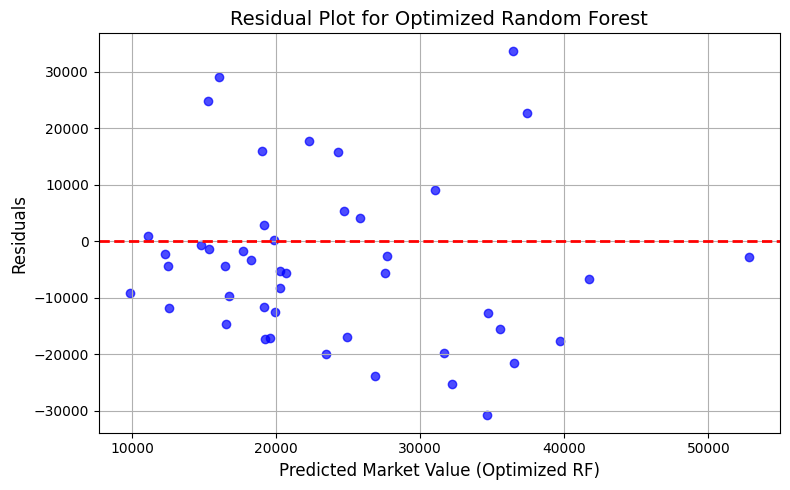

In [58]:
# Predict on the test set
y_pred_best_rf = best_random_forest.predict(X_test_scaled)

# Calculate residuals for the optimized Random Forest
residuals_rf_best = y_test - y_pred_best_rf

# Plot residuals
plt.figure(figsize=(8, 5))
plt.scatter(y_pred_best_rf, residuals_rf_best, alpha=0.7, color="blue")
plt.axhline(0, color="red", linestyle="--", linewidth=2)
plt.xlabel("Predicted Market Value (Optimized RF)", fontsize=12)
plt.ylabel("Residuals", fontsize=12)
plt.title("Residual Plot for Optimized Random Forest", fontsize=14)
plt.grid()
plt.tight_layout()
plt.show()

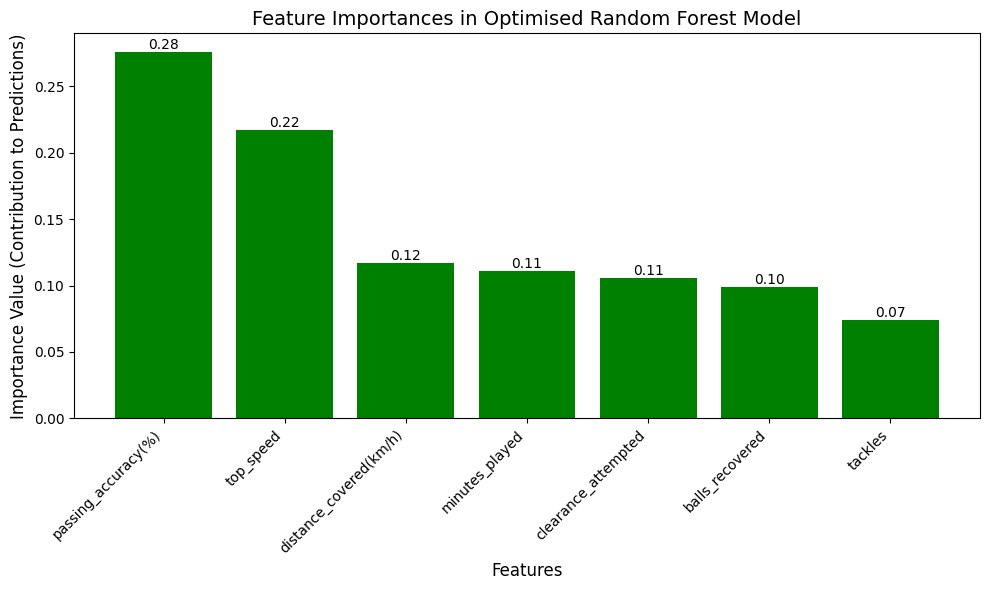

In [59]:
# Feature names and their importances from the optimized Random Forest
features = selected_features # Replace this with the list of features used in your model
importances = best_random_forest.feature_importances_  # Extract feature importances from optimized RF

# Sort feature importances for better display
feature_importances = pd.DataFrame({'Feature': features, 'Importance': importances})
feature_importances = feature_importances.sort_values(by="Importance", ascending=False)

# Create a bar chart for feature importances
plt.figure(figsize=(10, 6))
bars = plt.bar(feature_importances['Feature'], feature_importances['Importance'], 
               color=['green' if imp > 0 else 'red' for imp in feature_importances['Importance']])

# Add labels on the bars
for bar in bars:
    yval = bar.get_height()
    plt.text(bar.get_x() + bar.get_width() / 2, yval, f'{yval:.2f}', ha='center', va='bottom', fontsize=10)

# Chart formatting
plt.title('Feature Importances in Optimised Random Forest Model', fontsize=14)
plt.xlabel('Features', fontsize=12)
plt.ylabel('Importance Value (Contribution to Predictions)', fontsize=12)
plt.xticks(rotation=45, ha='right')  # Rotate feature labels for better readability
plt.tight_layout()
plt.show()

In [45]:
# Recreate DataFrame from the scaled array
X_test_scaled_df = pd.DataFrame(X_test_scaled, columns=selected_features)

# Verify the DataFrame looks correct
print(X_test_scaled_df.head())

   balls_recovered   tackles  clearance_attempted  passing_accuracy(%)  \
0        -0.368928 -1.147880            -0.131840             0.336526   
1        -1.380463 -0.779809            -1.117851            -0.644310   
2         0.867393  2.532821             0.525501            -0.610488   
3        -0.930892 -1.147880            -0.953516             0.370348   
4        -1.155677 -1.147880             0.196831             0.505636   

   minutes_played  distance_covered(km/h)  top_speed  
0       -0.713906               -0.729100  -1.073693  
1       -1.640132               -1.636360  -1.233670  
2        1.219087                1.545390   0.521375  
3       -0.955530               -0.991839  -1.068987  
4       -0.826664               -0.855891   1.184810  


# Building The Model (XGBoost)

In [64]:
# Define the refined GridSearch hyperparameter grid
param_grid = {
    'learning_rate': [0.01, 0.05, 0.1],
    'n_estimators': [300, 500, 700],
    'max_depth': [3, 5, 7],
    'subsample': [0.5, 0.7, 0.8],
    'colsample_bytree': [0.8, 0.9, 1.0],
    'min_child_weight': [1, 3, 5],
    'gamma': [0, 0.1, 0.2],
    'reg_alpha': [0, 0.1, 0.5],
    'reg_lambda': [1, 1.5, 2]
}

# Initialize XGBoost Regressor
xgb = XGBRegressor(random_state=42)

# Initialize GridSearchCV
grid_search = GridSearchCV(
    estimator=xgb,
    param_grid=param_grid,
    scoring='r2',        # Maximize R² Score
    cv=5,                # 5-fold cross-validation
    verbose=2,
    n_jobs=-1
)

# Perform GridSearchCV on the training data
grid_search.fit(X_train_scaled, y_train)

# Extract the best parameters
print("Best Parameters:", grid_search.best_params_)
print("Best R² Score (Cross-Validation):", grid_search.best_score_)

# Evaluate the model on the test set
best_model = grid_search.best_estimator_

# Add Early Stopping
best_model.fit(
    X_train_scaled,
    y_train,
    early_stopping_rounds=25,
    eval_set=[(X_test_scaled, y_test)],
    eval_metric="rmse"
)
y_pred = best_model.predict(X_test_scaled)

# Evaluate performance on test data
mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)
print(f"Final Mean Squared Error (MSE): {mse}")
print(f"Final R² Score: {r2}")

Fitting 5 folds for each of 19683 candidates, totalling 98415 fits
[CV] END colsample_bytree=1.0, learning_rate=0.1, max_depth=15, n_estimators=700, subsample=0.8; total time=   0.7s
[CV] END colsample_bytree=1.0, learning_rate=0.1, max_depth=15, n_estimators=700, subsample=0.8; total time=   0.8s
[CV] END colsample_bytree=1.0, learning_rate=0.1, max_depth=15, n_estimators=700, subsample=1.0; total time=   0.7s
[CV] END colsample_bytree=1.0, learning_rate=0.2, max_depth=3, n_estimators=100, subsample=0.7; total time=   0.0s
[CV] END colsample_bytree=1.0, learning_rate=0.2, max_depth=3, n_estimators=100, subsample=0.8; total time=   0.0s
[CV] END colsample_bytree=1.0, learning_rate=0.2, max_depth=3, n_estimators=100, subsample=0.8; total time=   0.1s
[CV] END colsample_bytree=1.0, learning_rate=0.2, max_depth=3, n_estimators=100, subsample=1.0; total time=   0.1s
[CV] END colsample_bytree=1.0, learning_rate=0.2, max_depth=3, n_estimators=100, subsample=1.0; total time=   0.1s
[CV] END c

[CV] END colsample_bytree=1.0, learning_rate=0.2, max_depth=5, n_estimators=100, subsample=1.0; total time=   0.1s
[CV] END colsample_bytree=1.0, learning_rate=0.2, max_depth=5, n_estimators=300, subsample=0.7; total time=   0.2s
[CV] END colsample_bytree=1.0, learning_rate=0.2, max_depth=5, n_estimators=300, subsample=0.7; total time=   0.3s
[CV] END colsample_bytree=1.0, learning_rate=0.2, max_depth=5, n_estimators=300, subsample=0.8; total time=   0.2s
[CV] END colsample_bytree=1.0, learning_rate=0.2, max_depth=5, n_estimators=300, subsample=0.8; total time=   0.4s
[CV] END colsample_bytree=1.0, learning_rate=0.2, max_depth=5, n_estimators=500, subsample=0.5; total time=   0.4s
[CV] END colsample_bytree=1.0, learning_rate=0.2, max_depth=5, n_estimators=500, subsample=0.5; total time=   0.4s
[CV] END colsample_bytree=1.0, learning_rate=0.2, max_depth=5, n_estimators=500, subsample=0.8; total time=   0.5s
[CV] END colsample_bytree=1.0, learning_rate=0.2, max_depth=5, n_estimators=500,

[CV] END colsample_bytree=1.0, learning_rate=0.2, max_depth=3, n_estimators=500, subsample=1.0; total time=   0.2s
[CV] END colsample_bytree=1.0, learning_rate=0.2, max_depth=3, n_estimators=700, subsample=0.5; total time=   0.2s
[CV] END colsample_bytree=1.0, learning_rate=0.2, max_depth=3, n_estimators=700, subsample=0.7; total time=   0.3s
[CV] END colsample_bytree=1.0, learning_rate=0.2, max_depth=3, n_estimators=700, subsample=0.8; total time=   0.3s
[CV] END colsample_bytree=1.0, learning_rate=0.2, max_depth=3, n_estimators=700, subsample=0.8; total time=   0.2s
[CV] END colsample_bytree=1.0, learning_rate=0.2, max_depth=3, n_estimators=700, subsample=1.0; total time=   0.3s
[CV] END colsample_bytree=1.0, learning_rate=0.2, max_depth=5, n_estimators=100, subsample=0.5; total time=   0.1s
[CV] END colsample_bytree=1.0, learning_rate=0.2, max_depth=5, n_estimators=100, subsample=0.7; total time=   0.1s
[CV] END colsample_bytree=1.0, learning_rate=0.2, max_depth=5, n_estimators=100,

[CV] END colsample_bytree=1.0, learning_rate=0.2, max_depth=7, n_estimators=500, subsample=0.5; total time=   0.3s
[CV] END colsample_bytree=1.0, learning_rate=0.2, max_depth=7, n_estimators=500, subsample=0.5; total time=   0.4s
[CV] END colsample_bytree=1.0, learning_rate=0.2, max_depth=7, n_estimators=500, subsample=0.8; total time=   0.4s
[CV] END colsample_bytree=1.0, learning_rate=0.2, max_depth=7, n_estimators=500, subsample=0.8; total time=   0.4s
[CV] END colsample_bytree=1.0, learning_rate=0.2, max_depth=7, n_estimators=500, subsample=1.0; total time=   0.3s
[CV] END colsample_bytree=1.0, learning_rate=0.2, max_depth=7, n_estimators=500, subsample=1.0; total time=   0.4s
[CV] END colsample_bytree=1.0, learning_rate=0.2, max_depth=7, n_estimators=700, subsample=0.7; total time=   0.4s
[CV] END colsample_bytree=1.0, learning_rate=0.2, max_depth=7, n_estimators=700, subsample=0.7; total time=   0.8s
[CV] END colsample_bytree=1.0, learning_rate=0.2, max_depth=7, n_estimators=700,

[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=3, min_child_weight=1, n_estimators=300, reg_alpha=0.5, reg_lambda=2, subsample=0.8; total time=   0.1s
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=3, min_child_weight=1, n_estimators=500, reg_alpha=0, reg_lambda=1, subsample=0.7; total time=   0.2s
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=3, min_child_weight=1, n_estimators=500, reg_alpha=0, reg_lambda=1, subsample=0.7; total time=   0.1s
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=3, min_child_weight=1, n_estimators=500, reg_alpha=0, reg_lambda=1, subsample=0.8; total time=   0.1s
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=3, min_child_weight=1, n_estimators=500, reg_alpha=0, reg_lambda=1, subsample=0.8; total time=   0.2s
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=3, min_child_weight=1, n_estimators=500, reg_alpha=0, reg_lambda=1.5

[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=3, min_child_weight=1, n_estimators=500, reg_alpha=0, reg_lambda=1.5, subsample=0.7; total time=   0.2s
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=3, min_child_weight=1, n_estimators=500, reg_alpha=0, reg_lambda=1.5, subsample=0.8; total time=   0.2s
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=3, min_child_weight=1, n_estimators=500, reg_alpha=0, reg_lambda=1.5, subsample=0.8; total time=   0.2s
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=3, min_child_weight=1, n_estimators=500, reg_alpha=0, reg_lambda=2, subsample=0.7; total time=   0.2s
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=3, min_child_weight=1, n_estimators=500, reg_alpha=0, reg_lambda=2, subsample=0.7; total time=   0.2s
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=3, min_child_weight=1, n_estimators=500, reg_alpha=0, reg_lambda

[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=3, min_child_weight=1, n_estimators=500, reg_alpha=0, reg_lambda=2, subsample=0.8; total time=   0.2s
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=3, min_child_weight=1, n_estimators=500, reg_alpha=0, reg_lambda=2, subsample=0.8; total time=   0.1s
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=3, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=1, subsample=0.5; total time=   0.1s
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=3, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=1, subsample=0.7; total time=   0.1s
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=3, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=1, subsample=0.8; total time=   0.2s
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=3, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lamb

[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=3, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=1, subsample=0.7; total time=   0.2s
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=3, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=1, subsample=0.7; total time=   0.2s
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=3, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=1, subsample=0.8; total time=   0.2s
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=3, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=1, subsample=0.8; total time=   0.1s
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=3, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=1.5, subsample=0.7; total time=   0.1s
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=3, min_child_weight=1, n_estimators=500, reg_alpha=0.5, re

[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=5, min_child_weight=3, n_estimators=300, reg_alpha=0, reg_lambda=1, subsample=0.7; total time=   0.1s
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=5, min_child_weight=3, n_estimators=300, reg_alpha=0, reg_lambda=1.5, subsample=0.5; total time=   0.1s
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=5, min_child_weight=3, n_estimators=300, reg_alpha=0, reg_lambda=1.5, subsample=0.5; total time=   0.1s
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=5, min_child_weight=3, n_estimators=300, reg_alpha=0, reg_lambda=1.5, subsample=0.7; total time=   0.1s
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=5, min_child_weight=3, n_estimators=300, reg_alpha=0, reg_lambda=1.5, subsample=0.8; total time=   0.1s
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=5, min_child_weight=3, n_estimators=300, reg_alpha=0, reg_lamb

[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=5, min_child_weight=3, n_estimators=300, reg_alpha=0, reg_lambda=1.5, subsample=0.8; total time=   0.1s
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=5, min_child_weight=3, n_estimators=300, reg_alpha=0, reg_lambda=2, subsample=0.5; total time=   0.1s
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=5, min_child_weight=3, n_estimators=300, reg_alpha=0, reg_lambda=2, subsample=0.7; total time=   0.1s
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=5, min_child_weight=3, n_estimators=300, reg_alpha=0, reg_lambda=2, subsample=0.8; total time=   0.1s
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=5, min_child_weight=3, n_estimators=300, reg_alpha=0, reg_lambda=2, subsample=0.8; total time=   0.1s
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=5, min_child_weight=3, n_estimators=300, reg_alpha=0.1, reg_lambda=1

[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=5, min_child_weight=3, n_estimators=300, reg_alpha=0.5, reg_lambda=2, subsample=0.8; total time=   0.1s
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=5, min_child_weight=3, n_estimators=300, reg_alpha=0.5, reg_lambda=2, subsample=0.8; total time=   0.1s
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=0, reg_lambda=1, subsample=0.5; total time=   0.2s
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=0, reg_lambda=1, subsample=0.5; total time=   0.2s
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=0, reg_lambda=1, subsample=0.8; total time=   0.2s
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=0, reg_lambda=1

[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=7, min_child_weight=3, n_estimators=700, reg_alpha=0, reg_lambda=1.5, subsample=0.7; total time=   0.3s
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=7, min_child_weight=3, n_estimators=700, reg_alpha=0, reg_lambda=1.5, subsample=0.8; total time=   0.3s
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=7, min_child_weight=3, n_estimators=700, reg_alpha=0, reg_lambda=2, subsample=0.5; total time=   0.3s
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=7, min_child_weight=3, n_estimators=700, reg_alpha=0, reg_lambda=2, subsample=0.7; total time=   0.3s
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=7, min_child_weight=3, n_estimators=700, reg_alpha=0, reg_lambda=2, subsample=0.7; total time=   0.3s
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=7, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda

[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=7, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=1.5, subsample=0.8; total time=   0.3s
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=7, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=1.5, subsample=0.8; total time=   0.3s
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=7, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=2, subsample=0.5; total time=   0.3s
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=7, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=2, subsample=0.7; total time=   0.4s
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=7, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=2, subsample=0.8; total time=   0.4s
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=7, min_child_weight=3, n_estimators=700, reg_alpha=0.1, 

[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=7, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=1, subsample=0.7; total time=   0.3s
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=7, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=1, subsample=0.8; total time=   0.4s
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=7, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=1.5, subsample=0.5; total time=   0.3s
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=7, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=1.5, subsample=0.7; total time=   0.3s
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=7, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=1.5, subsample=0.8; total time=   0.3s
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=7, min_child_weight=3, n_estimators=700, reg_alpha=0.1

[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=7, min_child_weight=5, n_estimators=300, reg_alpha=0, reg_lambda=1.5, subsample=0.7; total time=   0.1s
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=7, min_child_weight=5, n_estimators=300, reg_alpha=0, reg_lambda=1.5, subsample=0.8; total time=   0.1s
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=7, min_child_weight=5, n_estimators=300, reg_alpha=0, reg_lambda=2, subsample=0.5; total time=   0.1s
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=7, min_child_weight=5, n_estimators=300, reg_alpha=0, reg_lambda=2, subsample=0.5; total time=   0.1s
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=7, min_child_weight=5, n_estimators=300, reg_alpha=0, reg_lambda=2, subsample=0.8; total time=   0.1s
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=7, min_child_weight=5, n_estimators=300, reg_alpha=0, reg_lambda=2

[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.05, max_depth=3, min_child_weight=5, n_estimators=500, reg_alpha=0, reg_lambda=2, subsample=0.5; total time=   0.1s
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.05, max_depth=3, min_child_weight=5, n_estimators=500, reg_alpha=0, reg_lambda=2, subsample=0.7; total time=   0.2s
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.05, max_depth=3, min_child_weight=5, n_estimators=500, reg_alpha=0, reg_lambda=2, subsample=0.7; total time=   0.1s
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.05, max_depth=3, min_child_weight=5, n_estimators=500, reg_alpha=0, reg_lambda=2, subsample=0.8; total time=   0.2s
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.05, max_depth=3, min_child_weight=5, n_estimators=500, reg_alpha=0.1, reg_lambda=1, subsample=0.5; total time=   0.1s
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.05, max_depth=3, min_child_weight=5, n_estimators=500, reg_alpha=0.1, reg_lambda=1

[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.05, max_depth=3, min_child_weight=5, n_estimators=500, reg_alpha=0.1, reg_lambda=2, subsample=0.7; total time=   0.2s
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.05, max_depth=3, min_child_weight=5, n_estimators=500, reg_alpha=0.1, reg_lambda=2, subsample=0.7; total time=   0.2s
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.05, max_depth=3, min_child_weight=5, n_estimators=500, reg_alpha=0.1, reg_lambda=2, subsample=0.8; total time=   0.1s
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.05, max_depth=3, min_child_weight=5, n_estimators=500, reg_alpha=0.1, reg_lambda=2, subsample=0.8; total time=   0.2s
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.05, max_depth=3, min_child_weight=5, n_estimators=500, reg_alpha=0.5, reg_lambda=1, subsample=0.7; total time=   0.1s
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.05, max_depth=3, min_child_weight=5, n_estimators=500, reg_alpha=0.5, reg_

[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.05, max_depth=3, min_child_weight=5, n_estimators=500, reg_alpha=0.1, reg_lambda=2, subsample=0.7; total time=   0.2s
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.05, max_depth=3, min_child_weight=5, n_estimators=500, reg_alpha=0.5, reg_lambda=1, subsample=0.5; total time=   0.1s
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.05, max_depth=3, min_child_weight=5, n_estimators=500, reg_alpha=0.5, reg_lambda=1, subsample=0.5; total time=   0.1s
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.05, max_depth=3, min_child_weight=5, n_estimators=500, reg_alpha=0.5, reg_lambda=1, subsample=0.7; total time=   0.1s
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.05, max_depth=3, min_child_weight=5, n_estimators=500, reg_alpha=0.5, reg_lambda=1, subsample=0.7; total time=   0.2s
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.05, max_depth=3, min_child_weight=5, n_estimators=500, reg_alpha=0.5, reg_

[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.05, max_depth=3, min_child_weight=5, n_estimators=700, reg_alpha=0.1, reg_lambda=1, subsample=0.8; total time=   0.3s
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.05, max_depth=3, min_child_weight=5, n_estimators=700, reg_alpha=0.1, reg_lambda=1, subsample=0.8; total time=   0.2s
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.05, max_depth=3, min_child_weight=5, n_estimators=700, reg_alpha=0.1, reg_lambda=1.5, subsample=0.5; total time=   0.3s
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.05, max_depth=3, min_child_weight=5, n_estimators=700, reg_alpha=0.1, reg_lambda=1.5, subsample=0.5; total time=   0.2s
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.05, max_depth=3, min_child_weight=5, n_estimators=700, reg_alpha=0.1, reg_lambda=1.5, subsample=0.8; total time=   0.3s
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.05, max_depth=3, min_child_weight=5, n_estimators=700, reg_alpha=0.1

[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.05, max_depth=7, min_child_weight=1, n_estimators=300, reg_alpha=0.1, reg_lambda=1, subsample=0.7; total time=   0.2s
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.05, max_depth=7, min_child_weight=1, n_estimators=300, reg_alpha=0.1, reg_lambda=1, subsample=0.8; total time=   0.2s
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.05, max_depth=7, min_child_weight=1, n_estimators=300, reg_alpha=0.1, reg_lambda=1.5, subsample=0.5; total time=   0.1s
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.05, max_depth=7, min_child_weight=1, n_estimators=300, reg_alpha=0.1, reg_lambda=1.5, subsample=0.7; total time=   0.2s
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.05, max_depth=7, min_child_weight=1, n_estimators=300, reg_alpha=0.1, reg_lambda=1.5, subsample=0.7; total time=   0.2s
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.05, max_depth=7, min_child_weight=1, n_estimators=300, reg_alpha=0.1

[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.05, max_depth=7, min_child_weight=1, n_estimators=300, reg_alpha=0.5, reg_lambda=1, subsample=0.8; total time=   0.2s
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.05, max_depth=7, min_child_weight=1, n_estimators=300, reg_alpha=0.5, reg_lambda=1.5, subsample=0.5; total time=   0.1s
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.05, max_depth=7, min_child_weight=1, n_estimators=300, reg_alpha=0.5, reg_lambda=1.5, subsample=0.7; total time=   0.1s
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.05, max_depth=7, min_child_weight=1, n_estimators=300, reg_alpha=0.5, reg_lambda=1.5, subsample=0.8; total time=   0.2s
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.05, max_depth=7, min_child_weight=1, n_estimators=300, reg_alpha=0.5, reg_lambda=1.5, subsample=0.8; total time=   0.2s
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.05, max_depth=7, min_child_weight=1, n_estimators=300, reg_alpha=0

[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.05, max_depth=7, min_child_weight=1, n_estimators=300, reg_alpha=0.5, reg_lambda=1, subsample=0.7; total time=   0.1s
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.05, max_depth=7, min_child_weight=1, n_estimators=300, reg_alpha=0.5, reg_lambda=1, subsample=0.7; total time=   0.2s
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.05, max_depth=7, min_child_weight=1, n_estimators=300, reg_alpha=0.5, reg_lambda=1.5, subsample=0.5; total time=   0.1s
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.05, max_depth=7, min_child_weight=1, n_estimators=300, reg_alpha=0.5, reg_lambda=1.5, subsample=0.5; total time=   0.2s
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.05, max_depth=7, min_child_weight=1, n_estimators=300, reg_alpha=0.5, reg_lambda=1.5, subsample=0.7; total time=   0.2s
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.05, max_depth=7, min_child_weight=1, n_estimators=300, reg_alpha=0.5

[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.05, max_depth=7, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=1.5, subsample=0.8; total time=   0.3s
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.05, max_depth=7, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=1.5, subsample=0.8; total time=   0.3s
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.05, max_depth=7, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=2, subsample=0.7; total time=   0.2s
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.05, max_depth=7, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=2, subsample=0.7; total time=   0.3s
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.05, max_depth=7, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=2, subsample=0.8; total time=   0.3s
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.05, max_depth=7, min_child_weight=1, n_estimators=500, reg_alpha=0.1, 

[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.1, max_depth=3, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=1.5, subsample=0.7; total time=   0.2s
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.1, max_depth=3, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=1.5, subsample=0.8; total time=   0.3s
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.1, max_depth=3, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=1.5, subsample=0.8; total time=   0.3s
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.1, max_depth=3, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=2, subsample=0.7; total time=   0.3s
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.1, max_depth=3, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=2, subsample=0.7; total time=   0.3s
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.1, max_depth=3, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_

[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.1, max_depth=3, min_child_weight=1, n_estimators=700, reg_alpha=0.5, reg_lambda=1.5, subsample=0.8; total time=   0.2s
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.1, max_depth=3, min_child_weight=1, n_estimators=700, reg_alpha=0.5, reg_lambda=2, subsample=0.5; total time=   0.2s
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.1, max_depth=3, min_child_weight=1, n_estimators=700, reg_alpha=0.5, reg_lambda=2, subsample=0.5; total time=   0.2s
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.1, max_depth=3, min_child_weight=1, n_estimators=700, reg_alpha=0.5, reg_lambda=2, subsample=0.8; total time=   0.2s
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.1, max_depth=3, min_child_weight=1, n_estimators=700, reg_alpha=0.5, reg_lambda=2, subsample=0.8; total time=   0.2s
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.1, max_depth=3, min_child_weight=3, n_estimators=300, reg_alpha=0, reg_lambda

[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.1, max_depth=3, min_child_weight=1, n_estimators=700, reg_alpha=0.5, reg_lambda=2, subsample=0.5; total time=   0.2s
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.1, max_depth=3, min_child_weight=1, n_estimators=700, reg_alpha=0.5, reg_lambda=2, subsample=0.7; total time=   0.2s
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.1, max_depth=3, min_child_weight=1, n_estimators=700, reg_alpha=0.5, reg_lambda=2, subsample=0.8; total time=   0.2s
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.1, max_depth=3, min_child_weight=1, n_estimators=700, reg_alpha=0.5, reg_lambda=2, subsample=0.8; total time=   0.2s
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.1, max_depth=3, min_child_weight=3, n_estimators=300, reg_alpha=0, reg_lambda=1, subsample=0.7; total time=   0.1s
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.1, max_depth=3, min_child_weight=3, n_estimators=300, reg_alpha=0, reg_lambda=1, 

[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.1, max_depth=3, min_child_weight=3, n_estimators=300, reg_alpha=0.5, reg_lambda=1, subsample=0.5; total time=   0.1s
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.1, max_depth=3, min_child_weight=3, n_estimators=300, reg_alpha=0.5, reg_lambda=1, subsample=0.5; total time=   0.1s
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.1, max_depth=3, min_child_weight=3, n_estimators=300, reg_alpha=0.5, reg_lambda=1, subsample=0.8; total time=   0.1s
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.1, max_depth=3, min_child_weight=3, n_estimators=300, reg_alpha=0.5, reg_lambda=1, subsample=0.8; total time=   0.1s
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.1, max_depth=3, min_child_weight=3, n_estimators=300, reg_alpha=0.5, reg_lambda=1.5, subsample=0.5; total time=   0.1s
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.1, max_depth=3, min_child_weight=3, n_estimators=300, reg_alpha=0.5, reg_lamb

[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.1, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=0.1, reg_lambda=2, subsample=0.8; total time=   0.2s
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.1, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=1, subsample=0.5; total time=   0.2s
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.1, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=1, subsample=0.5; total time=   0.2s
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.1, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=1, subsample=0.8; total time=   0.2s
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.1, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=1, subsample=0.8; total time=   0.2s
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.1, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda

[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.1, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=0, reg_lambda=1, subsample=0.5; total time=   0.2s
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.1, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=0, reg_lambda=1, subsample=0.7; total time=   0.3s
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.1, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=0, reg_lambda=1, subsample=0.8; total time=   0.3s
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.1, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=0, reg_lambda=1, subsample=0.8; total time=   0.5s
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.1, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=0, reg_lambda=1.5, subsample=0.7; total time=   0.3s
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.1, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=0, reg_lambda=1.5, subs

[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.1, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=2, subsample=0.7; total time=   0.3s
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.1, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=2, subsample=0.7; total time=   0.3s
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.1, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=2, subsample=0.8; total time=   0.3s
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.1, max_depth=5, min_child_weight=5, n_estimators=300, reg_alpha=0, reg_lambda=1, subsample=0.5; total time=   0.1s
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.1, max_depth=5, min_child_weight=5, n_estimators=300, reg_alpha=0, reg_lambda=1, subsample=0.7; total time=   0.1s
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.1, max_depth=5, min_child_weight=5, n_estimators=300, reg_alpha=0, reg_lambda=1, su

[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.1, max_depth=7, min_child_weight=5, n_estimators=300, reg_alpha=0.5, reg_lambda=1.5, subsample=0.5; total time=   0.1s
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.1, max_depth=7, min_child_weight=5, n_estimators=300, reg_alpha=0.5, reg_lambda=1.5, subsample=0.7; total time=   0.1s
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.1, max_depth=7, min_child_weight=5, n_estimators=300, reg_alpha=0.5, reg_lambda=1.5, subsample=0.8; total time=   0.1s
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.1, max_depth=7, min_child_weight=5, n_estimators=300, reg_alpha=0.5, reg_lambda=2, subsample=0.5; total time=   0.1s
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.1, max_depth=7, min_child_weight=5, n_estimators=300, reg_alpha=0.5, reg_lambda=2, subsample=0.5; total time=   0.1s
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.1, max_depth=7, min_child_weight=5, n_estimators=300, reg_alpha=0.5, reg_

[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.1, max_depth=7, min_child_weight=5, n_estimators=500, reg_alpha=0, reg_lambda=1.5, subsample=0.5; total time=   0.2s
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.1, max_depth=7, min_child_weight=5, n_estimators=500, reg_alpha=0, reg_lambda=1.5, subsample=0.7; total time=   0.2s
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.1, max_depth=7, min_child_weight=5, n_estimators=500, reg_alpha=0, reg_lambda=1.5, subsample=0.7; total time=   0.3s
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.1, max_depth=7, min_child_weight=5, n_estimators=500, reg_alpha=0, reg_lambda=2, subsample=0.5; total time=   0.2s
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.1, max_depth=7, min_child_weight=5, n_estimators=500, reg_alpha=0, reg_lambda=2, subsample=0.5; total time=   0.2s
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.1, max_depth=7, min_child_weight=5, n_estimators=500, reg_alpha=0, reg_lambda=2, su

[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.1, max_depth=7, min_child_weight=5, n_estimators=500, reg_alpha=0, reg_lambda=1.5, subsample=0.5; total time=   0.2s
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.1, max_depth=7, min_child_weight=5, n_estimators=500, reg_alpha=0, reg_lambda=1.5, subsample=0.5; total time=   0.2s
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.1, max_depth=7, min_child_weight=5, n_estimators=500, reg_alpha=0, reg_lambda=1.5, subsample=0.8; total time=   0.3s
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.1, max_depth=7, min_child_weight=5, n_estimators=500, reg_alpha=0, reg_lambda=1.5, subsample=0.8; total time=   0.2s
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.1, max_depth=7, min_child_weight=5, n_estimators=500, reg_alpha=0, reg_lambda=2, subsample=0.5; total time=   0.2s
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.1, max_depth=7, min_child_weight=5, n_estimators=500, reg_alpha=0, reg_lambda=2, 

[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.1, max_depth=7, min_child_weight=5, n_estimators=700, reg_alpha=0, reg_lambda=1, subsample=0.7; total time=   0.3s
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.1, max_depth=7, min_child_weight=5, n_estimators=700, reg_alpha=0, reg_lambda=1, subsample=0.7; total time=   0.3s
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.1, max_depth=7, min_child_weight=5, n_estimators=700, reg_alpha=0, reg_lambda=1, subsample=0.8; total time=   0.3s
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.1, max_depth=7, min_child_weight=5, n_estimators=700, reg_alpha=0, reg_lambda=1.5, subsample=0.5; total time=   0.3s
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.1, max_depth=7, min_child_weight=5, n_estimators=700, reg_alpha=0, reg_lambda=1.5, subsample=0.7; total time=   0.3s
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.1, max_depth=7, min_child_weight=5, n_estimators=700, reg_alpha=0, reg_lambda=1.5, su

[CV] END colsample_bytree=0.8, gamma=0.1, learning_rate=0.01, max_depth=3, min_child_weight=5, n_estimators=700, reg_alpha=0.5, reg_lambda=1, subsample=0.8; total time=   0.2s
[CV] END colsample_bytree=0.8, gamma=0.1, learning_rate=0.01, max_depth=3, min_child_weight=5, n_estimators=700, reg_alpha=0.5, reg_lambda=1.5, subsample=0.5; total time=   0.2s
[CV] END colsample_bytree=0.8, gamma=0.1, learning_rate=0.01, max_depth=3, min_child_weight=5, n_estimators=700, reg_alpha=0.5, reg_lambda=1.5, subsample=0.5; total time=   0.2s
[CV] END colsample_bytree=0.8, gamma=0.1, learning_rate=0.01, max_depth=3, min_child_weight=5, n_estimators=700, reg_alpha=0.5, reg_lambda=1.5, subsample=0.8; total time=   0.2s
[CV] END colsample_bytree=0.8, gamma=0.1, learning_rate=0.01, max_depth=3, min_child_weight=5, n_estimators=700, reg_alpha=0.5, reg_lambda=1.5, subsample=0.8; total time=   0.2s
[CV] END colsample_bytree=0.8, gamma=0.1, learning_rate=0.01, max_depth=3, min_child_weight=5, n_estimators=700,

[CV] END colsample_bytree=0.8, gamma=0.1, learning_rate=0.01, max_depth=5, min_child_weight=5, n_estimators=500, reg_alpha=0, reg_lambda=1.5, subsample=0.7; total time=   0.2s
[CV] END colsample_bytree=0.8, gamma=0.1, learning_rate=0.01, max_depth=5, min_child_weight=5, n_estimators=500, reg_alpha=0, reg_lambda=1.5, subsample=0.8; total time=   0.2s
[CV] END colsample_bytree=0.8, gamma=0.1, learning_rate=0.01, max_depth=5, min_child_weight=5, n_estimators=500, reg_alpha=0, reg_lambda=2, subsample=0.5; total time=   0.2s
[CV] END colsample_bytree=0.8, gamma=0.1, learning_rate=0.01, max_depth=5, min_child_weight=5, n_estimators=500, reg_alpha=0, reg_lambda=2, subsample=0.7; total time=   0.2s
[CV] END colsample_bytree=0.8, gamma=0.1, learning_rate=0.01, max_depth=5, min_child_weight=5, n_estimators=500, reg_alpha=0, reg_lambda=2, subsample=0.7; total time=   0.2s
[CV] END colsample_bytree=0.8, gamma=0.1, learning_rate=0.01, max_depth=5, min_child_weight=5, n_estimators=500, reg_alpha=0.1

[CV] END colsample_bytree=0.8, gamma=0.1, learning_rate=0.01, max_depth=5, min_child_weight=1, n_estimators=300, reg_alpha=0, reg_lambda=1, subsample=0.5; total time=   0.1s
[CV] END colsample_bytree=0.8, gamma=0.1, learning_rate=0.01, max_depth=5, min_child_weight=1, n_estimators=300, reg_alpha=0, reg_lambda=1, subsample=0.5; total time=   0.1s
[CV] END colsample_bytree=0.8, gamma=0.1, learning_rate=0.01, max_depth=5, min_child_weight=1, n_estimators=300, reg_alpha=0, reg_lambda=1, subsample=0.8; total time=   0.1s
[CV] END colsample_bytree=0.8, gamma=0.1, learning_rate=0.01, max_depth=5, min_child_weight=1, n_estimators=300, reg_alpha=0, reg_lambda=1, subsample=0.8; total time=   0.1s
[CV] END colsample_bytree=0.8, gamma=0.1, learning_rate=0.01, max_depth=5, min_child_weight=1, n_estimators=300, reg_alpha=0, reg_lambda=1.5, subsample=0.5; total time=   0.1s
[CV] END colsample_bytree=0.8, gamma=0.1, learning_rate=0.01, max_depth=5, min_child_weight=1, n_estimators=300, reg_alpha=0, re

[CV] END colsample_bytree=0.8, gamma=0.1, learning_rate=0.01, max_depth=5, min_child_weight=1, n_estimators=300, reg_alpha=0, reg_lambda=1.5, subsample=0.5; total time=   0.1s
[CV] END colsample_bytree=0.8, gamma=0.1, learning_rate=0.01, max_depth=5, min_child_weight=1, n_estimators=300, reg_alpha=0, reg_lambda=1.5, subsample=0.7; total time=   0.1s
[CV] END colsample_bytree=0.8, gamma=0.1, learning_rate=0.01, max_depth=5, min_child_weight=1, n_estimators=300, reg_alpha=0, reg_lambda=1.5, subsample=0.8; total time=   0.1s
[CV] END colsample_bytree=0.8, gamma=0.1, learning_rate=0.01, max_depth=5, min_child_weight=1, n_estimators=300, reg_alpha=0, reg_lambda=2, subsample=0.5; total time=   0.1s
[CV] END colsample_bytree=0.8, gamma=0.1, learning_rate=0.01, max_depth=5, min_child_weight=1, n_estimators=300, reg_alpha=0, reg_lambda=2, subsample=0.5; total time=   0.1s
[CV] END colsample_bytree=0.8, gamma=0.1, learning_rate=0.01, max_depth=5, min_child_weight=1, n_estimators=300, reg_alpha=0

[CV] END colsample_bytree=0.8, gamma=0.1, learning_rate=0.01, max_depth=5, min_child_weight=1, n_estimators=300, reg_alpha=0.5, reg_lambda=2, subsample=0.5; total time=   0.1s
[CV] END colsample_bytree=0.8, gamma=0.1, learning_rate=0.01, max_depth=5, min_child_weight=1, n_estimators=300, reg_alpha=0.5, reg_lambda=2, subsample=0.8; total time=   0.2s
[CV] END colsample_bytree=0.8, gamma=0.1, learning_rate=0.01, max_depth=5, min_child_weight=1, n_estimators=300, reg_alpha=0.5, reg_lambda=2, subsample=0.8; total time=   0.1s
[CV] END colsample_bytree=0.8, gamma=0.1, learning_rate=0.01, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0, reg_lambda=1, subsample=0.5; total time=   0.2s
[CV] END colsample_bytree=0.8, gamma=0.1, learning_rate=0.01, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0, reg_lambda=1, subsample=0.5; total time=   0.2s
[CV] END colsample_bytree=0.8, gamma=0.1, learning_rate=0.01, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0

[CV] END colsample_bytree=0.8, gamma=0.1, learning_rate=0.01, max_depth=7, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=2, subsample=0.7; total time=   0.3s
[CV] END colsample_bytree=0.8, gamma=0.1, learning_rate=0.01, max_depth=7, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=1, subsample=0.5; total time=   0.2s
[CV] END colsample_bytree=0.8, gamma=0.1, learning_rate=0.01, max_depth=7, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=1, subsample=0.5; total time=   0.2s
[CV] END colsample_bytree=0.8, gamma=0.1, learning_rate=0.01, max_depth=7, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=1, subsample=0.7; total time=   0.3s
[CV] END colsample_bytree=0.8, gamma=0.1, learning_rate=0.01, max_depth=7, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=1, subsample=0.7; total time=   0.3s
[CV] END colsample_bytree=0.8, gamma=0.1, learning_rate=0.01, max_depth=7, min_child_weight=1, n_estimators=500, reg_alp

[CV] END colsample_bytree=0.8, gamma=0.1, learning_rate=0.01, max_depth=7, min_child_weight=3, n_estimators=300, reg_alpha=0, reg_lambda=2, subsample=0.7; total time=   0.1s
[CV] END colsample_bytree=0.8, gamma=0.1, learning_rate=0.01, max_depth=7, min_child_weight=3, n_estimators=300, reg_alpha=0.1, reg_lambda=1, subsample=0.5; total time=   0.1s
[CV] END colsample_bytree=0.8, gamma=0.1, learning_rate=0.01, max_depth=7, min_child_weight=3, n_estimators=300, reg_alpha=0.1, reg_lambda=1, subsample=0.5; total time=   0.1s
[CV] END colsample_bytree=0.8, gamma=0.1, learning_rate=0.01, max_depth=7, min_child_weight=3, n_estimators=300, reg_alpha=0.1, reg_lambda=1, subsample=0.7; total time=   0.3s
[CV] END colsample_bytree=0.8, gamma=0.1, learning_rate=0.01, max_depth=7, min_child_weight=3, n_estimators=300, reg_alpha=0.1, reg_lambda=1, subsample=0.8; total time=   0.2s
[CV] END colsample_bytree=0.8, gamma=0.1, learning_rate=0.01, max_depth=7, min_child_weight=3, n_estimators=300, reg_alpha

[CV] END colsample_bytree=0.8, gamma=0.1, learning_rate=0.01, max_depth=7, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=2, subsample=0.7; total time=   0.3s
[CV] END colsample_bytree=0.8, gamma=0.1, learning_rate=0.01, max_depth=7, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=2, subsample=0.7; total time=   0.2s
[CV] END colsample_bytree=0.8, gamma=0.1, learning_rate=0.01, max_depth=7, min_child_weight=1, n_estimators=700, reg_alpha=0, reg_lambda=1, subsample=0.5; total time=   0.3s
[CV] END colsample_bytree=0.8, gamma=0.1, learning_rate=0.01, max_depth=7, min_child_weight=1, n_estimators=700, reg_alpha=0, reg_lambda=1, subsample=0.5; total time=   0.4s
[CV] END colsample_bytree=0.8, gamma=0.1, learning_rate=0.01, max_depth=7, min_child_weight=1, n_estimators=700, reg_alpha=0, reg_lambda=1, subsample=0.7; total time=   0.3s
[CV] END colsample_bytree=0.8, gamma=0.1, learning_rate=0.01, max_depth=7, min_child_weight=1, n_estimators=700, reg_alpha=0, 

[CV] END colsample_bytree=0.8, gamma=0.1, learning_rate=0.01, max_depth=7, min_child_weight=1, n_estimators=700, reg_alpha=0, reg_lambda=1, subsample=0.7; total time=   0.4s
[CV] END colsample_bytree=0.8, gamma=0.1, learning_rate=0.01, max_depth=7, min_child_weight=1, n_estimators=700, reg_alpha=0, reg_lambda=1, subsample=0.8; total time=   0.4s
[CV] END colsample_bytree=0.8, gamma=0.1, learning_rate=0.01, max_depth=7, min_child_weight=1, n_estimators=700, reg_alpha=0, reg_lambda=1, subsample=0.8; total time=   0.4s
[CV] END colsample_bytree=0.8, gamma=0.1, learning_rate=0.01, max_depth=7, min_child_weight=1, n_estimators=700, reg_alpha=0, reg_lambda=1.5, subsample=0.7; total time=   0.4s
[CV] END colsample_bytree=0.8, gamma=0.1, learning_rate=0.01, max_depth=7, min_child_weight=1, n_estimators=700, reg_alpha=0, reg_lambda=1.5, subsample=0.7; total time=   0.4s
[CV] END colsample_bytree=0.8, gamma=0.1, learning_rate=0.01, max_depth=7, min_child_weight=1, n_estimators=700, reg_alpha=0, 

[CV] END colsample_bytree=0.8, gamma=0.1, learning_rate=0.01, max_depth=7, min_child_weight=1, n_estimators=700, reg_alpha=0.5, reg_lambda=1.5, subsample=0.7; total time=   0.4s
[CV] END colsample_bytree=0.8, gamma=0.1, learning_rate=0.01, max_depth=7, min_child_weight=1, n_estimators=700, reg_alpha=0.5, reg_lambda=1.5, subsample=0.8; total time=   0.4s
[CV] END colsample_bytree=0.8, gamma=0.1, learning_rate=0.01, max_depth=7, min_child_weight=1, n_estimators=700, reg_alpha=0.5, reg_lambda=2, subsample=0.5; total time=   0.3s
[CV] END colsample_bytree=0.8, gamma=0.1, learning_rate=0.01, max_depth=7, min_child_weight=1, n_estimators=700, reg_alpha=0.5, reg_lambda=2, subsample=0.7; total time=   0.4s
[CV] END colsample_bytree=0.8, gamma=0.1, learning_rate=0.01, max_depth=7, min_child_weight=1, n_estimators=700, reg_alpha=0.5, reg_lambda=2, subsample=0.7; total time=   0.4s
[CV] END colsample_bytree=0.8, gamma=0.1, learning_rate=0.01, max_depth=7, min_child_weight=3, n_estimators=300, reg

[CV] END colsample_bytree=0.8, gamma=0.1, learning_rate=0.05, max_depth=3, min_child_weight=3, n_estimators=300, reg_alpha=0.1, reg_lambda=1, subsample=0.8; total time=   0.1s
[CV] END colsample_bytree=0.8, gamma=0.1, learning_rate=0.05, max_depth=3, min_child_weight=3, n_estimators=300, reg_alpha=0.1, reg_lambda=1.5, subsample=0.7; total time=   0.1s
[CV] END colsample_bytree=0.8, gamma=0.1, learning_rate=0.05, max_depth=3, min_child_weight=3, n_estimators=300, reg_alpha=0.1, reg_lambda=1.5, subsample=0.7; total time=   0.1s
[CV] END colsample_bytree=0.8, gamma=0.1, learning_rate=0.05, max_depth=3, min_child_weight=3, n_estimators=300, reg_alpha=0.1, reg_lambda=1.5, subsample=0.8; total time=   0.1s
[CV] END colsample_bytree=0.8, gamma=0.1, learning_rate=0.05, max_depth=3, min_child_weight=3, n_estimators=300, reg_alpha=0.1, reg_lambda=1.5, subsample=0.8; total time=   0.1s
[CV] END colsample_bytree=0.8, gamma=0.1, learning_rate=0.05, max_depth=3, min_child_weight=3, n_estimators=300,

[CV] END colsample_bytree=0.8, gamma=0.1, learning_rate=0.05, max_depth=3, min_child_weight=3, n_estimators=300, reg_alpha=0.5, reg_lambda=1.5, subsample=0.8; total time=   0.1s
[CV] END colsample_bytree=0.8, gamma=0.1, learning_rate=0.05, max_depth=3, min_child_weight=3, n_estimators=300, reg_alpha=0.5, reg_lambda=1.5, subsample=0.8; total time=   0.1s
[CV] END colsample_bytree=0.8, gamma=0.1, learning_rate=0.05, max_depth=3, min_child_weight=3, n_estimators=300, reg_alpha=0.5, reg_lambda=2, subsample=0.5; total time=   0.1s
[CV] END colsample_bytree=0.8, gamma=0.1, learning_rate=0.05, max_depth=3, min_child_weight=3, n_estimators=300, reg_alpha=0.5, reg_lambda=2, subsample=0.5; total time=   0.1s
[CV] END colsample_bytree=0.8, gamma=0.1, learning_rate=0.05, max_depth=3, min_child_weight=3, n_estimators=300, reg_alpha=0.5, reg_lambda=2, subsample=0.8; total time=   0.1s
[CV] END colsample_bytree=0.8, gamma=0.1, learning_rate=0.05, max_depth=3, min_child_weight=3, n_estimators=300, reg

[CV] END colsample_bytree=0.8, gamma=0.1, learning_rate=0.05, max_depth=3, min_child_weight=3, n_estimators=500, reg_alpha=0, reg_lambda=1, subsample=0.5; total time=   0.2s
[CV] END colsample_bytree=0.8, gamma=0.1, learning_rate=0.05, max_depth=3, min_child_weight=3, n_estimators=500, reg_alpha=0, reg_lambda=1, subsample=0.8; total time=   0.1s
[CV] END colsample_bytree=0.8, gamma=0.1, learning_rate=0.05, max_depth=3, min_child_weight=3, n_estimators=500, reg_alpha=0, reg_lambda=1, subsample=0.8; total time=   0.2s
[CV] END colsample_bytree=0.8, gamma=0.1, learning_rate=0.05, max_depth=3, min_child_weight=3, n_estimators=500, reg_alpha=0, reg_lambda=1.5, subsample=0.5; total time=   0.1s
[CV] END colsample_bytree=0.8, gamma=0.1, learning_rate=0.05, max_depth=3, min_child_weight=3, n_estimators=500, reg_alpha=0, reg_lambda=1.5, subsample=0.5; total time=   0.2s
[CV] END colsample_bytree=0.8, gamma=0.1, learning_rate=0.05, max_depth=3, min_child_weight=3, n_estimators=500, reg_alpha=0, 

[CV] END colsample_bytree=0.8, gamma=0.1, learning_rate=0.05, max_depth=3, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=1, subsample=0.8; total time=   0.2s
[CV] END colsample_bytree=0.8, gamma=0.1, learning_rate=0.05, max_depth=3, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=1.5, subsample=0.7; total time=   0.1s
[CV] END colsample_bytree=0.8, gamma=0.1, learning_rate=0.05, max_depth=3, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=1.5, subsample=0.7; total time=   0.2s
[CV] END colsample_bytree=0.8, gamma=0.1, learning_rate=0.05, max_depth=3, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=1.5, subsample=0.8; total time=   0.2s
[CV] END colsample_bytree=0.8, gamma=0.1, learning_rate=0.05, max_depth=3, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=1.5, subsample=0.8; total time=   0.2s
[CV] END colsample_bytree=0.8, gamma=0.1, learning_rate=0.05, max_depth=3, min_child_weight=3, n_estimators=500,

[CV] END colsample_bytree=0.8, gamma=0.1, learning_rate=0.05, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=1, subsample=0.5; total time=   0.3s
[CV] END colsample_bytree=0.8, gamma=0.1, learning_rate=0.05, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=1, subsample=0.7; total time=   0.3s
[CV] END colsample_bytree=0.8, gamma=0.1, learning_rate=0.05, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=1, subsample=0.8; total time=   0.3s
[CV] END colsample_bytree=0.8, gamma=0.1, learning_rate=0.05, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=1.5, subsample=0.5; total time=   0.3s
[CV] END colsample_bytree=0.8, gamma=0.1, learning_rate=0.05, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=1.5, subsample=0.5; total time=   0.2s
[CV] END colsample_bytree=0.8, gamma=0.1, learning_rate=0.05, max_depth=5, min_child_weight=3, n_estimators=700, reg

[CV] END colsample_bytree=0.8, gamma=0.1, learning_rate=0.05, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=1.5, subsample=0.5; total time=   0.3s
[CV] END colsample_bytree=0.8, gamma=0.1, learning_rate=0.05, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=1.5, subsample=0.5; total time=   0.2s
[CV] END colsample_bytree=0.8, gamma=0.1, learning_rate=0.05, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=1.5, subsample=0.7; total time=   0.3s
[CV] END colsample_bytree=0.8, gamma=0.1, learning_rate=0.05, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=1.5, subsample=0.8; total time=   0.3s
[CV] END colsample_bytree=0.8, gamma=0.1, learning_rate=0.05, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=2, subsample=0.5; total time=   0.2s
[CV] END colsample_bytree=0.8, gamma=0.1, learning_rate=0.05, max_depth=5, min_child_weight=3, n_estimators=700,

[CV] END colsample_bytree=0.8, gamma=0.1, learning_rate=0.05, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=2, subsample=0.5; total time=   0.2s
[CV] END colsample_bytree=0.8, gamma=0.1, learning_rate=0.05, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=2, subsample=0.7; total time=   0.3s
[CV] END colsample_bytree=0.8, gamma=0.1, learning_rate=0.05, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=2, subsample=0.7; total time=   0.3s
[CV] END colsample_bytree=0.8, gamma=0.1, learning_rate=0.05, max_depth=5, min_child_weight=5, n_estimators=300, reg_alpha=0, reg_lambda=1, subsample=0.5; total time=   0.1s
[CV] END colsample_bytree=0.8, gamma=0.1, learning_rate=0.05, max_depth=5, min_child_weight=5, n_estimators=300, reg_alpha=0, reg_lambda=1, subsample=0.5; total time=   0.1s
[CV] END colsample_bytree=0.8, gamma=0.1, learning_rate=0.05, max_depth=5, min_child_weight=5, n_estimators=300, reg_alpha=0

[CV] END colsample_bytree=0.8, gamma=0.1, learning_rate=0.05, max_depth=5, min_child_weight=5, n_estimators=300, reg_alpha=0.5, reg_lambda=1, subsample=0.5; total time=   0.1s
[CV] END colsample_bytree=0.8, gamma=0.1, learning_rate=0.05, max_depth=5, min_child_weight=5, n_estimators=300, reg_alpha=0.5, reg_lambda=1, subsample=0.7; total time=   0.1s
[CV] END colsample_bytree=0.8, gamma=0.1, learning_rate=0.05, max_depth=5, min_child_weight=5, n_estimators=300, reg_alpha=0.5, reg_lambda=1, subsample=0.7; total time=   0.1s
[CV] END colsample_bytree=0.8, gamma=0.1, learning_rate=0.05, max_depth=5, min_child_weight=5, n_estimators=300, reg_alpha=0.5, reg_lambda=1.5, subsample=0.5; total time=   0.1s
[CV] END colsample_bytree=0.8, gamma=0.1, learning_rate=0.05, max_depth=5, min_child_weight=5, n_estimators=300, reg_alpha=0.5, reg_lambda=1.5, subsample=0.5; total time=   0.3s
[CV] END colsample_bytree=0.8, gamma=0.1, learning_rate=0.05, max_depth=5, min_child_weight=5, n_estimators=300, reg

[CV] END colsample_bytree=0.8, gamma=0.1, learning_rate=0.05, max_depth=7, min_child_weight=5, n_estimators=500, reg_alpha=0, reg_lambda=2, subsample=0.5; total time=   0.2s
[CV] END colsample_bytree=0.8, gamma=0.1, learning_rate=0.05, max_depth=7, min_child_weight=5, n_estimators=500, reg_alpha=0, reg_lambda=2, subsample=0.7; total time=   0.2s
[CV] END colsample_bytree=0.8, gamma=0.1, learning_rate=0.05, max_depth=7, min_child_weight=5, n_estimators=500, reg_alpha=0, reg_lambda=2, subsample=0.7; total time=   0.2s
[CV] END colsample_bytree=0.8, gamma=0.1, learning_rate=0.05, max_depth=7, min_child_weight=5, n_estimators=500, reg_alpha=0.1, reg_lambda=1, subsample=0.5; total time=   0.2s
[CV] END colsample_bytree=0.8, gamma=0.1, learning_rate=0.05, max_depth=7, min_child_weight=5, n_estimators=500, reg_alpha=0.1, reg_lambda=1, subsample=0.5; total time=   0.2s
[CV] END colsample_bytree=0.8, gamma=0.1, learning_rate=0.05, max_depth=7, min_child_weight=5, n_estimators=500, reg_alpha=0.1

[CV] END colsample_bytree=0.8, gamma=0.1, learning_rate=0.05, max_depth=7, min_child_weight=5, n_estimators=500, reg_alpha=0.1, reg_lambda=2, subsample=0.8; total time=   0.2s
[CV] END colsample_bytree=0.8, gamma=0.1, learning_rate=0.05, max_depth=7, min_child_weight=5, n_estimators=500, reg_alpha=0.1, reg_lambda=2, subsample=0.8; total time=   0.2s
[CV] END colsample_bytree=0.8, gamma=0.1, learning_rate=0.05, max_depth=7, min_child_weight=5, n_estimators=500, reg_alpha=0.5, reg_lambda=1, subsample=0.7; total time=   0.2s
[CV] END colsample_bytree=0.8, gamma=0.1, learning_rate=0.05, max_depth=7, min_child_weight=5, n_estimators=500, reg_alpha=0.5, reg_lambda=1, subsample=0.7; total time=   0.2s
[CV] END colsample_bytree=0.8, gamma=0.1, learning_rate=0.05, max_depth=7, min_child_weight=5, n_estimators=500, reg_alpha=0.5, reg_lambda=1, subsample=0.8; total time=   0.2s
[CV] END colsample_bytree=0.8, gamma=0.1, learning_rate=0.05, max_depth=7, min_child_weight=5, n_estimators=500, reg_alp

[CV] END colsample_bytree=0.8, gamma=0.1, learning_rate=0.05, max_depth=7, min_child_weight=5, n_estimators=500, reg_alpha=0.5, reg_lambda=1, subsample=0.7; total time=   0.2s
[CV] END colsample_bytree=0.8, gamma=0.1, learning_rate=0.05, max_depth=7, min_child_weight=5, n_estimators=500, reg_alpha=0.5, reg_lambda=1.5, subsample=0.5; total time=   0.2s
[CV] END colsample_bytree=0.8, gamma=0.1, learning_rate=0.05, max_depth=7, min_child_weight=5, n_estimators=500, reg_alpha=0.5, reg_lambda=1.5, subsample=0.5; total time=   0.2s
[CV] END colsample_bytree=0.8, gamma=0.1, learning_rate=0.05, max_depth=7, min_child_weight=5, n_estimators=500, reg_alpha=0.5, reg_lambda=1.5, subsample=0.7; total time=   0.3s
[CV] END colsample_bytree=0.8, gamma=0.1, learning_rate=0.05, max_depth=7, min_child_weight=5, n_estimators=500, reg_alpha=0.5, reg_lambda=1.5, subsample=0.7; total time=   0.2s
[CV] END colsample_bytree=0.8, gamma=0.1, learning_rate=0.05, max_depth=7, min_child_weight=5, n_estimators=500,

[CV] END colsample_bytree=0.8, gamma=0.1, learning_rate=0.05, max_depth=7, min_child_weight=5, n_estimators=700, reg_alpha=0.5, reg_lambda=1, subsample=0.7; total time=   0.3s
[CV] END colsample_bytree=0.8, gamma=0.1, learning_rate=0.05, max_depth=7, min_child_weight=5, n_estimators=700, reg_alpha=0.5, reg_lambda=1, subsample=0.8; total time=   0.3s
[CV] END colsample_bytree=0.8, gamma=0.1, learning_rate=0.05, max_depth=7, min_child_weight=5, n_estimators=700, reg_alpha=0.5, reg_lambda=1, subsample=0.8; total time=   0.3s
[CV] END colsample_bytree=0.8, gamma=0.1, learning_rate=0.05, max_depth=7, min_child_weight=5, n_estimators=700, reg_alpha=0.5, reg_lambda=1.5, subsample=0.7; total time=   0.3s
[CV] END colsample_bytree=0.8, gamma=0.1, learning_rate=0.05, max_depth=7, min_child_weight=5, n_estimators=700, reg_alpha=0.5, reg_lambda=1.5, subsample=0.7; total time=   0.3s
[CV] END colsample_bytree=0.8, gamma=0.1, learning_rate=0.05, max_depth=7, min_child_weight=5, n_estimators=700, reg

[CV] END colsample_bytree=0.8, gamma=0.1, learning_rate=0.1, max_depth=5, min_child_weight=1, n_estimators=300, reg_alpha=0, reg_lambda=1, subsample=0.8; total time=   0.1s
[CV] END colsample_bytree=0.8, gamma=0.1, learning_rate=0.1, max_depth=5, min_child_weight=1, n_estimators=300, reg_alpha=0, reg_lambda=1.5, subsample=0.7; total time=   0.1s
[CV] END colsample_bytree=0.8, gamma=0.1, learning_rate=0.1, max_depth=5, min_child_weight=1, n_estimators=300, reg_alpha=0, reg_lambda=1.5, subsample=0.7; total time=   0.1s
[CV] END colsample_bytree=0.8, gamma=0.1, learning_rate=0.1, max_depth=5, min_child_weight=1, n_estimators=300, reg_alpha=0, reg_lambda=1.5, subsample=0.8; total time=   0.1s
[CV] END colsample_bytree=0.8, gamma=0.1, learning_rate=0.1, max_depth=5, min_child_weight=1, n_estimators=300, reg_alpha=0, reg_lambda=1.5, subsample=0.8; total time=   0.1s
[CV] END colsample_bytree=0.8, gamma=0.1, learning_rate=0.1, max_depth=5, min_child_weight=1, n_estimators=300, reg_alpha=0, re

[CV] END colsample_bytree=0.8, gamma=0.1, learning_rate=0.1, max_depth=5, min_child_weight=1, n_estimators=300, reg_alpha=0.1, reg_lambda=1.5, subsample=0.7; total time=   0.2s
[CV] END colsample_bytree=0.8, gamma=0.1, learning_rate=0.1, max_depth=5, min_child_weight=1, n_estimators=300, reg_alpha=0.1, reg_lambda=1.5, subsample=0.7; total time=   0.2s
[CV] END colsample_bytree=0.8, gamma=0.1, learning_rate=0.1, max_depth=5, min_child_weight=1, n_estimators=300, reg_alpha=0.1, reg_lambda=1.5, subsample=0.8; total time=   0.2s
[CV] END colsample_bytree=0.8, gamma=0.1, learning_rate=0.1, max_depth=5, min_child_weight=1, n_estimators=300, reg_alpha=0.1, reg_lambda=2, subsample=0.5; total time=   0.2s
[CV] END colsample_bytree=0.8, gamma=0.1, learning_rate=0.1, max_depth=5, min_child_weight=1, n_estimators=300, reg_alpha=0.1, reg_lambda=2, subsample=0.7; total time=   0.1s
[CV] END colsample_bytree=0.8, gamma=0.1, learning_rate=0.1, max_depth=5, min_child_weight=1, n_estimators=300, reg_alp

[CV] END colsample_bytree=0.8, gamma=0.1, learning_rate=0.1, max_depth=5, min_child_weight=1, n_estimators=300, reg_alpha=0.1, reg_lambda=2, subsample=0.8; total time=   0.2s
[CV] END colsample_bytree=0.8, gamma=0.1, learning_rate=0.1, max_depth=5, min_child_weight=1, n_estimators=300, reg_alpha=0.5, reg_lambda=1, subsample=0.5; total time=   0.1s
[CV] END colsample_bytree=0.8, gamma=0.1, learning_rate=0.1, max_depth=5, min_child_weight=1, n_estimators=300, reg_alpha=0.5, reg_lambda=1, subsample=0.7; total time=   0.1s
[CV] END colsample_bytree=0.8, gamma=0.1, learning_rate=0.1, max_depth=5, min_child_weight=1, n_estimators=300, reg_alpha=0.5, reg_lambda=1, subsample=0.8; total time=   0.2s
[CV] END colsample_bytree=0.8, gamma=0.1, learning_rate=0.1, max_depth=5, min_child_weight=1, n_estimators=300, reg_alpha=0.5, reg_lambda=1, subsample=0.8; total time=   0.1s
[CV] END colsample_bytree=0.8, gamma=0.1, learning_rate=0.1, max_depth=5, min_child_weight=1, n_estimators=300, reg_alpha=0.5

[CV] END colsample_bytree=0.8, gamma=0.1, learning_rate=0.1, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=1, subsample=0.5; total time=   0.2s
[CV] END colsample_bytree=0.8, gamma=0.1, learning_rate=0.1, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=1, subsample=0.7; total time=   0.3s
[CV] END colsample_bytree=0.8, gamma=0.1, learning_rate=0.1, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=1, subsample=0.7; total time=   0.3s
[CV] END colsample_bytree=0.8, gamma=0.1, learning_rate=0.1, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=1.5, subsample=0.5; total time=   0.2s
[CV] END colsample_bytree=0.8, gamma=0.1, learning_rate=0.1, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=1.5, subsample=0.5; total time=   0.3s
[CV] END colsample_bytree=0.8, gamma=0.1, learning_rate=0.1, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha

[CV] END colsample_bytree=0.8, gamma=0.1, learning_rate=0.1, max_depth=7, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=2, subsample=0.7; total time=   0.3s
[CV] END colsample_bytree=0.8, gamma=0.1, learning_rate=0.1, max_depth=7, min_child_weight=1, n_estimators=700, reg_alpha=0, reg_lambda=1, subsample=0.5; total time=   0.3s
[CV] END colsample_bytree=0.8, gamma=0.1, learning_rate=0.1, max_depth=7, min_child_weight=1, n_estimators=700, reg_alpha=0, reg_lambda=1, subsample=0.5; total time=   0.3s
[CV] END colsample_bytree=0.8, gamma=0.1, learning_rate=0.1, max_depth=7, min_child_weight=1, n_estimators=700, reg_alpha=0, reg_lambda=1, subsample=0.7; total time=   0.4s
[CV] END colsample_bytree=0.8, gamma=0.1, learning_rate=0.1, max_depth=7, min_child_weight=1, n_estimators=700, reg_alpha=0, reg_lambda=1, subsample=0.8; total time=   0.4s
[CV] END colsample_bytree=0.8, gamma=0.1, learning_rate=0.1, max_depth=7, min_child_weight=1, n_estimators=700, reg_alpha=0, reg_lamb

[CV] END colsample_bytree=0.8, gamma=0.1, learning_rate=0.1, max_depth=7, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=1, subsample=0.7; total time=   0.5s
[CV] END colsample_bytree=0.8, gamma=0.1, learning_rate=0.1, max_depth=7, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=1, subsample=0.7; total time=   0.4s
[CV] END colsample_bytree=0.8, gamma=0.1, learning_rate=0.1, max_depth=7, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=1.5, subsample=0.5; total time=   0.3s
[CV] END colsample_bytree=0.8, gamma=0.1, learning_rate=0.1, max_depth=7, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=1.5, subsample=0.5; total time=   0.3s
[CV] END colsample_bytree=0.8, gamma=0.1, learning_rate=0.1, max_depth=7, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=1.5, subsample=0.7; total time=   0.4s
[CV] END colsample_bytree=0.8, gamma=0.1, learning_rate=0.1, max_depth=7, min_child_weight=1, n_estimators=700, reg_alp

[CV] END colsample_bytree=0.8, gamma=0.1, learning_rate=0.1, max_depth=7, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=1.5, subsample=0.7; total time=   0.4s
[CV] END colsample_bytree=0.8, gamma=0.1, learning_rate=0.1, max_depth=7, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=2, subsample=0.5; total time=   0.3s
[CV] END colsample_bytree=0.8, gamma=0.1, learning_rate=0.1, max_depth=7, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=2, subsample=0.5; total time=   0.4s
[CV] END colsample_bytree=0.8, gamma=0.1, learning_rate=0.1, max_depth=7, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=2, subsample=0.7; total time=   0.4s
[CV] END colsample_bytree=0.8, gamma=0.1, learning_rate=0.1, max_depth=7, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=2, subsample=0.7; total time=   0.4s
[CV] END colsample_bytree=0.8, gamma=0.1, learning_rate=0.1, max_depth=7, min_child_weight=1, n_estimators=700, reg_alpha=0

[CV] END colsample_bytree=0.8, gamma=0.1, learning_rate=0.1, max_depth=7, min_child_weight=3, n_estimators=300, reg_alpha=0.1, reg_lambda=2, subsample=0.8; total time=   0.2s
[CV] END colsample_bytree=0.8, gamma=0.1, learning_rate=0.1, max_depth=7, min_child_weight=3, n_estimators=300, reg_alpha=0.5, reg_lambda=1, subsample=0.5; total time=   0.1s
[CV] END colsample_bytree=0.8, gamma=0.1, learning_rate=0.1, max_depth=7, min_child_weight=3, n_estimators=300, reg_alpha=0.5, reg_lambda=1, subsample=0.5; total time=   0.1s
[CV] END colsample_bytree=0.8, gamma=0.1, learning_rate=0.1, max_depth=7, min_child_weight=3, n_estimators=300, reg_alpha=0.5, reg_lambda=1, subsample=0.8; total time=   0.2s
[CV] END colsample_bytree=0.8, gamma=0.1, learning_rate=0.1, max_depth=7, min_child_weight=3, n_estimators=300, reg_alpha=0.5, reg_lambda=1, subsample=0.8; total time=   0.2s
[CV] END colsample_bytree=0.8, gamma=0.1, learning_rate=0.1, max_depth=7, min_child_weight=3, n_estimators=300, reg_alpha=0.5

[CV] END colsample_bytree=0.8, gamma=0.2, learning_rate=0.01, max_depth=3, min_child_weight=3, n_estimators=300, reg_alpha=0.5, reg_lambda=1.5, subsample=0.5; total time=   0.1s
[CV] END colsample_bytree=0.8, gamma=0.2, learning_rate=0.01, max_depth=3, min_child_weight=3, n_estimators=300, reg_alpha=0.5, reg_lambda=1.5, subsample=0.8; total time=   0.1s
[CV] END colsample_bytree=0.8, gamma=0.2, learning_rate=0.01, max_depth=3, min_child_weight=3, n_estimators=300, reg_alpha=0.5, reg_lambda=1.5, subsample=0.8; total time=   0.1s
[CV] END colsample_bytree=0.8, gamma=0.2, learning_rate=0.01, max_depth=3, min_child_weight=3, n_estimators=300, reg_alpha=0.5, reg_lambda=2, subsample=0.5; total time=   0.1s
[CV] END colsample_bytree=0.8, gamma=0.2, learning_rate=0.01, max_depth=3, min_child_weight=3, n_estimators=300, reg_alpha=0.5, reg_lambda=2, subsample=0.5; total time=   0.1s
[CV] END colsample_bytree=0.8, gamma=0.2, learning_rate=0.01, max_depth=3, min_child_weight=3, n_estimators=300, r

[CV] END colsample_bytree=0.8, gamma=0.2, learning_rate=0.01, max_depth=3, min_child_weight=3, n_estimators=500, reg_alpha=0, reg_lambda=2, subsample=0.8; total time=   0.1s
[CV] END colsample_bytree=0.8, gamma=0.2, learning_rate=0.01, max_depth=3, min_child_weight=3, n_estimators=500, reg_alpha=0, reg_lambda=2, subsample=0.8; total time=   0.2s
[CV] END colsample_bytree=0.8, gamma=0.2, learning_rate=0.01, max_depth=3, min_child_weight=3, n_estimators=500, reg_alpha=0.1, reg_lambda=1, subsample=0.5; total time=   0.1s
[CV] END colsample_bytree=0.8, gamma=0.2, learning_rate=0.01, max_depth=3, min_child_weight=3, n_estimators=500, reg_alpha=0.1, reg_lambda=1, subsample=0.5; total time=   0.1s
[CV] END colsample_bytree=0.8, gamma=0.2, learning_rate=0.01, max_depth=3, min_child_weight=3, n_estimators=500, reg_alpha=0.1, reg_lambda=1, subsample=0.8; total time=   0.1s
[CV] END colsample_bytree=0.8, gamma=0.2, learning_rate=0.01, max_depth=3, min_child_weight=3, n_estimators=500, reg_alpha=0

[CV] END colsample_bytree=0.8, gamma=0.2, learning_rate=0.01, max_depth=3, min_child_weight=3, n_estimators=500, reg_alpha=0.1, reg_lambda=1, subsample=0.8; total time=   0.1s
[CV] END colsample_bytree=0.8, gamma=0.2, learning_rate=0.01, max_depth=3, min_child_weight=3, n_estimators=500, reg_alpha=0.1, reg_lambda=1.5, subsample=0.5; total time=   0.1s
[CV] END colsample_bytree=0.8, gamma=0.2, learning_rate=0.01, max_depth=3, min_child_weight=3, n_estimators=500, reg_alpha=0.1, reg_lambda=1.5, subsample=0.5; total time=   0.1s
[CV] END colsample_bytree=0.8, gamma=0.2, learning_rate=0.01, max_depth=3, min_child_weight=3, n_estimators=500, reg_alpha=0.1, reg_lambda=1.5, subsample=0.8; total time=   0.1s
[CV] END colsample_bytree=0.8, gamma=0.2, learning_rate=0.01, max_depth=3, min_child_weight=3, n_estimators=500, reg_alpha=0.1, reg_lambda=1.5, subsample=0.8; total time=   0.2s
[CV] END colsample_bytree=0.8, gamma=0.2, learning_rate=0.01, max_depth=3, min_child_weight=3, n_estimators=500,

[CV] END colsample_bytree=0.8, gamma=0.2, learning_rate=0.01, max_depth=3, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=2, subsample=0.8; total time=   0.3s
[CV] END colsample_bytree=0.8, gamma=0.2, learning_rate=0.01, max_depth=3, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=1, subsample=0.5; total time=   0.5s
[CV] END colsample_bytree=0.8, gamma=0.2, learning_rate=0.01, max_depth=3, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=1, subsample=0.5; total time=   0.2s
[CV] END colsample_bytree=0.8, gamma=0.2, learning_rate=0.01, max_depth=3, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=1, subsample=0.8; total time=   0.2s
[CV] END colsample_bytree=0.8, gamma=0.2, learning_rate=0.01, max_depth=3, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=1, subsample=0.8; total time=   0.2s
[CV] END colsample_bytree=0.8, gamma=0.2, learning_rate=0.01, max_depth=3, min_child_weight=3, n_estimators=700, reg_alp

[CV] END colsample_bytree=0.8, gamma=0.2, learning_rate=0.01, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=1, subsample=0.5; total time=   0.2s
[CV] END colsample_bytree=0.8, gamma=0.2, learning_rate=0.01, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=1, subsample=0.7; total time=   0.3s
[CV] END colsample_bytree=0.8, gamma=0.2, learning_rate=0.01, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=1, subsample=0.7; total time=   0.3s
[CV] END colsample_bytree=0.8, gamma=0.2, learning_rate=0.01, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=1.5, subsample=0.5; total time=   0.3s
[CV] END colsample_bytree=0.8, gamma=0.2, learning_rate=0.01, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=1.5, subsample=0.5; total time=   0.3s
[CV] END colsample_bytree=0.8, gamma=0.2, learning_rate=0.01, max_depth=5, min_child_weight=3, n_estimators=700, reg

[CV] END colsample_bytree=0.8, gamma=0.2, learning_rate=0.01, max_depth=5, min_child_weight=5, n_estimators=300, reg_alpha=0, reg_lambda=1.5, subsample=0.7; total time=   0.1s
[CV] END colsample_bytree=0.8, gamma=0.2, learning_rate=0.01, max_depth=5, min_child_weight=5, n_estimators=300, reg_alpha=0, reg_lambda=1.5, subsample=0.7; total time=   0.1s
[CV] END colsample_bytree=0.8, gamma=0.2, learning_rate=0.01, max_depth=5, min_child_weight=5, n_estimators=300, reg_alpha=0, reg_lambda=1.5, subsample=0.8; total time=   0.1s
[CV] END colsample_bytree=0.8, gamma=0.2, learning_rate=0.01, max_depth=5, min_child_weight=5, n_estimators=300, reg_alpha=0, reg_lambda=2, subsample=0.5; total time=   0.1s
[CV] END colsample_bytree=0.8, gamma=0.2, learning_rate=0.01, max_depth=5, min_child_weight=5, n_estimators=300, reg_alpha=0, reg_lambda=2, subsample=0.7; total time=   0.1s
[CV] END colsample_bytree=0.8, gamma=0.2, learning_rate=0.01, max_depth=5, min_child_weight=5, n_estimators=300, reg_alpha=0

[CV] END colsample_bytree=0.8, gamma=0.2, learning_rate=0.01, max_depth=5, min_child_weight=5, n_estimators=500, reg_alpha=0.1, reg_lambda=2, subsample=0.8; total time=   0.2s
[CV] END colsample_bytree=0.8, gamma=0.2, learning_rate=0.01, max_depth=5, min_child_weight=5, n_estimators=500, reg_alpha=0.5, reg_lambda=1, subsample=0.5; total time=   0.2s
[CV] END colsample_bytree=0.8, gamma=0.2, learning_rate=0.01, max_depth=5, min_child_weight=5, n_estimators=500, reg_alpha=0.5, reg_lambda=1, subsample=0.7; total time=   0.4s
[CV] END colsample_bytree=0.8, gamma=0.2, learning_rate=0.01, max_depth=5, min_child_weight=5, n_estimators=500, reg_alpha=0.5, reg_lambda=1, subsample=0.8; total time=   0.2s
[CV] END colsample_bytree=0.8, gamma=0.2, learning_rate=0.01, max_depth=5, min_child_weight=5, n_estimators=500, reg_alpha=0.5, reg_lambda=1, subsample=0.8; total time=   0.2s
[CV] END colsample_bytree=0.8, gamma=0.2, learning_rate=0.01, max_depth=5, min_child_weight=5, n_estimators=500, reg_alp

[CV] END colsample_bytree=0.8, gamma=0.2, learning_rate=0.01, max_depth=7, min_child_weight=5, n_estimators=500, reg_alpha=0.1, reg_lambda=2, subsample=0.5; total time=   0.2s
[CV] END colsample_bytree=0.8, gamma=0.2, learning_rate=0.01, max_depth=7, min_child_weight=5, n_estimators=500, reg_alpha=0.1, reg_lambda=2, subsample=0.8; total time=   0.2s
[CV] END colsample_bytree=0.8, gamma=0.2, learning_rate=0.01, max_depth=7, min_child_weight=5, n_estimators=500, reg_alpha=0.1, reg_lambda=2, subsample=0.8; total time=   0.2s
[CV] END colsample_bytree=0.8, gamma=0.2, learning_rate=0.01, max_depth=7, min_child_weight=5, n_estimators=500, reg_alpha=0.5, reg_lambda=1, subsample=0.5; total time=   0.2s
[CV] END colsample_bytree=0.8, gamma=0.2, learning_rate=0.01, max_depth=7, min_child_weight=5, n_estimators=500, reg_alpha=0.5, reg_lambda=1, subsample=0.5; total time=   0.2s
[CV] END colsample_bytree=0.8, gamma=0.2, learning_rate=0.01, max_depth=7, min_child_weight=5, n_estimators=500, reg_alp

[CV] END colsample_bytree=0.8, gamma=0.2, learning_rate=0.01, max_depth=7, min_child_weight=5, n_estimators=700, reg_alpha=0, reg_lambda=1.5, subsample=0.5; total time=   0.3s
[CV] END colsample_bytree=0.8, gamma=0.2, learning_rate=0.01, max_depth=7, min_child_weight=5, n_estimators=700, reg_alpha=0, reg_lambda=1.5, subsample=0.5; total time=   0.4s
[CV] END colsample_bytree=0.8, gamma=0.2, learning_rate=0.01, max_depth=7, min_child_weight=5, n_estimators=700, reg_alpha=0, reg_lambda=1.5, subsample=0.7; total time=   0.4s
[CV] END colsample_bytree=0.8, gamma=0.2, learning_rate=0.01, max_depth=7, min_child_weight=5, n_estimators=700, reg_alpha=0, reg_lambda=1.5, subsample=0.8; total time=   0.5s
[CV] END colsample_bytree=0.8, gamma=0.2, learning_rate=0.01, max_depth=7, min_child_weight=5, n_estimators=700, reg_alpha=0, reg_lambda=2, subsample=0.5; total time=   0.5s
[CV] END colsample_bytree=0.8, gamma=0.2, learning_rate=0.01, max_depth=7, min_child_weight=5, n_estimators=700, reg_alpha

[CV] END colsample_bytree=0.8, gamma=0.2, learning_rate=0.01, max_depth=7, min_child_weight=5, n_estimators=700, reg_alpha=0, reg_lambda=1, subsample=0.8; total time=   0.3s
[CV] END colsample_bytree=0.8, gamma=0.2, learning_rate=0.01, max_depth=7, min_child_weight=5, n_estimators=700, reg_alpha=0, reg_lambda=1.5, subsample=0.5; total time=   0.4s
[CV] END colsample_bytree=0.8, gamma=0.2, learning_rate=0.01, max_depth=7, min_child_weight=5, n_estimators=700, reg_alpha=0, reg_lambda=1.5, subsample=0.5; total time=   0.3s
[CV] END colsample_bytree=0.8, gamma=0.2, learning_rate=0.01, max_depth=7, min_child_weight=5, n_estimators=700, reg_alpha=0, reg_lambda=1.5, subsample=0.8; total time=   0.5s
[CV] END colsample_bytree=0.8, gamma=0.2, learning_rate=0.01, max_depth=7, min_child_weight=5, n_estimators=700, reg_alpha=0, reg_lambda=1.5, subsample=0.8; total time=   0.4s
[CV] END colsample_bytree=0.8, gamma=0.2, learning_rate=0.01, max_depth=7, min_child_weight=5, n_estimators=700, reg_alpha

[CV] END colsample_bytree=0.8, gamma=0.2, learning_rate=0.05, max_depth=3, min_child_weight=1, n_estimators=300, reg_alpha=0.1, reg_lambda=2, subsample=0.7; total time=   0.1s
[CV] END colsample_bytree=0.8, gamma=0.2, learning_rate=0.05, max_depth=3, min_child_weight=1, n_estimators=300, reg_alpha=0.1, reg_lambda=2, subsample=0.8; total time=   0.1s
[CV] END colsample_bytree=0.8, gamma=0.2, learning_rate=0.05, max_depth=3, min_child_weight=1, n_estimators=300, reg_alpha=0.5, reg_lambda=1, subsample=0.5; total time=   0.1s
[CV] END colsample_bytree=0.8, gamma=0.2, learning_rate=0.05, max_depth=3, min_child_weight=1, n_estimators=300, reg_alpha=0.5, reg_lambda=1, subsample=0.7; total time=   0.1s
[CV] END colsample_bytree=0.8, gamma=0.2, learning_rate=0.05, max_depth=3, min_child_weight=1, n_estimators=300, reg_alpha=0.5, reg_lambda=1, subsample=0.7; total time=   0.1s
[CV] END colsample_bytree=0.8, gamma=0.2, learning_rate=0.05, max_depth=3, min_child_weight=1, n_estimators=300, reg_alp

[CV] END colsample_bytree=0.8, gamma=0.2, learning_rate=0.05, max_depth=5, min_child_weight=1, n_estimators=300, reg_alpha=0.1, reg_lambda=1.5, subsample=0.5; total time=   0.1s
[CV] END colsample_bytree=0.8, gamma=0.2, learning_rate=0.05, max_depth=5, min_child_weight=1, n_estimators=300, reg_alpha=0.1, reg_lambda=1.5, subsample=0.7; total time=   0.1s
[CV] END colsample_bytree=0.8, gamma=0.2, learning_rate=0.05, max_depth=5, min_child_weight=1, n_estimators=300, reg_alpha=0.1, reg_lambda=1.5, subsample=0.7; total time=   0.1s
[CV] END colsample_bytree=0.8, gamma=0.2, learning_rate=0.05, max_depth=5, min_child_weight=1, n_estimators=300, reg_alpha=0.1, reg_lambda=2, subsample=0.5; total time=   0.1s
[CV] END colsample_bytree=0.8, gamma=0.2, learning_rate=0.05, max_depth=5, min_child_weight=1, n_estimators=300, reg_alpha=0.1, reg_lambda=2, subsample=0.5; total time=   0.1s
[CV] END colsample_bytree=0.8, gamma=0.2, learning_rate=0.05, max_depth=5, min_child_weight=1, n_estimators=300, r

[CV] END colsample_bytree=0.8, gamma=0.2, learning_rate=0.05, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0, reg_lambda=1, subsample=0.5; total time=   0.2s
[CV] END colsample_bytree=0.8, gamma=0.2, learning_rate=0.05, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0, reg_lambda=1, subsample=0.7; total time=   0.2s
[CV] END colsample_bytree=0.8, gamma=0.2, learning_rate=0.05, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0, reg_lambda=1, subsample=0.7; total time=   0.2s
[CV] END colsample_bytree=0.8, gamma=0.2, learning_rate=0.05, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0, reg_lambda=1.5, subsample=0.5; total time=   0.2s
[CV] END colsample_bytree=0.8, gamma=0.2, learning_rate=0.05, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0, reg_lambda=1.5, subsample=0.5; total time=   0.2s
[CV] END colsample_bytree=0.8, gamma=0.2, learning_rate=0.05, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0, 

[CV] END colsample_bytree=0.8, gamma=0.2, learning_rate=0.05, max_depth=5, min_child_weight=1, n_estimators=300, reg_alpha=0.5, reg_lambda=2, subsample=0.8; total time=   0.1s
[CV] END colsample_bytree=0.8, gamma=0.2, learning_rate=0.05, max_depth=5, min_child_weight=1, n_estimators=300, reg_alpha=0.5, reg_lambda=2, subsample=0.8; total time=   0.1s
[CV] END colsample_bytree=0.8, gamma=0.2, learning_rate=0.05, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0, reg_lambda=1, subsample=0.7; total time=   0.2s
[CV] END colsample_bytree=0.8, gamma=0.2, learning_rate=0.05, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0, reg_lambda=1, subsample=0.7; total time=   0.2s
[CV] END colsample_bytree=0.8, gamma=0.2, learning_rate=0.05, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0, reg_lambda=1, subsample=0.8; total time=   0.2s
[CV] END colsample_bytree=0.8, gamma=0.2, learning_rate=0.05, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0, 

[CV] END colsample_bytree=0.8, gamma=0.2, learning_rate=0.05, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=2, subsample=0.5; total time=   0.3s
[CV] END colsample_bytree=0.8, gamma=0.2, learning_rate=0.05, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=2, subsample=0.7; total time=   0.3s
[CV] END colsample_bytree=0.8, gamma=0.2, learning_rate=0.05, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=2, subsample=0.7; total time=   0.3s
[CV] END colsample_bytree=0.8, gamma=0.2, learning_rate=0.05, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=0.5, reg_lambda=1, subsample=0.5; total time=   0.3s
[CV] END colsample_bytree=0.8, gamma=0.2, learning_rate=0.05, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=0.5, reg_lambda=1, subsample=0.5; total time=   0.3s
[CV] END colsample_bytree=0.8, gamma=0.2, learning_rate=0.05, max_depth=5, min_child_weight=1, n_estimators=700, reg_alp

[CV] END colsample_bytree=0.8, gamma=0.2, learning_rate=0.05, max_depth=7, min_child_weight=1, n_estimators=700, reg_alpha=0, reg_lambda=2, subsample=0.8; total time=   0.4s
[CV] END colsample_bytree=0.8, gamma=0.2, learning_rate=0.05, max_depth=7, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=1, subsample=0.5; total time=   0.3s
[CV] END colsample_bytree=0.8, gamma=0.2, learning_rate=0.05, max_depth=7, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=1, subsample=0.5; total time=   0.3s
[CV] END colsample_bytree=0.8, gamma=0.2, learning_rate=0.05, max_depth=7, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=1, subsample=0.8; total time=   0.4s
[CV] END colsample_bytree=0.8, gamma=0.2, learning_rate=0.05, max_depth=7, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=1, subsample=0.8; total time=   0.4s
[CV] END colsample_bytree=0.8, gamma=0.2, learning_rate=0.05, max_depth=7, min_child_weight=1, n_estimators=700, reg_alpha

[CV] END colsample_bytree=0.8, gamma=0.2, learning_rate=0.05, max_depth=7, min_child_weight=1, n_estimators=700, reg_alpha=0.5, reg_lambda=1.5, subsample=0.5; total time=   0.3s
[CV] END colsample_bytree=0.8, gamma=0.2, learning_rate=0.05, max_depth=7, min_child_weight=1, n_estimators=700, reg_alpha=0.5, reg_lambda=1.5, subsample=0.8; total time=   0.4s
[CV] END colsample_bytree=0.8, gamma=0.2, learning_rate=0.05, max_depth=7, min_child_weight=1, n_estimators=700, reg_alpha=0.5, reg_lambda=1.5, subsample=0.8; total time=   0.4s
[CV] END colsample_bytree=0.8, gamma=0.2, learning_rate=0.05, max_depth=7, min_child_weight=1, n_estimators=700, reg_alpha=0.5, reg_lambda=2, subsample=0.5; total time=   0.4s
[CV] END colsample_bytree=0.8, gamma=0.2, learning_rate=0.05, max_depth=7, min_child_weight=1, n_estimators=700, reg_alpha=0.5, reg_lambda=2, subsample=0.5; total time=   0.3s
[CV] END colsample_bytree=0.8, gamma=0.2, learning_rate=0.05, max_depth=7, min_child_weight=1, n_estimators=700, r

[CV] END colsample_bytree=0.8, gamma=0.2, learning_rate=0.05, max_depth=7, min_child_weight=1, n_estimators=700, reg_alpha=0.5, reg_lambda=2, subsample=0.5; total time=   0.3s
[CV] END colsample_bytree=0.8, gamma=0.2, learning_rate=0.05, max_depth=7, min_child_weight=1, n_estimators=700, reg_alpha=0.5, reg_lambda=2, subsample=0.5; total time=   0.3s
[CV] END colsample_bytree=0.8, gamma=0.2, learning_rate=0.05, max_depth=7, min_child_weight=1, n_estimators=700, reg_alpha=0.5, reg_lambda=2, subsample=0.7; total time=   0.4s
[CV] END colsample_bytree=0.8, gamma=0.2, learning_rate=0.05, max_depth=7, min_child_weight=1, n_estimators=700, reg_alpha=0.5, reg_lambda=2, subsample=0.8; total time=   0.4s
[CV] END colsample_bytree=0.8, gamma=0.2, learning_rate=0.05, max_depth=7, min_child_weight=3, n_estimators=300, reg_alpha=0, reg_lambda=1, subsample=0.5; total time=   0.1s
[CV] END colsample_bytree=0.8, gamma=0.2, learning_rate=0.05, max_depth=7, min_child_weight=3, n_estimators=300, reg_alpha

[CV] END colsample_bytree=0.8, gamma=0.2, learning_rate=0.05, max_depth=7, min_child_weight=3, n_estimators=500, reg_alpha=0.1, reg_lambda=2, subsample=0.7; total time=   0.2s
[CV] END colsample_bytree=0.8, gamma=0.2, learning_rate=0.05, max_depth=7, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=1, subsample=0.5; total time=   0.2s
[CV] END colsample_bytree=0.8, gamma=0.2, learning_rate=0.05, max_depth=7, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=1, subsample=0.5; total time=   0.2s
[CV] END colsample_bytree=0.8, gamma=0.2, learning_rate=0.05, max_depth=7, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=1, subsample=0.7; total time=   0.2s
[CV] END colsample_bytree=0.8, gamma=0.2, learning_rate=0.05, max_depth=7, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=1, subsample=0.8; total time=   0.3s
[CV] END colsample_bytree=0.8, gamma=0.2, learning_rate=0.05, max_depth=7, min_child_weight=3, n_estimators=500, reg_alp

[CV] END colsample_bytree=0.8, gamma=0.2, learning_rate=0.1, max_depth=3, min_child_weight=3, n_estimators=500, reg_alpha=0, reg_lambda=1, subsample=0.8; total time=   0.2s
[CV] END colsample_bytree=0.8, gamma=0.2, learning_rate=0.1, max_depth=3, min_child_weight=3, n_estimators=500, reg_alpha=0, reg_lambda=1.5, subsample=0.7; total time=   0.1s
[CV] END colsample_bytree=0.8, gamma=0.2, learning_rate=0.1, max_depth=3, min_child_weight=3, n_estimators=500, reg_alpha=0, reg_lambda=1.5, subsample=0.7; total time=   0.1s
[CV] END colsample_bytree=0.8, gamma=0.2, learning_rate=0.1, max_depth=3, min_child_weight=3, n_estimators=500, reg_alpha=0, reg_lambda=1.5, subsample=0.8; total time=   0.2s
[CV] END colsample_bytree=0.8, gamma=0.2, learning_rate=0.1, max_depth=3, min_child_weight=3, n_estimators=500, reg_alpha=0, reg_lambda=1.5, subsample=0.8; total time=   0.1s
[CV] END colsample_bytree=0.8, gamma=0.2, learning_rate=0.1, max_depth=3, min_child_weight=3, n_estimators=500, reg_alpha=0, re

[CV] END colsample_bytree=0.8, gamma=0.2, learning_rate=0.1, max_depth=3, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=1, subsample=0.7; total time=   0.1s
[CV] END colsample_bytree=0.8, gamma=0.2, learning_rate=0.1, max_depth=3, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=1, subsample=0.8; total time=   0.2s
[CV] END colsample_bytree=0.8, gamma=0.2, learning_rate=0.1, max_depth=3, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=1.5, subsample=0.5; total time=   0.1s
[CV] END colsample_bytree=0.8, gamma=0.2, learning_rate=0.1, max_depth=3, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=1.5, subsample=0.7; total time=   0.1s
[CV] END colsample_bytree=0.8, gamma=0.2, learning_rate=0.1, max_depth=3, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=1.5, subsample=0.7; total time=   0.2s
[CV] END colsample_bytree=0.8, gamma=0.2, learning_rate=0.1, max_depth=3, min_child_weight=3, n_estimators=500, reg_alp

[CV] END colsample_bytree=0.8, gamma=0.2, learning_rate=0.1, max_depth=3, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=1.5, subsample=0.5; total time=   0.1s
[CV] END colsample_bytree=0.8, gamma=0.2, learning_rate=0.1, max_depth=3, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=1.5, subsample=0.5; total time=   0.1s
[CV] END colsample_bytree=0.8, gamma=0.2, learning_rate=0.1, max_depth=3, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=1.5, subsample=0.7; total time=   0.2s
[CV] END colsample_bytree=0.8, gamma=0.2, learning_rate=0.1, max_depth=3, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=1.5, subsample=0.8; total time=   0.1s
[CV] END colsample_bytree=0.8, gamma=0.2, learning_rate=0.1, max_depth=3, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=2, subsample=0.5; total time=   0.1s
[CV] END colsample_bytree=0.8, gamma=0.2, learning_rate=0.1, max_depth=3, min_child_weight=3, n_estimators=500, reg_a

[CV] END colsample_bytree=0.8, gamma=0.2, learning_rate=0.1, max_depth=3, min_child_weight=5, n_estimators=300, reg_alpha=0.1, reg_lambda=2, subsample=0.5; total time=   0.1s
[CV] END colsample_bytree=0.8, gamma=0.2, learning_rate=0.1, max_depth=3, min_child_weight=5, n_estimators=300, reg_alpha=0.1, reg_lambda=2, subsample=0.7; total time=   0.1s
[CV] END colsample_bytree=0.8, gamma=0.2, learning_rate=0.1, max_depth=3, min_child_weight=5, n_estimators=300, reg_alpha=0.1, reg_lambda=2, subsample=0.7; total time=   0.1s
[CV] END colsample_bytree=0.8, gamma=0.2, learning_rate=0.1, max_depth=3, min_child_weight=5, n_estimators=300, reg_alpha=0.5, reg_lambda=1, subsample=0.5; total time=   0.1s
[CV] END colsample_bytree=0.8, gamma=0.2, learning_rate=0.1, max_depth=3, min_child_weight=5, n_estimators=300, reg_alpha=0.5, reg_lambda=1, subsample=0.5; total time=   0.1s
[CV] END colsample_bytree=0.8, gamma=0.2, learning_rate=0.1, max_depth=3, min_child_weight=5, n_estimators=300, reg_alpha=0.5

[CV] END colsample_bytree=0.8, gamma=0.2, learning_rate=0.1, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=2, subsample=0.7; total time=   0.3s
[CV] END colsample_bytree=0.8, gamma=0.2, learning_rate=0.1, max_depth=5, min_child_weight=5, n_estimators=300, reg_alpha=0, reg_lambda=1, subsample=0.5; total time=   0.1s
[CV] END colsample_bytree=0.8, gamma=0.2, learning_rate=0.1, max_depth=5, min_child_weight=5, n_estimators=300, reg_alpha=0, reg_lambda=1, subsample=0.5; total time=   0.1s
[CV] END colsample_bytree=0.8, gamma=0.2, learning_rate=0.1, max_depth=5, min_child_weight=5, n_estimators=300, reg_alpha=0, reg_lambda=1, subsample=0.7; total time=   0.1s
[CV] END colsample_bytree=0.8, gamma=0.2, learning_rate=0.1, max_depth=5, min_child_weight=5, n_estimators=300, reg_alpha=0, reg_lambda=1, subsample=0.7; total time=   0.1s
[CV] END colsample_bytree=0.8, gamma=0.2, learning_rate=0.1, max_depth=5, min_child_weight=5, n_estimators=300, reg_alpha=0, reg_lamb

[CV] END colsample_bytree=0.8, gamma=0.2, learning_rate=0.1, max_depth=5, min_child_weight=5, n_estimators=300, reg_alpha=0.1, reg_lambda=2, subsample=0.5; total time=   0.1s
[CV] END colsample_bytree=0.8, gamma=0.2, learning_rate=0.1, max_depth=5, min_child_weight=5, n_estimators=300, reg_alpha=0.1, reg_lambda=2, subsample=0.8; total time=   0.1s
[CV] END colsample_bytree=0.8, gamma=0.2, learning_rate=0.1, max_depth=5, min_child_weight=5, n_estimators=300, reg_alpha=0.1, reg_lambda=2, subsample=0.8; total time=   0.2s
[CV] END colsample_bytree=0.8, gamma=0.2, learning_rate=0.1, max_depth=5, min_child_weight=5, n_estimators=300, reg_alpha=0.5, reg_lambda=1, subsample=0.5; total time=   0.1s
[CV] END colsample_bytree=0.8, gamma=0.2, learning_rate=0.1, max_depth=5, min_child_weight=5, n_estimators=300, reg_alpha=0.5, reg_lambda=1, subsample=0.5; total time=   0.1s
[CV] END colsample_bytree=0.8, gamma=0.2, learning_rate=0.1, max_depth=5, min_child_weight=5, n_estimators=300, reg_alpha=0.5

[CV] END colsample_bytree=0.8, gamma=0.2, learning_rate=0.1, max_depth=5, min_child_weight=5, n_estimators=300, reg_alpha=0.5, reg_lambda=1.5, subsample=0.5; total time=   0.1s
[CV] END colsample_bytree=0.8, gamma=0.2, learning_rate=0.1, max_depth=5, min_child_weight=5, n_estimators=300, reg_alpha=0.5, reg_lambda=1.5, subsample=0.5; total time=   0.1s
[CV] END colsample_bytree=0.8, gamma=0.2, learning_rate=0.1, max_depth=5, min_child_weight=5, n_estimators=300, reg_alpha=0.5, reg_lambda=1.5, subsample=0.8; total time=   0.2s
[CV] END colsample_bytree=0.8, gamma=0.2, learning_rate=0.1, max_depth=5, min_child_weight=5, n_estimators=300, reg_alpha=0.5, reg_lambda=1.5, subsample=0.8; total time=   0.1s
[CV] END colsample_bytree=0.8, gamma=0.2, learning_rate=0.1, max_depth=5, min_child_weight=5, n_estimators=300, reg_alpha=0.5, reg_lambda=2, subsample=0.5; total time=   0.1s
[CV] END colsample_bytree=0.8, gamma=0.2, learning_rate=0.1, max_depth=5, min_child_weight=5, n_estimators=300, reg_a

[CV] END colsample_bytree=0.8, gamma=0.2, learning_rate=0.1, max_depth=5, min_child_weight=5, n_estimators=700, reg_alpha=0.1, reg_lambda=1.5, subsample=0.7; total time=   0.3s
[CV] END colsample_bytree=0.8, gamma=0.2, learning_rate=0.1, max_depth=5, min_child_weight=5, n_estimators=700, reg_alpha=0.1, reg_lambda=1.5, subsample=0.8; total time=   0.3s
[CV] END colsample_bytree=0.8, gamma=0.2, learning_rate=0.1, max_depth=5, min_child_weight=5, n_estimators=700, reg_alpha=0.1, reg_lambda=1.5, subsample=0.8; total time=   0.3s
[CV] END colsample_bytree=0.8, gamma=0.2, learning_rate=0.1, max_depth=5, min_child_weight=5, n_estimators=700, reg_alpha=0.1, reg_lambda=2, subsample=0.8; total time=   0.3s
[CV] END colsample_bytree=0.8, gamma=0.2, learning_rate=0.1, max_depth=5, min_child_weight=5, n_estimators=700, reg_alpha=0.1, reg_lambda=2, subsample=0.8; total time=   0.3s
[CV] END colsample_bytree=0.8, gamma=0.2, learning_rate=0.1, max_depth=5, min_child_weight=5, n_estimators=700, reg_alp

[CV] END colsample_bytree=0.8, gamma=0.2, learning_rate=0.1, max_depth=7, min_child_weight=5, n_estimators=500, reg_alpha=0.5, reg_lambda=1.5, subsample=0.7; total time=   0.2s
[CV] END colsample_bytree=0.8, gamma=0.2, learning_rate=0.1, max_depth=7, min_child_weight=5, n_estimators=500, reg_alpha=0.5, reg_lambda=2, subsample=0.5; total time=   0.2s
[CV] END colsample_bytree=0.8, gamma=0.2, learning_rate=0.1, max_depth=7, min_child_weight=5, n_estimators=500, reg_alpha=0.5, reg_lambda=2, subsample=0.5; total time=   0.2s
[CV] END colsample_bytree=0.8, gamma=0.2, learning_rate=0.1, max_depth=7, min_child_weight=5, n_estimators=500, reg_alpha=0.5, reg_lambda=2, subsample=0.7; total time=   0.2s
[CV] END colsample_bytree=0.8, gamma=0.2, learning_rate=0.1, max_depth=7, min_child_weight=5, n_estimators=500, reg_alpha=0.5, reg_lambda=2, subsample=0.8; total time=   0.2s
[CV] END colsample_bytree=0.8, gamma=0.2, learning_rate=0.1, max_depth=7, min_child_weight=5, n_estimators=700, reg_alpha=0

[CV] END colsample_bytree=0.8, gamma=0.2, learning_rate=0.1, max_depth=7, min_child_weight=5, n_estimators=700, reg_alpha=0.1, reg_lambda=1.5, subsample=0.5; total time=   0.3s
[CV] END colsample_bytree=0.8, gamma=0.2, learning_rate=0.1, max_depth=7, min_child_weight=5, n_estimators=700, reg_alpha=0.1, reg_lambda=1.5, subsample=0.8; total time=   0.3s
[CV] END colsample_bytree=0.8, gamma=0.2, learning_rate=0.1, max_depth=7, min_child_weight=5, n_estimators=700, reg_alpha=0.1, reg_lambda=1.5, subsample=0.8; total time=   0.3s
[CV] END colsample_bytree=0.8, gamma=0.2, learning_rate=0.1, max_depth=7, min_child_weight=5, n_estimators=700, reg_alpha=0.1, reg_lambda=2, subsample=0.5; total time=   0.3s
[CV] END colsample_bytree=0.8, gamma=0.2, learning_rate=0.1, max_depth=7, min_child_weight=5, n_estimators=700, reg_alpha=0.1, reg_lambda=2, subsample=0.5; total time=   0.3s
[CV] END colsample_bytree=0.8, gamma=0.2, learning_rate=0.1, max_depth=7, min_child_weight=5, n_estimators=700, reg_alp

[CV] END colsample_bytree=0.8, gamma=0.2, learning_rate=0.1, max_depth=7, min_child_weight=5, n_estimators=700, reg_alpha=0.5, reg_lambda=1, subsample=0.7; total time=   0.3s
[CV] END colsample_bytree=0.8, gamma=0.2, learning_rate=0.1, max_depth=7, min_child_weight=5, n_estimators=700, reg_alpha=0.5, reg_lambda=1, subsample=0.7; total time=   0.3s
[CV] END colsample_bytree=0.8, gamma=0.2, learning_rate=0.1, max_depth=7, min_child_weight=5, n_estimators=700, reg_alpha=0.5, reg_lambda=1, subsample=0.8; total time=   0.3s
[CV] END colsample_bytree=0.8, gamma=0.2, learning_rate=0.1, max_depth=7, min_child_weight=5, n_estimators=700, reg_alpha=0.5, reg_lambda=1.5, subsample=0.5; total time=   0.3s
[CV] END colsample_bytree=0.8, gamma=0.2, learning_rate=0.1, max_depth=7, min_child_weight=5, n_estimators=700, reg_alpha=0.5, reg_lambda=1.5, subsample=0.7; total time=   0.3s
[CV] END colsample_bytree=0.8, gamma=0.2, learning_rate=0.1, max_depth=7, min_child_weight=5, n_estimators=700, reg_alpha

[CV] END colsample_bytree=0.9, gamma=0, learning_rate=0.01, max_depth=3, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=1.5, subsample=0.5; total time=   0.2s
[CV] END colsample_bytree=0.9, gamma=0, learning_rate=0.01, max_depth=3, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=1.5, subsample=0.5; total time=   0.2s
[CV] END colsample_bytree=0.9, gamma=0, learning_rate=0.01, max_depth=3, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=1.5, subsample=0.8; total time=   0.2s
[CV] END colsample_bytree=0.9, gamma=0, learning_rate=0.01, max_depth=3, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=1.5, subsample=0.8; total time=   0.2s
[CV] END colsample_bytree=0.9, gamma=0, learning_rate=0.01, max_depth=3, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=2, subsample=0.5; total time=   0.1s
[CV] END colsample_bytree=0.9, gamma=0, learning_rate=0.01, max_depth=3, min_child_weight=1, n_estimators=500, reg_alpha=0

[CV] END colsample_bytree=0.9, gamma=0, learning_rate=0.01, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0, reg_lambda=1, subsample=0.7; total time=   0.2s
[CV] END colsample_bytree=0.9, gamma=0, learning_rate=0.01, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0, reg_lambda=1, subsample=0.8; total time=   0.2s
[CV] END colsample_bytree=0.9, gamma=0, learning_rate=0.01, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0, reg_lambda=1.5, subsample=0.5; total time=   0.2s
[CV] END colsample_bytree=0.9, gamma=0, learning_rate=0.01, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0, reg_lambda=1.5, subsample=0.5; total time=   0.2s
[CV] END colsample_bytree=0.9, gamma=0, learning_rate=0.01, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0, reg_lambda=1.5, subsample=0.8; total time=   0.2s
[CV] END colsample_bytree=0.9, gamma=0, learning_rate=0.01, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0, reg_lambda

[CV] END colsample_bytree=0.9, gamma=0, learning_rate=0.01, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=2, subsample=0.5; total time=   0.2s
[CV] END colsample_bytree=0.9, gamma=0, learning_rate=0.01, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=2, subsample=0.5; total time=   0.2s
[CV] END colsample_bytree=0.9, gamma=0, learning_rate=0.01, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=2, subsample=0.8; total time=   0.2s
[CV] END colsample_bytree=0.9, gamma=0, learning_rate=0.01, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=2, subsample=0.8; total time=   0.2s
[CV] END colsample_bytree=0.9, gamma=0, learning_rate=0.01, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=1, subsample=0.5; total time=   0.2s
[CV] END colsample_bytree=0.9, gamma=0, learning_rate=0.01, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_

[CV] END colsample_bytree=0.9, gamma=0, learning_rate=0.01, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=1.5, subsample=0.8; total time=   0.2s
[CV] END colsample_bytree=0.9, gamma=0, learning_rate=0.01, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=1.5, subsample=0.8; total time=   0.2s
[CV] END colsample_bytree=0.9, gamma=0, learning_rate=0.01, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=2, subsample=0.5; total time=   0.2s
[CV] END colsample_bytree=0.9, gamma=0, learning_rate=0.01, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=2, subsample=0.5; total time=   0.2s
[CV] END colsample_bytree=0.9, gamma=0, learning_rate=0.01, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=2, subsample=0.8; total time=   0.2s
[CV] END colsample_bytree=0.9, gamma=0, learning_rate=0.01, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0.5, 

[CV] END colsample_bytree=0.9, gamma=0, learning_rate=0.01, max_depth=5, min_child_weight=3, n_estimators=300, reg_alpha=0.1, reg_lambda=1.5, subsample=0.8; total time=   0.1s
[CV] END colsample_bytree=0.9, gamma=0, learning_rate=0.01, max_depth=5, min_child_weight=3, n_estimators=300, reg_alpha=0.1, reg_lambda=1.5, subsample=0.8; total time=   0.1s
[CV] END colsample_bytree=0.9, gamma=0, learning_rate=0.01, max_depth=5, min_child_weight=3, n_estimators=300, reg_alpha=0.1, reg_lambda=2, subsample=0.5; total time=   0.1s
[CV] END colsample_bytree=0.9, gamma=0, learning_rate=0.01, max_depth=5, min_child_weight=3, n_estimators=300, reg_alpha=0.1, reg_lambda=2, subsample=0.7; total time=   0.1s
[CV] END colsample_bytree=0.9, gamma=0, learning_rate=0.01, max_depth=5, min_child_weight=3, n_estimators=300, reg_alpha=0.1, reg_lambda=2, subsample=0.8; total time=   0.1s
[CV] END colsample_bytree=0.9, gamma=0, learning_rate=0.01, max_depth=5, min_child_weight=3, n_estimators=300, reg_alpha=0.1, 

[CV] END colsample_bytree=0.9, gamma=0, learning_rate=0.01, max_depth=7, min_child_weight=3, n_estimators=300, reg_alpha=0, reg_lambda=2, subsample=0.5; total time=   0.4s
[CV] END colsample_bytree=0.9, gamma=0, learning_rate=0.01, max_depth=7, min_child_weight=3, n_estimators=300, reg_alpha=0, reg_lambda=2, subsample=0.7; total time=   0.2s
[CV] END colsample_bytree=0.9, gamma=0, learning_rate=0.01, max_depth=7, min_child_weight=3, n_estimators=300, reg_alpha=0, reg_lambda=2, subsample=0.8; total time=   0.2s
[CV] END colsample_bytree=0.9, gamma=0, learning_rate=0.01, max_depth=7, min_child_weight=3, n_estimators=300, reg_alpha=0, reg_lambda=2, subsample=0.8; total time=   0.4s
[CV] END colsample_bytree=0.9, gamma=0, learning_rate=0.01, max_depth=7, min_child_weight=3, n_estimators=300, reg_alpha=0.1, reg_lambda=1, subsample=0.7; total time=   0.2s
[CV] END colsample_bytree=0.9, gamma=0, learning_rate=0.01, max_depth=7, min_child_weight=3, n_estimators=300, reg_alpha=0.1, reg_lambda=1

[CV] END colsample_bytree=0.9, gamma=0, learning_rate=0.01, max_depth=7, min_child_weight=3, n_estimators=300, reg_alpha=0.5, reg_lambda=1, subsample=0.7; total time=   0.2s
[CV] END colsample_bytree=0.9, gamma=0, learning_rate=0.01, max_depth=7, min_child_weight=3, n_estimators=300, reg_alpha=0.5, reg_lambda=1, subsample=0.8; total time=   0.2s
[CV] END colsample_bytree=0.9, gamma=0, learning_rate=0.01, max_depth=7, min_child_weight=3, n_estimators=300, reg_alpha=0.5, reg_lambda=1.5, subsample=0.5; total time=   0.1s
[CV] END colsample_bytree=0.9, gamma=0, learning_rate=0.01, max_depth=7, min_child_weight=3, n_estimators=300, reg_alpha=0.5, reg_lambda=1.5, subsample=0.7; total time=   0.1s
[CV] END colsample_bytree=0.9, gamma=0, learning_rate=0.01, max_depth=7, min_child_weight=3, n_estimators=300, reg_alpha=0.5, reg_lambda=1.5, subsample=0.7; total time=   0.1s
[CV] END colsample_bytree=0.9, gamma=0, learning_rate=0.01, max_depth=7, min_child_weight=3, n_estimators=300, reg_alpha=0.5

[CV] END colsample_bytree=0.9, gamma=0, learning_rate=0.01, max_depth=7, min_child_weight=3, n_estimators=300, reg_alpha=0.5, reg_lambda=2, subsample=0.8; total time=   0.2s
[CV] END colsample_bytree=0.9, gamma=0, learning_rate=0.01, max_depth=7, min_child_weight=3, n_estimators=500, reg_alpha=0, reg_lambda=1, subsample=0.5; total time=   0.2s
[CV] END colsample_bytree=0.9, gamma=0, learning_rate=0.01, max_depth=7, min_child_weight=3, n_estimators=500, reg_alpha=0, reg_lambda=1, subsample=0.7; total time=   0.3s
[CV] END colsample_bytree=0.9, gamma=0, learning_rate=0.01, max_depth=7, min_child_weight=3, n_estimators=500, reg_alpha=0, reg_lambda=1, subsample=0.7; total time=   0.3s
[CV] END colsample_bytree=0.9, gamma=0, learning_rate=0.01, max_depth=7, min_child_weight=3, n_estimators=500, reg_alpha=0, reg_lambda=1.5, subsample=0.5; total time=   0.2s
[CV] END colsample_bytree=0.9, gamma=0, learning_rate=0.01, max_depth=7, min_child_weight=3, n_estimators=500, reg_alpha=0, reg_lambda=1

[CV] END colsample_bytree=0.9, gamma=0, learning_rate=0.01, max_depth=7, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=2, subsample=0.5; total time=   0.3s
[CV] END colsample_bytree=0.9, gamma=0, learning_rate=0.01, max_depth=7, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=2, subsample=0.5; total time=   0.3s
[CV] END colsample_bytree=0.9, gamma=0, learning_rate=0.01, max_depth=7, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=2, subsample=0.8; total time=   0.4s
[CV] END colsample_bytree=0.9, gamma=0, learning_rate=0.01, max_depth=7, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=2, subsample=0.8; total time=   0.4s
[CV] END colsample_bytree=0.9, gamma=0, learning_rate=0.01, max_depth=7, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=1, subsample=0.5; total time=   0.3s
[CV] END colsample_bytree=0.9, gamma=0, learning_rate=0.01, max_depth=7, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_

[CV] END colsample_bytree=0.9, gamma=0, learning_rate=0.05, max_depth=3, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=1, subsample=0.5; total time=   0.4s
[CV] END colsample_bytree=0.9, gamma=0, learning_rate=0.05, max_depth=3, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=1, subsample=0.5; total time=   0.3s
[CV] END colsample_bytree=0.9, gamma=0, learning_rate=0.05, max_depth=3, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=1, subsample=0.8; total time=   0.3s
[CV] END colsample_bytree=0.9, gamma=0, learning_rate=0.05, max_depth=3, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=1, subsample=0.8; total time=   0.3s
[CV] END colsample_bytree=0.9, gamma=0, learning_rate=0.05, max_depth=3, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=1.5, subsample=0.5; total time=   0.3s
[CV] END colsample_bytree=0.9, gamma=0, learning_rate=0.05, max_depth=3, min_child_weight=3, n_estimators=700, reg_alpha=0.1, re

[CV] END colsample_bytree=0.9, gamma=0, learning_rate=0.05, max_depth=3, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=1.5, subsample=0.8; total time=   0.2s
[CV] END colsample_bytree=0.9, gamma=0, learning_rate=0.05, max_depth=3, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=2, subsample=0.7; total time=   0.2s
[CV] END colsample_bytree=0.9, gamma=0, learning_rate=0.05, max_depth=3, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=2, subsample=0.7; total time=   0.2s
[CV] END colsample_bytree=0.9, gamma=0, learning_rate=0.05, max_depth=3, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=2, subsample=0.8; total time=   0.2s
[CV] END colsample_bytree=0.9, gamma=0, learning_rate=0.05, max_depth=3, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=2, subsample=0.8; total time=   0.3s
[CV] END colsample_bytree=0.9, gamma=0, learning_rate=0.05, max_depth=3, min_child_weight=5, n_estimators=300, reg_alpha=0, reg_

[CV] END colsample_bytree=0.9, gamma=0, learning_rate=0.05, max_depth=3, min_child_weight=5, n_estimators=300, reg_alpha=0, reg_lambda=1, subsample=0.8; total time=   0.1s
[CV] END colsample_bytree=0.9, gamma=0, learning_rate=0.05, max_depth=3, min_child_weight=5, n_estimators=300, reg_alpha=0, reg_lambda=1, subsample=0.8; total time=   0.1s
[CV] END colsample_bytree=0.9, gamma=0, learning_rate=0.05, max_depth=3, min_child_weight=5, n_estimators=300, reg_alpha=0, reg_lambda=1.5, subsample=0.7; total time=   0.1s
[CV] END colsample_bytree=0.9, gamma=0, learning_rate=0.05, max_depth=3, min_child_weight=5, n_estimators=300, reg_alpha=0, reg_lambda=1.5, subsample=0.7; total time=   0.1s
[CV] END colsample_bytree=0.9, gamma=0, learning_rate=0.05, max_depth=3, min_child_weight=5, n_estimators=300, reg_alpha=0, reg_lambda=1.5, subsample=0.8; total time=   0.1s
[CV] END colsample_bytree=0.9, gamma=0, learning_rate=0.05, max_depth=3, min_child_weight=5, n_estimators=300, reg_alpha=0, reg_lambda

[CV] END colsample_bytree=0.9, gamma=0, learning_rate=0.05, max_depth=3, min_child_weight=5, n_estimators=500, reg_alpha=0.5, reg_lambda=1.5, subsample=0.7; total time=   0.2s
[CV] END colsample_bytree=0.9, gamma=0, learning_rate=0.05, max_depth=3, min_child_weight=5, n_estimators=500, reg_alpha=0.5, reg_lambda=1.5, subsample=0.7; total time=   0.2s
[CV] END colsample_bytree=0.9, gamma=0, learning_rate=0.05, max_depth=3, min_child_weight=5, n_estimators=500, reg_alpha=0.5, reg_lambda=1.5, subsample=0.8; total time=   0.2s
[CV] END colsample_bytree=0.9, gamma=0, learning_rate=0.05, max_depth=3, min_child_weight=5, n_estimators=500, reg_alpha=0.5, reg_lambda=2, subsample=0.5; total time=   0.2s
[CV] END colsample_bytree=0.9, gamma=0, learning_rate=0.05, max_depth=3, min_child_weight=5, n_estimators=500, reg_alpha=0.5, reg_lambda=2, subsample=0.7; total time=   0.2s
[CV] END colsample_bytree=0.9, gamma=0, learning_rate=0.05, max_depth=3, min_child_weight=5, n_estimators=500, reg_alpha=0.5

[CV] END colsample_bytree=0.9, gamma=0, learning_rate=0.05, max_depth=5, min_child_weight=5, n_estimators=500, reg_alpha=0.1, reg_lambda=1, subsample=0.8; total time=   0.2s
[CV] END colsample_bytree=0.9, gamma=0, learning_rate=0.05, max_depth=5, min_child_weight=5, n_estimators=500, reg_alpha=0.1, reg_lambda=1, subsample=0.8; total time=   0.2s
[CV] END colsample_bytree=0.9, gamma=0, learning_rate=0.05, max_depth=5, min_child_weight=5, n_estimators=500, reg_alpha=0.1, reg_lambda=1.5, subsample=0.7; total time=   0.2s
[CV] END colsample_bytree=0.9, gamma=0, learning_rate=0.05, max_depth=5, min_child_weight=5, n_estimators=500, reg_alpha=0.1, reg_lambda=1.5, subsample=0.7; total time=   0.2s
[CV] END colsample_bytree=0.9, gamma=0, learning_rate=0.05, max_depth=5, min_child_weight=5, n_estimators=500, reg_alpha=0.1, reg_lambda=1.5, subsample=0.8; total time=   0.2s
[CV] END colsample_bytree=0.9, gamma=0, learning_rate=0.05, max_depth=5, min_child_weight=5, n_estimators=500, reg_alpha=0.1

[CV] END colsample_bytree=0.9, gamma=0, learning_rate=0.05, max_depth=5, min_child_weight=5, n_estimators=700, reg_alpha=0, reg_lambda=1, subsample=0.5; total time=   0.2s
[CV] END colsample_bytree=0.9, gamma=0, learning_rate=0.05, max_depth=5, min_child_weight=5, n_estimators=700, reg_alpha=0, reg_lambda=1, subsample=0.7; total time=   0.3s
[CV] END colsample_bytree=0.9, gamma=0, learning_rate=0.05, max_depth=5, min_child_weight=5, n_estimators=700, reg_alpha=0, reg_lambda=1, subsample=0.7; total time=   0.3s
[CV] END colsample_bytree=0.9, gamma=0, learning_rate=0.05, max_depth=5, min_child_weight=5, n_estimators=700, reg_alpha=0, reg_lambda=1.5, subsample=0.5; total time=   0.3s
[CV] END colsample_bytree=0.9, gamma=0, learning_rate=0.05, max_depth=5, min_child_weight=5, n_estimators=700, reg_alpha=0, reg_lambda=1.5, subsample=0.5; total time=   0.2s
[CV] END colsample_bytree=0.9, gamma=0, learning_rate=0.05, max_depth=5, min_child_weight=5, n_estimators=700, reg_alpha=0, reg_lambda=1

[CV] END colsample_bytree=0.9, gamma=0, learning_rate=0.05, max_depth=5, min_child_weight=5, n_estimators=700, reg_alpha=0, reg_lambda=1.5, subsample=0.8; total time=   0.3s
[CV] END colsample_bytree=0.9, gamma=0, learning_rate=0.05, max_depth=5, min_child_weight=5, n_estimators=700, reg_alpha=0, reg_lambda=2, subsample=0.5; total time=   0.2s
[CV] END colsample_bytree=0.9, gamma=0, learning_rate=0.05, max_depth=5, min_child_weight=5, n_estimators=700, reg_alpha=0, reg_lambda=2, subsample=0.7; total time=   0.3s
[CV] END colsample_bytree=0.9, gamma=0, learning_rate=0.05, max_depth=5, min_child_weight=5, n_estimators=700, reg_alpha=0, reg_lambda=2, subsample=0.7; total time=   0.3s
[CV] END colsample_bytree=0.9, gamma=0, learning_rate=0.05, max_depth=5, min_child_weight=5, n_estimators=700, reg_alpha=0.1, reg_lambda=1, subsample=0.5; total time=   0.2s
[CV] END colsample_bytree=0.9, gamma=0, learning_rate=0.05, max_depth=5, min_child_weight=5, n_estimators=700, reg_alpha=0.1, reg_lambda

[CV] END colsample_bytree=0.9, gamma=0, learning_rate=0.05, max_depth=7, min_child_weight=1, n_estimators=500, reg_alpha=0, reg_lambda=1, subsample=0.5; total time=   0.3s
[CV] END colsample_bytree=0.9, gamma=0, learning_rate=0.05, max_depth=7, min_child_weight=1, n_estimators=500, reg_alpha=0, reg_lambda=1, subsample=0.5; total time=   0.3s
[CV] END colsample_bytree=0.9, gamma=0, learning_rate=0.05, max_depth=7, min_child_weight=1, n_estimators=500, reg_alpha=0, reg_lambda=1, subsample=0.8; total time=   0.4s
[CV] END colsample_bytree=0.9, gamma=0, learning_rate=0.05, max_depth=7, min_child_weight=1, n_estimators=500, reg_alpha=0, reg_lambda=1, subsample=0.8; total time=   0.3s
[CV] END colsample_bytree=0.9, gamma=0, learning_rate=0.05, max_depth=7, min_child_weight=1, n_estimators=500, reg_alpha=0, reg_lambda=1.5, subsample=0.5; total time=   0.3s
[CV] END colsample_bytree=0.9, gamma=0, learning_rate=0.05, max_depth=7, min_child_weight=1, n_estimators=500, reg_alpha=0, reg_lambda=1.5

[CV] END colsample_bytree=0.9, gamma=0, learning_rate=0.1, max_depth=3, min_child_weight=1, n_estimators=300, reg_alpha=0.1, reg_lambda=1.5, subsample=0.7; total time=   0.1s
[CV] END colsample_bytree=0.9, gamma=0, learning_rate=0.1, max_depth=3, min_child_weight=1, n_estimators=300, reg_alpha=0.1, reg_lambda=1.5, subsample=0.8; total time=   0.1s
[CV] END colsample_bytree=0.9, gamma=0, learning_rate=0.1, max_depth=3, min_child_weight=1, n_estimators=300, reg_alpha=0.1, reg_lambda=2, subsample=0.5; total time=   0.1s
[CV] END colsample_bytree=0.9, gamma=0, learning_rate=0.1, max_depth=3, min_child_weight=1, n_estimators=300, reg_alpha=0.1, reg_lambda=2, subsample=0.5; total time=   0.1s
[CV] END colsample_bytree=0.9, gamma=0, learning_rate=0.1, max_depth=3, min_child_weight=1, n_estimators=300, reg_alpha=0.1, reg_lambda=2, subsample=0.8; total time=   0.1s
[CV] END colsample_bytree=0.9, gamma=0, learning_rate=0.1, max_depth=3, min_child_weight=1, n_estimators=300, reg_alpha=0.1, reg_la

[CV] END colsample_bytree=0.9, gamma=0, learning_rate=0.1, max_depth=3, min_child_weight=1, n_estimators=500, reg_alpha=0, reg_lambda=1.5, subsample=0.5; total time=   0.2s
[CV] END colsample_bytree=0.9, gamma=0, learning_rate=0.1, max_depth=3, min_child_weight=1, n_estimators=500, reg_alpha=0, reg_lambda=1.5, subsample=0.5; total time=   0.1s
[CV] END colsample_bytree=0.9, gamma=0, learning_rate=0.1, max_depth=3, min_child_weight=1, n_estimators=500, reg_alpha=0, reg_lambda=1.5, subsample=0.8; total time=   0.4s
[CV] END colsample_bytree=0.9, gamma=0, learning_rate=0.1, max_depth=3, min_child_weight=1, n_estimators=500, reg_alpha=0, reg_lambda=1.5, subsample=0.8; total time=   0.2s
[CV] END colsample_bytree=0.9, gamma=0, learning_rate=0.1, max_depth=3, min_child_weight=1, n_estimators=500, reg_alpha=0, reg_lambda=2, subsample=0.5; total time=   0.2s
[CV] END colsample_bytree=0.9, gamma=0, learning_rate=0.1, max_depth=3, min_child_weight=1, n_estimators=500, reg_alpha=0, reg_lambda=2, 

[CV] END colsample_bytree=0.9, gamma=0, learning_rate=0.1, max_depth=3, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=1, subsample=0.5; total time=   0.2s
[CV] END colsample_bytree=0.9, gamma=0, learning_rate=0.1, max_depth=3, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=1, subsample=0.7; total time=   0.2s
[CV] END colsample_bytree=0.9, gamma=0, learning_rate=0.1, max_depth=3, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=1, subsample=0.7; total time=   0.2s
[CV] END colsample_bytree=0.9, gamma=0, learning_rate=0.1, max_depth=3, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=1.5, subsample=0.5; total time=   0.2s
[CV] END colsample_bytree=0.9, gamma=0, learning_rate=0.1, max_depth=3, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=1.5, subsample=0.5; total time=   0.2s
[CV] END colsample_bytree=0.9, gamma=0, learning_rate=0.1, max_depth=3, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_la

[CV] END colsample_bytree=0.9, gamma=0, learning_rate=0.1, max_depth=3, min_child_weight=3, n_estimators=300, reg_alpha=0, reg_lambda=2, subsample=0.8; total time=   0.1s
[CV] END colsample_bytree=0.9, gamma=0, learning_rate=0.1, max_depth=3, min_child_weight=3, n_estimators=300, reg_alpha=0, reg_lambda=2, subsample=0.8; total time=   0.1s
[CV] END colsample_bytree=0.9, gamma=0, learning_rate=0.1, max_depth=3, min_child_weight=3, n_estimators=300, reg_alpha=0.1, reg_lambda=1, subsample=0.7; total time=   0.1s
[CV] END colsample_bytree=0.9, gamma=0, learning_rate=0.1, max_depth=3, min_child_weight=3, n_estimators=300, reg_alpha=0.1, reg_lambda=1, subsample=0.7; total time=   0.1s
[CV] END colsample_bytree=0.9, gamma=0, learning_rate=0.1, max_depth=3, min_child_weight=3, n_estimators=300, reg_alpha=0.1, reg_lambda=1, subsample=0.8; total time=   0.1s
[CV] END colsample_bytree=0.9, gamma=0, learning_rate=0.1, max_depth=3, min_child_weight=3, n_estimators=300, reg_alpha=0.1, reg_lambda=1, 

[CV] END colsample_bytree=0.9, gamma=0, learning_rate=0.1, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=2, subsample=0.5; total time=   0.3s
[CV] END colsample_bytree=0.9, gamma=0, learning_rate=0.1, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=2, subsample=0.5; total time=   0.3s
[CV] END colsample_bytree=0.9, gamma=0, learning_rate=0.1, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=2, subsample=0.7; total time=   0.3s
[CV] END colsample_bytree=0.9, gamma=0, learning_rate=0.1, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=2, subsample=0.8; total time=   0.3s
[CV] END colsample_bytree=0.9, gamma=0, learning_rate=0.1, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=0.5, reg_lambda=1, subsample=0.5; total time=   0.3s
[CV] END colsample_bytree=0.9, gamma=0, learning_rate=0.1, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=0.5, reg_lambda

[CV] END colsample_bytree=0.9, gamma=0, learning_rate=0.1, max_depth=5, min_child_weight=3, n_estimators=300, reg_alpha=0, reg_lambda=2, subsample=0.5; total time=   0.1s
[CV] END colsample_bytree=0.9, gamma=0, learning_rate=0.1, max_depth=5, min_child_weight=3, n_estimators=300, reg_alpha=0, reg_lambda=2, subsample=0.5; total time=   0.1s
[CV] END colsample_bytree=0.9, gamma=0, learning_rate=0.1, max_depth=5, min_child_weight=3, n_estimators=300, reg_alpha=0, reg_lambda=2, subsample=0.7; total time=   0.1s
[CV] END colsample_bytree=0.9, gamma=0, learning_rate=0.1, max_depth=5, min_child_weight=3, n_estimators=300, reg_alpha=0, reg_lambda=2, subsample=0.7; total time=   0.1s
[CV] END colsample_bytree=0.9, gamma=0, learning_rate=0.1, max_depth=5, min_child_weight=3, n_estimators=300, reg_alpha=0.1, reg_lambda=1, subsample=0.5; total time=   0.1s
[CV] END colsample_bytree=0.9, gamma=0, learning_rate=0.1, max_depth=5, min_child_weight=3, n_estimators=300, reg_alpha=0.1, reg_lambda=1, subs

[CV] END colsample_bytree=0.9, gamma=0, learning_rate=0.1, max_depth=5, min_child_weight=3, n_estimators=300, reg_alpha=0.1, reg_lambda=1.5, subsample=0.5; total time=   0.2s
[CV] END colsample_bytree=0.9, gamma=0, learning_rate=0.1, max_depth=5, min_child_weight=3, n_estimators=300, reg_alpha=0.1, reg_lambda=1.5, subsample=0.7; total time=   0.1s
[CV] END colsample_bytree=0.9, gamma=0, learning_rate=0.1, max_depth=5, min_child_weight=3, n_estimators=300, reg_alpha=0.1, reg_lambda=1.5, subsample=0.8; total time=   0.1s
[CV] END colsample_bytree=0.9, gamma=0, learning_rate=0.1, max_depth=5, min_child_weight=3, n_estimators=300, reg_alpha=0.1, reg_lambda=2, subsample=0.5; total time=   0.1s
[CV] END colsample_bytree=0.9, gamma=0, learning_rate=0.1, max_depth=5, min_child_weight=3, n_estimators=300, reg_alpha=0.1, reg_lambda=2, subsample=0.5; total time=   0.1s
[CV] END colsample_bytree=0.9, gamma=0, learning_rate=0.1, max_depth=5, min_child_weight=3, n_estimators=300, reg_alpha=0.1, reg_

[CV] END colsample_bytree=0.9, gamma=0, learning_rate=0.1, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=1.5, subsample=0.8; total time=   0.3s
[CV] END colsample_bytree=0.9, gamma=0, learning_rate=0.1, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=1.5, subsample=0.8; total time=   0.3s
[CV] END colsample_bytree=0.9, gamma=0, learning_rate=0.1, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=2, subsample=0.5; total time=   0.3s
[CV] END colsample_bytree=0.9, gamma=0, learning_rate=0.1, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=2, subsample=0.7; total time=   0.3s
[CV] END colsample_bytree=0.9, gamma=0, learning_rate=0.1, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=2, subsample=0.8; total time=   0.3s
[CV] END colsample_bytree=0.9, gamma=0, learning_rate=0.1, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_la

[CV] END colsample_bytree=0.9, gamma=0, learning_rate=0.1, max_depth=7, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=1, subsample=0.7; total time=   0.2s
[CV] END colsample_bytree=0.9, gamma=0, learning_rate=0.1, max_depth=7, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=1, subsample=0.7; total time=   0.3s
[CV] END colsample_bytree=0.9, gamma=0, learning_rate=0.1, max_depth=7, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=1.5, subsample=0.5; total time=   0.2s
[CV] END colsample_bytree=0.9, gamma=0, learning_rate=0.1, max_depth=7, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=1.5, subsample=0.5; total time=   0.2s
[CV] END colsample_bytree=0.9, gamma=0, learning_rate=0.1, max_depth=7, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=1.5, subsample=0.7; total time=   0.2s
[CV] END colsample_bytree=0.9, gamma=0, learning_rate=0.1, max_depth=7, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_

[CV] END colsample_bytree=0.9, gamma=0, learning_rate=0.1, max_depth=7, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=1, subsample=0.8; total time=   0.3s
[CV] END colsample_bytree=0.9, gamma=0, learning_rate=0.1, max_depth=7, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=1, subsample=0.8; total time=   0.4s
[CV] END colsample_bytree=0.9, gamma=0, learning_rate=0.1, max_depth=7, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=1.5, subsample=0.5; total time=   0.3s
[CV] END colsample_bytree=0.9, gamma=0, learning_rate=0.1, max_depth=7, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=1.5, subsample=0.7; total time=   0.3s
[CV] END colsample_bytree=0.9, gamma=0, learning_rate=0.1, max_depth=7, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=1.5, subsample=0.8; total time=   0.3s
[CV] END colsample_bytree=0.9, gamma=0, learning_rate=0.1, max_depth=7, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_

[CV] END colsample_bytree=0.9, gamma=0, learning_rate=0.1, max_depth=7, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=2, subsample=0.8; total time=   0.4s
[CV] END colsample_bytree=0.9, gamma=0, learning_rate=0.1, max_depth=7, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=1, subsample=0.5; total time=   0.3s
[CV] END colsample_bytree=0.9, gamma=0, learning_rate=0.1, max_depth=7, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=1, subsample=0.7; total time=   0.3s
[CV] END colsample_bytree=0.9, gamma=0, learning_rate=0.1, max_depth=7, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=1, subsample=0.8; total time=   0.3s
[CV] END colsample_bytree=0.9, gamma=0, learning_rate=0.1, max_depth=7, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=1, subsample=0.8; total time=   0.4s
[CV] END colsample_bytree=0.9, gamma=0, learning_rate=0.1, max_depth=7, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda

[CV] END colsample_bytree=0.9, gamma=0, learning_rate=0.1, max_depth=7, min_child_weight=5, n_estimators=500, reg_alpha=0.1, reg_lambda=2, subsample=0.7; total time=   0.3s
[CV] END colsample_bytree=0.9, gamma=0, learning_rate=0.1, max_depth=7, min_child_weight=5, n_estimators=500, reg_alpha=0.1, reg_lambda=2, subsample=0.7; total time=   0.3s
[CV] END colsample_bytree=0.9, gamma=0, learning_rate=0.1, max_depth=7, min_child_weight=5, n_estimators=500, reg_alpha=0.5, reg_lambda=1, subsample=0.5; total time=   0.2s
[CV] END colsample_bytree=0.9, gamma=0, learning_rate=0.1, max_depth=7, min_child_weight=5, n_estimators=500, reg_alpha=0.5, reg_lambda=1, subsample=0.5; total time=   0.2s
[CV] END colsample_bytree=0.9, gamma=0, learning_rate=0.1, max_depth=7, min_child_weight=5, n_estimators=500, reg_alpha=0.5, reg_lambda=1, subsample=0.7; total time=   0.3s
[CV] END colsample_bytree=0.9, gamma=0, learning_rate=0.1, max_depth=7, min_child_weight=5, n_estimators=500, reg_alpha=0.5, reg_lambda

[CV] END colsample_bytree=0.9, gamma=0.1, learning_rate=0.01, max_depth=3, min_child_weight=5, n_estimators=300, reg_alpha=0.5, reg_lambda=1, subsample=0.5; total time=   0.1s
[CV] END colsample_bytree=0.9, gamma=0.1, learning_rate=0.01, max_depth=3, min_child_weight=5, n_estimators=300, reg_alpha=0.5, reg_lambda=1, subsample=0.7; total time=   0.1s
[CV] END colsample_bytree=0.9, gamma=0.1, learning_rate=0.01, max_depth=3, min_child_weight=5, n_estimators=300, reg_alpha=0.5, reg_lambda=1, subsample=0.7; total time=   0.1s
[CV] END colsample_bytree=0.9, gamma=0.1, learning_rate=0.01, max_depth=3, min_child_weight=5, n_estimators=300, reg_alpha=0.5, reg_lambda=1.5, subsample=0.5; total time=   0.1s
[CV] END colsample_bytree=0.9, gamma=0.1, learning_rate=0.01, max_depth=3, min_child_weight=5, n_estimators=300, reg_alpha=0.5, reg_lambda=1.5, subsample=0.5; total time=   0.1s
[CV] END colsample_bytree=0.9, gamma=0.1, learning_rate=0.01, max_depth=3, min_child_weight=5, n_estimators=300, reg

[CV] END colsample_bytree=0.9, gamma=0.1, learning_rate=0.01, max_depth=3, min_child_weight=5, n_estimators=500, reg_alpha=0, reg_lambda=2, subsample=0.7; total time=   0.2s
[CV] END colsample_bytree=0.9, gamma=0.1, learning_rate=0.01, max_depth=3, min_child_weight=5, n_estimators=500, reg_alpha=0.1, reg_lambda=1, subsample=0.5; total time=   0.2s
[CV] END colsample_bytree=0.9, gamma=0.1, learning_rate=0.01, max_depth=3, min_child_weight=5, n_estimators=500, reg_alpha=0.1, reg_lambda=1, subsample=0.5; total time=   0.1s
[CV] END colsample_bytree=0.9, gamma=0.1, learning_rate=0.01, max_depth=3, min_child_weight=5, n_estimators=500, reg_alpha=0.1, reg_lambda=1, subsample=0.7; total time=   0.2s
[CV] END colsample_bytree=0.9, gamma=0.1, learning_rate=0.01, max_depth=3, min_child_weight=5, n_estimators=500, reg_alpha=0.1, reg_lambda=1, subsample=0.7; total time=   0.2s
[CV] END colsample_bytree=0.9, gamma=0.1, learning_rate=0.01, max_depth=3, min_child_weight=5, n_estimators=500, reg_alpha

[CV] END colsample_bytree=0.9, gamma=0.1, learning_rate=0.01, max_depth=3, min_child_weight=5, n_estimators=500, reg_alpha=0.1, reg_lambda=2, subsample=0.7; total time=   0.2s
[CV] END colsample_bytree=0.9, gamma=0.1, learning_rate=0.01, max_depth=3, min_child_weight=5, n_estimators=500, reg_alpha=0.1, reg_lambda=2, subsample=0.8; total time=   0.2s
[CV] END colsample_bytree=0.9, gamma=0.1, learning_rate=0.01, max_depth=3, min_child_weight=5, n_estimators=500, reg_alpha=0.5, reg_lambda=1, subsample=0.5; total time=   0.2s
[CV] END colsample_bytree=0.9, gamma=0.1, learning_rate=0.01, max_depth=3, min_child_weight=5, n_estimators=500, reg_alpha=0.5, reg_lambda=1, subsample=0.7; total time=   0.2s
[CV] END colsample_bytree=0.9, gamma=0.1, learning_rate=0.01, max_depth=3, min_child_weight=5, n_estimators=500, reg_alpha=0.5, reg_lambda=1, subsample=0.7; total time=   0.2s
[CV] END colsample_bytree=0.9, gamma=0.1, learning_rate=0.01, max_depth=3, min_child_weight=5, n_estimators=500, reg_alp

[CV] END colsample_bytree=0.9, gamma=0.1, learning_rate=0.01, max_depth=5, min_child_weight=1, n_estimators=300, reg_alpha=0.1, reg_lambda=2, subsample=0.8; total time=   0.1s
[CV] END colsample_bytree=0.9, gamma=0.1, learning_rate=0.01, max_depth=5, min_child_weight=1, n_estimators=300, reg_alpha=0.5, reg_lambda=1, subsample=0.5; total time=   0.1s
[CV] END colsample_bytree=0.9, gamma=0.1, learning_rate=0.01, max_depth=5, min_child_weight=1, n_estimators=300, reg_alpha=0.5, reg_lambda=1, subsample=0.5; total time=   0.1s
[CV] END colsample_bytree=0.9, gamma=0.1, learning_rate=0.01, max_depth=5, min_child_weight=1, n_estimators=300, reg_alpha=0.5, reg_lambda=1, subsample=0.7; total time=   0.1s
[CV] END colsample_bytree=0.9, gamma=0.1, learning_rate=0.01, max_depth=5, min_child_weight=1, n_estimators=300, reg_alpha=0.5, reg_lambda=1, subsample=0.8; total time=   0.1s
[CV] END colsample_bytree=0.9, gamma=0.1, learning_rate=0.01, max_depth=5, min_child_weight=1, n_estimators=300, reg_alp

[CV] END colsample_bytree=0.9, gamma=0.1, learning_rate=0.01, max_depth=5, min_child_weight=5, n_estimators=700, reg_alpha=0.1, reg_lambda=1.5, subsample=0.7; total time=   0.3s
[CV] END colsample_bytree=0.9, gamma=0.1, learning_rate=0.01, max_depth=5, min_child_weight=5, n_estimators=700, reg_alpha=0.1, reg_lambda=2, subsample=0.5; total time=   0.2s
[CV] END colsample_bytree=0.9, gamma=0.1, learning_rate=0.01, max_depth=5, min_child_weight=5, n_estimators=700, reg_alpha=0.1, reg_lambda=2, subsample=0.5; total time=   0.3s
[CV] END colsample_bytree=0.9, gamma=0.1, learning_rate=0.01, max_depth=5, min_child_weight=5, n_estimators=700, reg_alpha=0.1, reg_lambda=2, subsample=0.7; total time=   0.3s
[CV] END colsample_bytree=0.9, gamma=0.1, learning_rate=0.01, max_depth=5, min_child_weight=5, n_estimators=700, reg_alpha=0.1, reg_lambda=2, subsample=0.7; total time=   0.3s
[CV] END colsample_bytree=0.9, gamma=0.1, learning_rate=0.01, max_depth=5, min_child_weight=5, n_estimators=700, reg_a

[CV] END colsample_bytree=0.9, gamma=0.1, learning_rate=0.01, max_depth=7, min_child_weight=1, n_estimators=300, reg_alpha=0, reg_lambda=1.5, subsample=0.8; total time=   0.2s
[CV] END colsample_bytree=0.9, gamma=0.1, learning_rate=0.01, max_depth=7, min_child_weight=1, n_estimators=300, reg_alpha=0, reg_lambda=2, subsample=0.5; total time=   0.1s
[CV] END colsample_bytree=0.9, gamma=0.1, learning_rate=0.01, max_depth=7, min_child_weight=1, n_estimators=300, reg_alpha=0, reg_lambda=2, subsample=0.5; total time=   0.1s
[CV] END colsample_bytree=0.9, gamma=0.1, learning_rate=0.01, max_depth=7, min_child_weight=1, n_estimators=300, reg_alpha=0, reg_lambda=2, subsample=0.8; total time=   0.2s
[CV] END colsample_bytree=0.9, gamma=0.1, learning_rate=0.01, max_depth=7, min_child_weight=1, n_estimators=300, reg_alpha=0, reg_lambda=2, subsample=0.8; total time=   0.2s
[CV] END colsample_bytree=0.9, gamma=0.1, learning_rate=0.01, max_depth=7, min_child_weight=1, n_estimators=300, reg_alpha=0.1, 

[CV] END colsample_bytree=0.9, gamma=0.1, learning_rate=0.01, max_depth=7, min_child_weight=1, n_estimators=300, reg_alpha=0.1, reg_lambda=2, subsample=0.5; total time=   0.2s
[CV] END colsample_bytree=0.9, gamma=0.1, learning_rate=0.01, max_depth=7, min_child_weight=1, n_estimators=300, reg_alpha=0.1, reg_lambda=2, subsample=0.8; total time=   0.2s
[CV] END colsample_bytree=0.9, gamma=0.1, learning_rate=0.01, max_depth=7, min_child_weight=1, n_estimators=300, reg_alpha=0.1, reg_lambda=2, subsample=0.8; total time=   0.2s
[CV] END colsample_bytree=0.9, gamma=0.1, learning_rate=0.01, max_depth=7, min_child_weight=1, n_estimators=300, reg_alpha=0.5, reg_lambda=1, subsample=0.5; total time=   0.1s
[CV] END colsample_bytree=0.9, gamma=0.1, learning_rate=0.01, max_depth=7, min_child_weight=1, n_estimators=300, reg_alpha=0.5, reg_lambda=1, subsample=0.7; total time=   0.2s
[CV] END colsample_bytree=0.9, gamma=0.1, learning_rate=0.01, max_depth=7, min_child_weight=1, n_estimators=300, reg_alp

[CV] END colsample_bytree=0.9, gamma=0.1, learning_rate=0.01, max_depth=7, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=1.5, subsample=0.7; total time=   0.4s
[CV] END colsample_bytree=0.9, gamma=0.1, learning_rate=0.01, max_depth=7, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=2, subsample=0.5; total time=   0.4s
[CV] END colsample_bytree=0.9, gamma=0.1, learning_rate=0.01, max_depth=7, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=2, subsample=0.5; total time=   0.3s
[CV] END colsample_bytree=0.9, gamma=0.1, learning_rate=0.01, max_depth=7, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=2, subsample=0.7; total time=   0.4s
[CV] END colsample_bytree=0.9, gamma=0.1, learning_rate=0.01, max_depth=7, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=2, subsample=0.7; total time=   0.4s
[CV] END colsample_bytree=0.9, gamma=0.1, learning_rate=0.01, max_depth=7, min_child_weight=1, n_estimators=700, reg_a

[CV] END colsample_bytree=0.9, gamma=0.1, learning_rate=0.05, max_depth=3, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=1.5, subsample=0.5; total time=   0.1s
[CV] END colsample_bytree=0.9, gamma=0.1, learning_rate=0.05, max_depth=3, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=1.5, subsample=0.7; total time=   0.2s
[CV] END colsample_bytree=0.9, gamma=0.1, learning_rate=0.05, max_depth=3, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=1.5, subsample=0.7; total time=   0.2s
[CV] END colsample_bytree=0.9, gamma=0.1, learning_rate=0.05, max_depth=3, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=2, subsample=0.5; total time=   0.2s
[CV] END colsample_bytree=0.9, gamma=0.1, learning_rate=0.05, max_depth=3, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=2, subsample=0.5; total time=   0.1s
[CV] END colsample_bytree=0.9, gamma=0.1, learning_rate=0.05, max_depth=3, min_child_weight=1, n_estimators=500, r

[CV] END colsample_bytree=0.9, gamma=0.1, learning_rate=0.05, max_depth=3, min_child_weight=1, n_estimators=700, reg_alpha=0, reg_lambda=1, subsample=0.7; total time=   0.2s
[CV] END colsample_bytree=0.9, gamma=0.1, learning_rate=0.05, max_depth=3, min_child_weight=1, n_estimators=700, reg_alpha=0, reg_lambda=1, subsample=0.8; total time=   0.2s
[CV] END colsample_bytree=0.9, gamma=0.1, learning_rate=0.05, max_depth=3, min_child_weight=1, n_estimators=700, reg_alpha=0, reg_lambda=1, subsample=0.8; total time=   0.2s
[CV] END colsample_bytree=0.9, gamma=0.1, learning_rate=0.05, max_depth=3, min_child_weight=1, n_estimators=700, reg_alpha=0, reg_lambda=1.5, subsample=0.7; total time=   0.2s
[CV] END colsample_bytree=0.9, gamma=0.1, learning_rate=0.05, max_depth=3, min_child_weight=1, n_estimators=700, reg_alpha=0, reg_lambda=1.5, subsample=0.7; total time=   0.2s
[CV] END colsample_bytree=0.9, gamma=0.1, learning_rate=0.05, max_depth=3, min_child_weight=1, n_estimators=700, reg_alpha=0, 

[CV] END colsample_bytree=0.9, gamma=0.1, learning_rate=0.05, max_depth=3, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=1.5, subsample=0.7; total time=   0.2s
[CV] END colsample_bytree=0.9, gamma=0.1, learning_rate=0.05, max_depth=3, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=2, subsample=0.5; total time=   0.2s
[CV] END colsample_bytree=0.9, gamma=0.1, learning_rate=0.05, max_depth=3, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=2, subsample=0.5; total time=   0.2s
[CV] END colsample_bytree=0.9, gamma=0.1, learning_rate=0.05, max_depth=3, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=2, subsample=0.7; total time=   0.2s
[CV] END colsample_bytree=0.9, gamma=0.1, learning_rate=0.05, max_depth=3, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=2, subsample=0.7; total time=   0.2s
[CV] END colsample_bytree=0.9, gamma=0.1, learning_rate=0.05, max_depth=3, min_child_weight=1, n_estimators=700, reg_a

[CV] END colsample_bytree=0.9, gamma=0.1, learning_rate=0.05, max_depth=3, min_child_weight=3, n_estimators=500, reg_alpha=0.1, reg_lambda=1, subsample=0.7; total time=   0.2s
[CV] END colsample_bytree=0.9, gamma=0.1, learning_rate=0.05, max_depth=3, min_child_weight=3, n_estimators=500, reg_alpha=0.1, reg_lambda=1.5, subsample=0.5; total time=   0.2s
[CV] END colsample_bytree=0.9, gamma=0.1, learning_rate=0.05, max_depth=3, min_child_weight=3, n_estimators=500, reg_alpha=0.1, reg_lambda=1.5, subsample=0.5; total time=   0.2s
[CV] END colsample_bytree=0.9, gamma=0.1, learning_rate=0.05, max_depth=3, min_child_weight=3, n_estimators=500, reg_alpha=0.1, reg_lambda=1.5, subsample=0.7; total time=   0.2s
[CV] END colsample_bytree=0.9, gamma=0.1, learning_rate=0.05, max_depth=3, min_child_weight=3, n_estimators=500, reg_alpha=0.1, reg_lambda=1.5, subsample=0.8; total time=   0.2s
[CV] END colsample_bytree=0.9, gamma=0.1, learning_rate=0.05, max_depth=3, min_child_weight=3, n_estimators=500,

[CV] END colsample_bytree=0.9, gamma=0.1, learning_rate=0.05, max_depth=5, min_child_weight=3, n_estimators=300, reg_alpha=0, reg_lambda=2, subsample=0.8; total time=   0.1s
[CV] END colsample_bytree=0.9, gamma=0.1, learning_rate=0.05, max_depth=5, min_child_weight=3, n_estimators=300, reg_alpha=0.1, reg_lambda=1, subsample=0.7; total time=   0.1s
[CV] END colsample_bytree=0.9, gamma=0.1, learning_rate=0.05, max_depth=5, min_child_weight=3, n_estimators=300, reg_alpha=0.1, reg_lambda=1, subsample=0.7; total time=   0.1s
[CV] END colsample_bytree=0.9, gamma=0.1, learning_rate=0.05, max_depth=5, min_child_weight=3, n_estimators=300, reg_alpha=0.1, reg_lambda=1, subsample=0.8; total time=   0.1s
[CV] END colsample_bytree=0.9, gamma=0.1, learning_rate=0.05, max_depth=5, min_child_weight=3, n_estimators=300, reg_alpha=0.1, reg_lambda=1.5, subsample=0.5; total time=   0.1s
[CV] END colsample_bytree=0.9, gamma=0.1, learning_rate=0.05, max_depth=5, min_child_weight=3, n_estimators=300, reg_alp

[CV] END colsample_bytree=0.9, gamma=0.1, learning_rate=0.05, max_depth=5, min_child_weight=3, n_estimators=300, reg_alpha=0.5, reg_lambda=2, subsample=0.8; total time=   0.1s
[CV] END colsample_bytree=0.9, gamma=0.1, learning_rate=0.05, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=0, reg_lambda=1, subsample=0.5; total time=   0.2s
[CV] END colsample_bytree=0.9, gamma=0.1, learning_rate=0.05, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=0, reg_lambda=1, subsample=0.5; total time=   0.2s
[CV] END colsample_bytree=0.9, gamma=0.1, learning_rate=0.05, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=0, reg_lambda=1, subsample=0.8; total time=   0.2s
[CV] END colsample_bytree=0.9, gamma=0.1, learning_rate=0.05, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=0, reg_lambda=1, subsample=0.8; total time=   0.2s
[CV] END colsample_bytree=0.9, gamma=0.1, learning_rate=0.05, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=0, re

[CV] END colsample_bytree=0.9, gamma=0.1, learning_rate=0.05, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=0.1, reg_lambda=1, subsample=0.8; total time=   0.2s
[CV] END colsample_bytree=0.9, gamma=0.1, learning_rate=0.05, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=0.1, reg_lambda=1.5, subsample=0.5; total time=   0.2s
[CV] END colsample_bytree=0.9, gamma=0.1, learning_rate=0.05, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=0.1, reg_lambda=1.5, subsample=0.7; total time=   0.2s
[CV] END colsample_bytree=0.9, gamma=0.1, learning_rate=0.05, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=0.1, reg_lambda=1.5, subsample=0.8; total time=   0.2s
[CV] END colsample_bytree=0.9, gamma=0.1, learning_rate=0.05, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=0.1, reg_lambda=1.5, subsample=0.8; total time=   0.2s
[CV] END colsample_bytree=0.9, gamma=0.1, learning_rate=0.05, max_depth=5, min_child_weight=3, n_estimators=500,

[CV] END colsample_bytree=0.9, gamma=0.1, learning_rate=0.05, max_depth=5, min_child_weight=5, n_estimators=300, reg_alpha=0, reg_lambda=2, subsample=0.8; total time=   0.1s
[CV] END colsample_bytree=0.9, gamma=0.1, learning_rate=0.05, max_depth=5, min_child_weight=5, n_estimators=300, reg_alpha=0.1, reg_lambda=1, subsample=0.7; total time=   0.1s
[CV] END colsample_bytree=0.9, gamma=0.1, learning_rate=0.05, max_depth=5, min_child_weight=5, n_estimators=300, reg_alpha=0.1, reg_lambda=1, subsample=0.7; total time=   0.1s
[CV] END colsample_bytree=0.9, gamma=0.1, learning_rate=0.05, max_depth=5, min_child_weight=5, n_estimators=300, reg_alpha=0.1, reg_lambda=1, subsample=0.8; total time=   0.1s
[CV] END colsample_bytree=0.9, gamma=0.1, learning_rate=0.05, max_depth=5, min_child_weight=5, n_estimators=300, reg_alpha=0.1, reg_lambda=1, subsample=0.8; total time=   0.1s
[CV] END colsample_bytree=0.9, gamma=0.1, learning_rate=0.05, max_depth=5, min_child_weight=5, n_estimators=300, reg_alpha

[CV] END colsample_bytree=0.9, gamma=0.1, learning_rate=0.05, max_depth=7, min_child_weight=3, n_estimators=700, reg_alpha=0, reg_lambda=1.5, subsample=0.7; total time=   0.3s
[CV] END colsample_bytree=0.9, gamma=0.1, learning_rate=0.05, max_depth=7, min_child_weight=3, n_estimators=700, reg_alpha=0, reg_lambda=2, subsample=0.5; total time=   0.3s
[CV] END colsample_bytree=0.9, gamma=0.1, learning_rate=0.05, max_depth=7, min_child_weight=3, n_estimators=700, reg_alpha=0, reg_lambda=2, subsample=0.5; total time=   0.3s
[CV] END colsample_bytree=0.9, gamma=0.1, learning_rate=0.05, max_depth=7, min_child_weight=3, n_estimators=700, reg_alpha=0, reg_lambda=2, subsample=0.7; total time=   0.3s
[CV] END colsample_bytree=0.9, gamma=0.1, learning_rate=0.05, max_depth=7, min_child_weight=3, n_estimators=700, reg_alpha=0, reg_lambda=2, subsample=0.7; total time=   0.3s
[CV] END colsample_bytree=0.9, gamma=0.1, learning_rate=0.05, max_depth=7, min_child_weight=3, n_estimators=700, reg_alpha=0, re

[CV] END colsample_bytree=0.9, gamma=0.1, learning_rate=0.05, max_depth=7, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=2, subsample=0.5; total time=   0.3s
[CV] END colsample_bytree=0.9, gamma=0.1, learning_rate=0.05, max_depth=7, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=2, subsample=0.8; total time=   0.3s
[CV] END colsample_bytree=0.9, gamma=0.1, learning_rate=0.05, max_depth=7, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=2, subsample=0.8; total time=   0.4s
[CV] END colsample_bytree=0.9, gamma=0.1, learning_rate=0.05, max_depth=7, min_child_weight=5, n_estimators=300, reg_alpha=0, reg_lambda=1, subsample=0.5; total time=   0.1s
[CV] END colsample_bytree=0.9, gamma=0.1, learning_rate=0.05, max_depth=7, min_child_weight=5, n_estimators=300, reg_alpha=0, reg_lambda=1, subsample=0.5; total time=   0.1s
[CV] END colsample_bytree=0.9, gamma=0.1, learning_rate=0.05, max_depth=7, min_child_weight=5, n_estimators=300, reg_alpha=0

[CV] END colsample_bytree=0.9, gamma=0.1, learning_rate=0.05, max_depth=7, min_child_weight=5, n_estimators=300, reg_alpha=0.1, reg_lambda=1, subsample=0.7; total time=   0.2s
[CV] END colsample_bytree=0.9, gamma=0.1, learning_rate=0.05, max_depth=7, min_child_weight=5, n_estimators=300, reg_alpha=0.1, reg_lambda=1, subsample=0.8; total time=   0.1s
[CV] END colsample_bytree=0.9, gamma=0.1, learning_rate=0.05, max_depth=7, min_child_weight=5, n_estimators=300, reg_alpha=0.1, reg_lambda=1, subsample=0.8; total time=   0.2s
[CV] END colsample_bytree=0.9, gamma=0.1, learning_rate=0.05, max_depth=7, min_child_weight=5, n_estimators=300, reg_alpha=0.1, reg_lambda=1.5, subsample=0.7; total time=   0.1s
[CV] END colsample_bytree=0.9, gamma=0.1, learning_rate=0.05, max_depth=7, min_child_weight=5, n_estimators=300, reg_alpha=0.1, reg_lambda=1.5, subsample=0.7; total time=   0.1s
[CV] END colsample_bytree=0.9, gamma=0.1, learning_rate=0.05, max_depth=7, min_child_weight=5, n_estimators=300, reg

[CV] END colsample_bytree=0.9, gamma=0.1, learning_rate=0.05, max_depth=7, min_child_weight=5, n_estimators=700, reg_alpha=0, reg_lambda=1.5, subsample=0.7; total time=   0.4s
[CV] END colsample_bytree=0.9, gamma=0.1, learning_rate=0.05, max_depth=7, min_child_weight=5, n_estimators=700, reg_alpha=0, reg_lambda=2, subsample=0.5; total time=   0.3s
[CV] END colsample_bytree=0.9, gamma=0.1, learning_rate=0.05, max_depth=7, min_child_weight=5, n_estimators=700, reg_alpha=0, reg_lambda=2, subsample=0.5; total time=   0.4s
[CV] END colsample_bytree=0.9, gamma=0.1, learning_rate=0.05, max_depth=7, min_child_weight=5, n_estimators=700, reg_alpha=0, reg_lambda=2, subsample=0.7; total time=   0.3s
[CV] END colsample_bytree=0.9, gamma=0.1, learning_rate=0.05, max_depth=7, min_child_weight=5, n_estimators=700, reg_alpha=0, reg_lambda=2, subsample=0.8; total time=   0.4s
[CV] END colsample_bytree=0.9, gamma=0.1, learning_rate=0.05, max_depth=7, min_child_weight=5, n_estimators=700, reg_alpha=0.1, 

[CV] END colsample_bytree=0.9, gamma=0.1, learning_rate=0.1, max_depth=3, min_child_weight=5, n_estimators=500, reg_alpha=0, reg_lambda=1, subsample=0.5; total time=   0.1s
[CV] END colsample_bytree=0.9, gamma=0.1, learning_rate=0.1, max_depth=3, min_child_weight=5, n_estimators=500, reg_alpha=0, reg_lambda=1, subsample=0.5; total time=   0.1s
[CV] END colsample_bytree=0.9, gamma=0.1, learning_rate=0.1, max_depth=3, min_child_weight=5, n_estimators=500, reg_alpha=0, reg_lambda=1, subsample=0.8; total time=   0.2s
[CV] END colsample_bytree=0.9, gamma=0.1, learning_rate=0.1, max_depth=3, min_child_weight=5, n_estimators=500, reg_alpha=0, reg_lambda=1, subsample=0.8; total time=   0.1s
[CV] END colsample_bytree=0.9, gamma=0.1, learning_rate=0.1, max_depth=3, min_child_weight=5, n_estimators=500, reg_alpha=0, reg_lambda=1.5, subsample=0.5; total time=   0.1s
[CV] END colsample_bytree=0.9, gamma=0.1, learning_rate=0.1, max_depth=3, min_child_weight=5, n_estimators=500, reg_alpha=0, reg_lamb

[CV] END colsample_bytree=0.9, gamma=0.1, learning_rate=0.1, max_depth=3, min_child_weight=5, n_estimators=500, reg_alpha=0.5, reg_lambda=1.5, subsample=0.7; total time=   0.1s
[CV] END colsample_bytree=0.9, gamma=0.1, learning_rate=0.1, max_depth=3, min_child_weight=5, n_estimators=500, reg_alpha=0.5, reg_lambda=2, subsample=0.5; total time=   0.1s
[CV] END colsample_bytree=0.9, gamma=0.1, learning_rate=0.1, max_depth=3, min_child_weight=5, n_estimators=500, reg_alpha=0.5, reg_lambda=2, subsample=0.5; total time=   0.2s
[CV] END colsample_bytree=0.9, gamma=0.1, learning_rate=0.1, max_depth=3, min_child_weight=5, n_estimators=500, reg_alpha=0.5, reg_lambda=2, subsample=0.7; total time=   0.2s
[CV] END colsample_bytree=0.9, gamma=0.1, learning_rate=0.1, max_depth=3, min_child_weight=5, n_estimators=500, reg_alpha=0.5, reg_lambda=2, subsample=0.8; total time=   0.2s
[CV] END colsample_bytree=0.9, gamma=0.1, learning_rate=0.1, max_depth=3, min_child_weight=5, n_estimators=700, reg_alpha=0

[CV] END colsample_bytree=0.9, gamma=0.1, learning_rate=0.1, max_depth=3, min_child_weight=5, n_estimators=700, reg_alpha=0.1, reg_lambda=1, subsample=0.5; total time=   0.2s
[CV] END colsample_bytree=0.9, gamma=0.1, learning_rate=0.1, max_depth=3, min_child_weight=5, n_estimators=700, reg_alpha=0.1, reg_lambda=1, subsample=0.5; total time=   0.2s
[CV] END colsample_bytree=0.9, gamma=0.1, learning_rate=0.1, max_depth=3, min_child_weight=5, n_estimators=700, reg_alpha=0.1, reg_lambda=1, subsample=0.8; total time=   0.2s
[CV] END colsample_bytree=0.9, gamma=0.1, learning_rate=0.1, max_depth=3, min_child_weight=5, n_estimators=700, reg_alpha=0.1, reg_lambda=1, subsample=0.8; total time=   0.4s
[CV] END colsample_bytree=0.9, gamma=0.1, learning_rate=0.1, max_depth=3, min_child_weight=5, n_estimators=700, reg_alpha=0.1, reg_lambda=1.5, subsample=0.5; total time=   0.2s
[CV] END colsample_bytree=0.9, gamma=0.1, learning_rate=0.1, max_depth=3, min_child_weight=5, n_estimators=700, reg_alpha=0

[CV] END colsample_bytree=0.9, gamma=0.1, learning_rate=0.1, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0, reg_lambda=1, subsample=0.7; total time=   0.2s
[CV] END colsample_bytree=0.9, gamma=0.1, learning_rate=0.1, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0, reg_lambda=1.5, subsample=0.5; total time=   0.2s
[CV] END colsample_bytree=0.9, gamma=0.1, learning_rate=0.1, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0, reg_lambda=1.5, subsample=0.5; total time=   0.2s
[CV] END colsample_bytree=0.9, gamma=0.1, learning_rate=0.1, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0, reg_lambda=1.5, subsample=0.7; total time=   0.2s
[CV] END colsample_bytree=0.9, gamma=0.1, learning_rate=0.1, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0, reg_lambda=1.5, subsample=0.8; total time=   0.2s
[CV] END colsample_bytree=0.9, gamma=0.1, learning_rate=0.1, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0, re

[CV] END colsample_bytree=0.9, gamma=0.1, learning_rate=0.1, max_depth=5, min_child_weight=5, n_estimators=700, reg_alpha=0.5, reg_lambda=1.5, subsample=0.8; total time=   0.3s
[CV] END colsample_bytree=0.9, gamma=0.1, learning_rate=0.1, max_depth=5, min_child_weight=5, n_estimators=700, reg_alpha=0.5, reg_lambda=2, subsample=0.5; total time=   0.2s
[CV] END colsample_bytree=0.9, gamma=0.1, learning_rate=0.1, max_depth=5, min_child_weight=5, n_estimators=700, reg_alpha=0.5, reg_lambda=2, subsample=0.7; total time=   0.3s
[CV] END colsample_bytree=0.9, gamma=0.1, learning_rate=0.1, max_depth=5, min_child_weight=5, n_estimators=700, reg_alpha=0.5, reg_lambda=2, subsample=0.7; total time=   0.3s
[CV] END colsample_bytree=0.9, gamma=0.1, learning_rate=0.1, max_depth=7, min_child_weight=1, n_estimators=300, reg_alpha=0, reg_lambda=1, subsample=0.5; total time=   0.2s
[CV] END colsample_bytree=0.9, gamma=0.1, learning_rate=0.1, max_depth=7, min_child_weight=1, n_estimators=300, reg_alpha=0, 

[CV] END colsample_bytree=0.9, gamma=0.1, learning_rate=0.1, max_depth=7, min_child_weight=1, n_estimators=300, reg_alpha=0.5, reg_lambda=1, subsample=0.5; total time=   0.2s
[CV] END colsample_bytree=0.9, gamma=0.1, learning_rate=0.1, max_depth=7, min_child_weight=1, n_estimators=300, reg_alpha=0.5, reg_lambda=1, subsample=0.8; total time=   0.3s
[CV] END colsample_bytree=0.9, gamma=0.1, learning_rate=0.1, max_depth=7, min_child_weight=1, n_estimators=300, reg_alpha=0.5, reg_lambda=1, subsample=0.8; total time=   0.2s
[CV] END colsample_bytree=0.9, gamma=0.1, learning_rate=0.1, max_depth=7, min_child_weight=1, n_estimators=300, reg_alpha=0.5, reg_lambda=1.5, subsample=0.5; total time=   0.1s
[CV] END colsample_bytree=0.9, gamma=0.1, learning_rate=0.1, max_depth=7, min_child_weight=1, n_estimators=300, reg_alpha=0.5, reg_lambda=1.5, subsample=0.5; total time=   0.2s
[CV] END colsample_bytree=0.9, gamma=0.1, learning_rate=0.1, max_depth=7, min_child_weight=1, n_estimators=300, reg_alpha

[CV] END colsample_bytree=0.9, gamma=0.1, learning_rate=0.1, max_depth=7, min_child_weight=1, n_estimators=500, reg_alpha=0, reg_lambda=2, subsample=0.8; total time=   0.4s
[CV] END colsample_bytree=0.9, gamma=0.1, learning_rate=0.1, max_depth=7, min_child_weight=1, n_estimators=500, reg_alpha=0, reg_lambda=2, subsample=0.8; total time=   0.3s
[CV] END colsample_bytree=0.9, gamma=0.1, learning_rate=0.1, max_depth=7, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=1, subsample=0.5; total time=   0.3s
[CV] END colsample_bytree=0.9, gamma=0.1, learning_rate=0.1, max_depth=7, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=1, subsample=0.7; total time=   0.3s
[CV] END colsample_bytree=0.9, gamma=0.1, learning_rate=0.1, max_depth=7, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=1, subsample=0.8; total time=   0.3s
[CV] END colsample_bytree=0.9, gamma=0.1, learning_rate=0.1, max_depth=7, min_child_weight=1, n_estimators=500, reg_alpha=0.1, re

[CV] END colsample_bytree=0.9, gamma=0.1, learning_rate=0.1, max_depth=7, min_child_weight=3, n_estimators=300, reg_alpha=0, reg_lambda=1, subsample=0.8; total time=   0.2s
[CV] END colsample_bytree=0.9, gamma=0.1, learning_rate=0.1, max_depth=7, min_child_weight=3, n_estimators=300, reg_alpha=0, reg_lambda=1.5, subsample=0.5; total time=   0.2s
[CV] END colsample_bytree=0.9, gamma=0.1, learning_rate=0.1, max_depth=7, min_child_weight=3, n_estimators=300, reg_alpha=0, reg_lambda=1.5, subsample=0.5; total time=   0.2s
[CV] END colsample_bytree=0.9, gamma=0.1, learning_rate=0.1, max_depth=7, min_child_weight=3, n_estimators=300, reg_alpha=0, reg_lambda=1.5, subsample=0.7; total time=   0.2s
[CV] END colsample_bytree=0.9, gamma=0.1, learning_rate=0.1, max_depth=7, min_child_weight=3, n_estimators=300, reg_alpha=0, reg_lambda=1.5, subsample=0.8; total time=   0.2s
[CV] END colsample_bytree=0.9, gamma=0.1, learning_rate=0.1, max_depth=7, min_child_weight=3, n_estimators=300, reg_alpha=0, re

[CV] END colsample_bytree=0.9, gamma=0.2, learning_rate=0.01, max_depth=3, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=1, subsample=0.7; total time=   0.1s
[CV] END colsample_bytree=0.9, gamma=0.2, learning_rate=0.01, max_depth=3, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=1, subsample=0.8; total time=   0.2s
[CV] END colsample_bytree=0.9, gamma=0.2, learning_rate=0.01, max_depth=3, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=1.5, subsample=0.5; total time=   0.2s
[CV] END colsample_bytree=0.9, gamma=0.2, learning_rate=0.01, max_depth=3, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=1.5, subsample=0.7; total time=   0.2s
[CV] END colsample_bytree=0.9, gamma=0.2, learning_rate=0.01, max_depth=3, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=1.5, subsample=0.7; total time=   0.2s
[CV] END colsample_bytree=0.9, gamma=0.2, learning_rate=0.01, max_depth=3, min_child_weight=1, n_estimators=500, r

[CV] END colsample_bytree=0.9, gamma=0.2, learning_rate=0.01, max_depth=3, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=2, subsample=0.7; total time=   0.2s
[CV] END colsample_bytree=0.9, gamma=0.2, learning_rate=0.01, max_depth=3, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=2, subsample=0.8; total time=   0.2s
[CV] END colsample_bytree=0.9, gamma=0.2, learning_rate=0.01, max_depth=3, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=2, subsample=0.8; total time=   0.2s
[CV] END colsample_bytree=0.9, gamma=0.2, learning_rate=0.01, max_depth=3, min_child_weight=1, n_estimators=700, reg_alpha=0.5, reg_lambda=1, subsample=0.7; total time=   0.2s
[CV] END colsample_bytree=0.9, gamma=0.2, learning_rate=0.01, max_depth=3, min_child_weight=1, n_estimators=700, reg_alpha=0.5, reg_lambda=1, subsample=0.7; total time=   0.2s
[CV] END colsample_bytree=0.9, gamma=0.2, learning_rate=0.01, max_depth=3, min_child_weight=1, n_estimators=700, reg_alp

[CV] END colsample_bytree=0.9, gamma=0.2, learning_rate=0.01, max_depth=3, min_child_weight=3, n_estimators=300, reg_alpha=0, reg_lambda=2, subsample=0.7; total time=   0.1s
[CV] END colsample_bytree=0.9, gamma=0.2, learning_rate=0.01, max_depth=3, min_child_weight=3, n_estimators=300, reg_alpha=0, reg_lambda=2, subsample=0.7; total time=   0.1s
[CV] END colsample_bytree=0.9, gamma=0.2, learning_rate=0.01, max_depth=3, min_child_weight=3, n_estimators=300, reg_alpha=0, reg_lambda=2, subsample=0.8; total time=   0.1s
[CV] END colsample_bytree=0.9, gamma=0.2, learning_rate=0.01, max_depth=3, min_child_weight=3, n_estimators=300, reg_alpha=0.1, reg_lambda=1, subsample=0.5; total time=   0.1s
[CV] END colsample_bytree=0.9, gamma=0.2, learning_rate=0.01, max_depth=3, min_child_weight=3, n_estimators=300, reg_alpha=0.1, reg_lambda=1, subsample=0.7; total time=   0.1s
[CV] END colsample_bytree=0.9, gamma=0.2, learning_rate=0.01, max_depth=3, min_child_weight=3, n_estimators=300, reg_alpha=0.1

[CV] END colsample_bytree=0.9, gamma=0.2, learning_rate=0.01, max_depth=3, min_child_weight=3, n_estimators=700, reg_alpha=0, reg_lambda=1, subsample=0.5; total time=   0.2s
[CV] END colsample_bytree=0.9, gamma=0.2, learning_rate=0.01, max_depth=3, min_child_weight=3, n_estimators=700, reg_alpha=0, reg_lambda=1, subsample=0.7; total time=   0.2s
[CV] END colsample_bytree=0.9, gamma=0.2, learning_rate=0.01, max_depth=3, min_child_weight=3, n_estimators=700, reg_alpha=0, reg_lambda=1, subsample=0.8; total time=   0.2s
[CV] END colsample_bytree=0.9, gamma=0.2, learning_rate=0.01, max_depth=3, min_child_weight=3, n_estimators=700, reg_alpha=0, reg_lambda=1, subsample=0.8; total time=   0.2s
[CV] END colsample_bytree=0.9, gamma=0.2, learning_rate=0.01, max_depth=3, min_child_weight=3, n_estimators=700, reg_alpha=0, reg_lambda=1.5, subsample=0.7; total time=   0.2s
[CV] END colsample_bytree=0.9, gamma=0.2, learning_rate=0.01, max_depth=3, min_child_weight=3, n_estimators=700, reg_alpha=0, re

[CV] END colsample_bytree=0.9, gamma=0.2, learning_rate=0.01, max_depth=5, min_child_weight=3, n_estimators=300, reg_alpha=0.1, reg_lambda=2, subsample=0.5; total time=   0.1s
[CV] END colsample_bytree=0.9, gamma=0.2, learning_rate=0.01, max_depth=5, min_child_weight=3, n_estimators=300, reg_alpha=0.1, reg_lambda=2, subsample=0.8; total time=   0.1s
[CV] END colsample_bytree=0.9, gamma=0.2, learning_rate=0.01, max_depth=5, min_child_weight=3, n_estimators=300, reg_alpha=0.1, reg_lambda=2, subsample=0.8; total time=   0.1s
[CV] END colsample_bytree=0.9, gamma=0.2, learning_rate=0.01, max_depth=5, min_child_weight=3, n_estimators=300, reg_alpha=0.5, reg_lambda=1, subsample=0.5; total time=   0.1s
[CV] END colsample_bytree=0.9, gamma=0.2, learning_rate=0.01, max_depth=5, min_child_weight=3, n_estimators=300, reg_alpha=0.5, reg_lambda=1, subsample=0.5; total time=   0.1s
[CV] END colsample_bytree=0.9, gamma=0.2, learning_rate=0.01, max_depth=5, min_child_weight=3, n_estimators=300, reg_alp

[CV] END colsample_bytree=0.9, gamma=0.2, learning_rate=0.01, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=0.1, reg_lambda=1.5, subsample=0.7; total time=   0.2s
[CV] END colsample_bytree=0.9, gamma=0.2, learning_rate=0.01, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=0.1, reg_lambda=1.5, subsample=0.8; total time=   0.2s
[CV] END colsample_bytree=0.9, gamma=0.2, learning_rate=0.01, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=0.1, reg_lambda=2, subsample=0.5; total time=   0.2s
[CV] END colsample_bytree=0.9, gamma=0.2, learning_rate=0.01, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=0.1, reg_lambda=2, subsample=0.7; total time=   0.2s
[CV] END colsample_bytree=0.9, gamma=0.2, learning_rate=0.01, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=0.1, reg_lambda=2, subsample=0.7; total time=   0.2s
[CV] END colsample_bytree=0.9, gamma=0.2, learning_rate=0.01, max_depth=5, min_child_weight=3, n_estimators=500, reg

[CV] END colsample_bytree=0.9, gamma=0.2, learning_rate=0.01, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=0, reg_lambda=1.5, subsample=0.5; total time=   0.3s
[CV] END colsample_bytree=0.9, gamma=0.2, learning_rate=0.01, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=0, reg_lambda=1.5, subsample=0.7; total time=   0.3s
[CV] END colsample_bytree=0.9, gamma=0.2, learning_rate=0.01, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=0, reg_lambda=1.5, subsample=0.8; total time=   0.3s
[CV] END colsample_bytree=0.9, gamma=0.2, learning_rate=0.01, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=0, reg_lambda=1.5, subsample=0.8; total time=   0.3s
[CV] END colsample_bytree=0.9, gamma=0.2, learning_rate=0.01, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=0, reg_lambda=2, subsample=0.7; total time=   0.3s
[CV] END colsample_bytree=0.9, gamma=0.2, learning_rate=0.01, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha

[CV] END colsample_bytree=0.9, gamma=0.2, learning_rate=0.01, max_depth=5, min_child_weight=5, n_estimators=300, reg_alpha=0.5, reg_lambda=2, subsample=0.7; total time=   0.1s
[CV] END colsample_bytree=0.9, gamma=0.2, learning_rate=0.01, max_depth=5, min_child_weight=5, n_estimators=300, reg_alpha=0.5, reg_lambda=2, subsample=0.7; total time=   0.1s
[CV] END colsample_bytree=0.9, gamma=0.2, learning_rate=0.01, max_depth=5, min_child_weight=5, n_estimators=300, reg_alpha=0.5, reg_lambda=2, subsample=0.8; total time=   0.1s
[CV] END colsample_bytree=0.9, gamma=0.2, learning_rate=0.01, max_depth=5, min_child_weight=5, n_estimators=500, reg_alpha=0, reg_lambda=1, subsample=0.5; total time=   0.2s
[CV] END colsample_bytree=0.9, gamma=0.2, learning_rate=0.01, max_depth=5, min_child_weight=5, n_estimators=500, reg_alpha=0, reg_lambda=1, subsample=0.7; total time=   0.2s
[CV] END colsample_bytree=0.9, gamma=0.2, learning_rate=0.01, max_depth=5, min_child_weight=5, n_estimators=500, reg_alpha=0

[CV] END colsample_bytree=0.9, gamma=0.2, learning_rate=0.01, max_depth=7, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=1.5, subsample=0.7; total time=   0.3s
[CV] END colsample_bytree=0.9, gamma=0.2, learning_rate=0.01, max_depth=7, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=2, subsample=0.5; total time=   0.3s
[CV] END colsample_bytree=0.9, gamma=0.2, learning_rate=0.01, max_depth=7, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=2, subsample=0.5; total time=   0.3s
[CV] END colsample_bytree=0.9, gamma=0.2, learning_rate=0.01, max_depth=7, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=2, subsample=0.7; total time=   0.3s
[CV] END colsample_bytree=0.9, gamma=0.2, learning_rate=0.01, max_depth=7, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=2, subsample=0.7; total time=   0.3s
[CV] END colsample_bytree=0.9, gamma=0.2, learning_rate=0.01, max_depth=7, min_child_weight=3, n_estimators=700, reg_a

[CV] END colsample_bytree=0.9, gamma=0.2, learning_rate=0.01, max_depth=7, min_child_weight=5, n_estimators=300, reg_alpha=0.1, reg_lambda=1, subsample=0.8; total time=   0.1s
[CV] END colsample_bytree=0.9, gamma=0.2, learning_rate=0.01, max_depth=7, min_child_weight=5, n_estimators=300, reg_alpha=0.1, reg_lambda=1.5, subsample=0.5; total time=   0.1s
[CV] END colsample_bytree=0.9, gamma=0.2, learning_rate=0.01, max_depth=7, min_child_weight=5, n_estimators=300, reg_alpha=0.1, reg_lambda=1.5, subsample=0.5; total time=   0.1s
[CV] END colsample_bytree=0.9, gamma=0.2, learning_rate=0.01, max_depth=7, min_child_weight=5, n_estimators=300, reg_alpha=0.1, reg_lambda=1.5, subsample=0.8; total time=   0.1s
[CV] END colsample_bytree=0.9, gamma=0.2, learning_rate=0.01, max_depth=7, min_child_weight=5, n_estimators=300, reg_alpha=0.1, reg_lambda=1.5, subsample=0.8; total time=   0.1s
[CV] END colsample_bytree=0.9, gamma=0.2, learning_rate=0.01, max_depth=7, min_child_weight=5, n_estimators=300,

[CV] END colsample_bytree=0.9, gamma=0.2, learning_rate=0.01, max_depth=7, min_child_weight=5, n_estimators=300, reg_alpha=0.5, reg_lambda=2, subsample=0.7; total time=   0.4s
[CV] END colsample_bytree=0.9, gamma=0.2, learning_rate=0.01, max_depth=7, min_child_weight=5, n_estimators=300, reg_alpha=0.5, reg_lambda=2, subsample=0.8; total time=   0.1s
[CV] END colsample_bytree=0.9, gamma=0.2, learning_rate=0.01, max_depth=7, min_child_weight=5, n_estimators=500, reg_alpha=0, reg_lambda=1, subsample=0.5; total time=   0.2s
[CV] END colsample_bytree=0.9, gamma=0.2, learning_rate=0.01, max_depth=7, min_child_weight=5, n_estimators=500, reg_alpha=0, reg_lambda=1, subsample=0.5; total time=   0.2s
[CV] END colsample_bytree=0.9, gamma=0.2, learning_rate=0.01, max_depth=7, min_child_weight=5, n_estimators=500, reg_alpha=0, reg_lambda=1, subsample=0.8; total time=   0.3s
[CV] END colsample_bytree=0.9, gamma=0.2, learning_rate=0.01, max_depth=7, min_child_weight=5, n_estimators=500, reg_alpha=0, 

[CV] END colsample_bytree=0.9, gamma=0.2, learning_rate=0.01, max_depth=7, min_child_weight=5, n_estimators=700, reg_alpha=0.5, reg_lambda=1.5, subsample=0.8; total time=   0.4s
[CV] END colsample_bytree=0.9, gamma=0.2, learning_rate=0.01, max_depth=7, min_child_weight=5, n_estimators=700, reg_alpha=0.5, reg_lambda=1.5, subsample=0.8; total time=   0.3s
[CV] END colsample_bytree=0.9, gamma=0.2, learning_rate=0.01, max_depth=7, min_child_weight=5, n_estimators=700, reg_alpha=0.5, reg_lambda=2, subsample=0.5; total time=   0.3s
[CV] END colsample_bytree=0.9, gamma=0.2, learning_rate=0.01, max_depth=7, min_child_weight=5, n_estimators=700, reg_alpha=0.5, reg_lambda=2, subsample=0.5; total time=   0.3s
[CV] END colsample_bytree=0.9, gamma=0.2, learning_rate=0.01, max_depth=7, min_child_weight=5, n_estimators=700, reg_alpha=0.5, reg_lambda=2, subsample=0.8; total time=   0.3s
[CV] END colsample_bytree=0.9, gamma=0.2, learning_rate=0.01, max_depth=7, min_child_weight=5, n_estimators=700, reg

[CV] END colsample_bytree=0.9, gamma=0.2, learning_rate=0.05, max_depth=3, min_child_weight=5, n_estimators=500, reg_alpha=0.1, reg_lambda=1, subsample=0.5; total time=   0.2s
[CV] END colsample_bytree=0.9, gamma=0.2, learning_rate=0.05, max_depth=3, min_child_weight=5, n_estimators=500, reg_alpha=0.1, reg_lambda=1, subsample=0.8; total time=   0.1s
[CV] END colsample_bytree=0.9, gamma=0.2, learning_rate=0.05, max_depth=3, min_child_weight=5, n_estimators=500, reg_alpha=0.1, reg_lambda=1, subsample=0.8; total time=   0.2s
[CV] END colsample_bytree=0.9, gamma=0.2, learning_rate=0.05, max_depth=3, min_child_weight=5, n_estimators=500, reg_alpha=0.1, reg_lambda=1.5, subsample=0.5; total time=   0.1s
[CV] END colsample_bytree=0.9, gamma=0.2, learning_rate=0.05, max_depth=3, min_child_weight=5, n_estimators=500, reg_alpha=0.1, reg_lambda=1.5, subsample=0.5; total time=   0.1s
[CV] END colsample_bytree=0.9, gamma=0.2, learning_rate=0.05, max_depth=3, min_child_weight=5, n_estimators=500, reg

[CV] END colsample_bytree=0.9, gamma=0.2, learning_rate=0.05, max_depth=3, min_child_weight=5, n_estimators=700, reg_alpha=0.1, reg_lambda=1, subsample=0.7; total time=   0.2s
[CV] END colsample_bytree=0.9, gamma=0.2, learning_rate=0.05, max_depth=3, min_child_weight=5, n_estimators=700, reg_alpha=0.1, reg_lambda=1, subsample=0.8; total time=   0.2s
[CV] END colsample_bytree=0.9, gamma=0.2, learning_rate=0.05, max_depth=3, min_child_weight=5, n_estimators=700, reg_alpha=0.1, reg_lambda=1, subsample=0.8; total time=   0.2s
[CV] END colsample_bytree=0.9, gamma=0.2, learning_rate=0.05, max_depth=3, min_child_weight=5, n_estimators=700, reg_alpha=0.1, reg_lambda=1.5, subsample=0.7; total time=   0.2s
[CV] END colsample_bytree=0.9, gamma=0.2, learning_rate=0.05, max_depth=3, min_child_weight=5, n_estimators=700, reg_alpha=0.1, reg_lambda=1.5, subsample=0.7; total time=   0.2s
[CV] END colsample_bytree=0.9, gamma=0.2, learning_rate=0.05, max_depth=3, min_child_weight=5, n_estimators=700, reg

[CV] END colsample_bytree=0.9, gamma=0.2, learning_rate=0.05, max_depth=3, min_child_weight=5, n_estimators=700, reg_alpha=0.5, reg_lambda=1.5, subsample=0.7; total time=   0.2s
[CV] END colsample_bytree=0.9, gamma=0.2, learning_rate=0.05, max_depth=3, min_child_weight=5, n_estimators=700, reg_alpha=0.5, reg_lambda=1.5, subsample=0.8; total time=   0.2s
[CV] END colsample_bytree=0.9, gamma=0.2, learning_rate=0.05, max_depth=3, min_child_weight=5, n_estimators=700, reg_alpha=0.5, reg_lambda=2, subsample=0.5; total time=   0.2s
[CV] END colsample_bytree=0.9, gamma=0.2, learning_rate=0.05, max_depth=3, min_child_weight=5, n_estimators=700, reg_alpha=0.5, reg_lambda=2, subsample=0.5; total time=   0.2s
[CV] END colsample_bytree=0.9, gamma=0.2, learning_rate=0.05, max_depth=3, min_child_weight=5, n_estimators=700, reg_alpha=0.5, reg_lambda=2, subsample=0.8; total time=   0.2s
[CV] END colsample_bytree=0.9, gamma=0.2, learning_rate=0.05, max_depth=3, min_child_weight=5, n_estimators=700, reg

[CV] END colsample_bytree=0.9, gamma=0.2, learning_rate=0.05, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=1, subsample=0.8; total time=   0.2s
[CV] END colsample_bytree=0.9, gamma=0.2, learning_rate=0.05, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=1.5, subsample=0.5; total time=   0.2s
[CV] END colsample_bytree=0.9, gamma=0.2, learning_rate=0.05, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=1.5, subsample=0.7; total time=   0.3s
[CV] END colsample_bytree=0.9, gamma=0.2, learning_rate=0.05, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=1.5, subsample=0.8; total time=   0.2s
[CV] END colsample_bytree=0.9, gamma=0.2, learning_rate=0.05, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=2, subsample=0.5; total time=   0.2s
[CV] END colsample_bytree=0.9, gamma=0.2, learning_rate=0.05, max_depth=5, min_child_weight=1, n_estimators=500, r

[CV] END colsample_bytree=0.9, gamma=0.2, learning_rate=0.05, max_depth=7, min_child_weight=1, n_estimators=300, reg_alpha=0, reg_lambda=1.5, subsample=0.8; total time=   0.2s
[CV] END colsample_bytree=0.9, gamma=0.2, learning_rate=0.05, max_depth=7, min_child_weight=1, n_estimators=300, reg_alpha=0, reg_lambda=2, subsample=0.5; total time=   0.1s
[CV] END colsample_bytree=0.9, gamma=0.2, learning_rate=0.05, max_depth=7, min_child_weight=1, n_estimators=300, reg_alpha=0, reg_lambda=2, subsample=0.5; total time=   0.1s
[CV] END colsample_bytree=0.9, gamma=0.2, learning_rate=0.05, max_depth=7, min_child_weight=1, n_estimators=300, reg_alpha=0, reg_lambda=2, subsample=0.8; total time=   0.2s
[CV] END colsample_bytree=0.9, gamma=0.2, learning_rate=0.05, max_depth=7, min_child_weight=1, n_estimators=300, reg_alpha=0, reg_lambda=2, subsample=0.8; total time=   0.2s
[CV] END colsample_bytree=0.9, gamma=0.2, learning_rate=0.05, max_depth=7, min_child_weight=1, n_estimators=300, reg_alpha=0.1, 

[CV] END colsample_bytree=0.9, gamma=0.2, learning_rate=0.05, max_depth=7, min_child_weight=1, n_estimators=500, reg_alpha=0, reg_lambda=2, subsample=0.7; total time=   0.3s
[CV] END colsample_bytree=0.9, gamma=0.2, learning_rate=0.05, max_depth=7, min_child_weight=1, n_estimators=500, reg_alpha=0, reg_lambda=2, subsample=0.8; total time=   0.3s
[CV] END colsample_bytree=0.9, gamma=0.2, learning_rate=0.05, max_depth=7, min_child_weight=1, n_estimators=500, reg_alpha=0, reg_lambda=2, subsample=0.8; total time=   0.3s
[CV] END colsample_bytree=0.9, gamma=0.2, learning_rate=0.05, max_depth=7, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=1, subsample=0.7; total time=   0.3s
[CV] END colsample_bytree=0.9, gamma=0.2, learning_rate=0.05, max_depth=7, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=1, subsample=0.7; total time=   0.3s
[CV] END colsample_bytree=0.9, gamma=0.2, learning_rate=0.05, max_depth=7, min_child_weight=1, n_estimators=500, reg_alpha=0.1

[CV] END colsample_bytree=0.9, gamma=0.2, learning_rate=0.05, max_depth=7, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=1.5, subsample=0.7; total time=   0.3s
[CV] END colsample_bytree=0.9, gamma=0.2, learning_rate=0.05, max_depth=7, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=1.5, subsample=0.7; total time=   0.3s
[CV] END colsample_bytree=0.9, gamma=0.2, learning_rate=0.05, max_depth=7, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=1.5, subsample=0.8; total time=   0.3s
[CV] END colsample_bytree=0.9, gamma=0.2, learning_rate=0.05, max_depth=7, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=2, subsample=0.5; total time=   0.2s
[CV] END colsample_bytree=0.9, gamma=0.2, learning_rate=0.05, max_depth=7, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=2, subsample=0.7; total time=   0.3s
[CV] END colsample_bytree=0.9, gamma=0.2, learning_rate=0.05, max_depth=7, min_child_weight=1, n_estimators=500, r

[CV] END colsample_bytree=0.9, gamma=0.2, learning_rate=0.05, max_depth=7, min_child_weight=3, n_estimators=300, reg_alpha=0.5, reg_lambda=1, subsample=0.7; total time=   0.1s
[CV] END colsample_bytree=0.9, gamma=0.2, learning_rate=0.05, max_depth=7, min_child_weight=3, n_estimators=300, reg_alpha=0.5, reg_lambda=1, subsample=0.7; total time=   0.1s
[CV] END colsample_bytree=0.9, gamma=0.2, learning_rate=0.05, max_depth=7, min_child_weight=3, n_estimators=300, reg_alpha=0.5, reg_lambda=1.5, subsample=0.5; total time=   0.1s
[CV] END colsample_bytree=0.9, gamma=0.2, learning_rate=0.05, max_depth=7, min_child_weight=3, n_estimators=300, reg_alpha=0.5, reg_lambda=1.5, subsample=0.5; total time=   0.2s
[CV] END colsample_bytree=0.9, gamma=0.2, learning_rate=0.05, max_depth=7, min_child_weight=3, n_estimators=300, reg_alpha=0.5, reg_lambda=1.5, subsample=0.7; total time=   0.1s
[CV] END colsample_bytree=0.9, gamma=0.2, learning_rate=0.05, max_depth=7, min_child_weight=3, n_estimators=300, r

[CV] END colsample_bytree=0.9, gamma=0.2, learning_rate=0.1, max_depth=3, min_child_weight=1, n_estimators=700, reg_alpha=0, reg_lambda=1, subsample=0.8; total time=   0.2s
[CV] END colsample_bytree=0.9, gamma=0.2, learning_rate=0.1, max_depth=3, min_child_weight=1, n_estimators=700, reg_alpha=0, reg_lambda=1.5, subsample=0.7; total time=   0.2s
[CV] END colsample_bytree=0.9, gamma=0.2, learning_rate=0.1, max_depth=3, min_child_weight=1, n_estimators=700, reg_alpha=0, reg_lambda=1.5, subsample=0.7; total time=   0.2s
[CV] END colsample_bytree=0.9, gamma=0.2, learning_rate=0.1, max_depth=3, min_child_weight=1, n_estimators=700, reg_alpha=0, reg_lambda=1.5, subsample=0.8; total time=   0.2s
[CV] END colsample_bytree=0.9, gamma=0.2, learning_rate=0.1, max_depth=3, min_child_weight=1, n_estimators=700, reg_alpha=0, reg_lambda=2, subsample=0.5; total time=   0.2s
[CV] END colsample_bytree=0.9, gamma=0.2, learning_rate=0.1, max_depth=3, min_child_weight=1, n_estimators=700, reg_alpha=0, reg_

[CV] END colsample_bytree=0.9, gamma=0.2, learning_rate=0.1, max_depth=3, min_child_weight=3, n_estimators=300, reg_alpha=0, reg_lambda=1.5, subsample=0.7; total time=   0.1s
[CV] END colsample_bytree=0.9, gamma=0.2, learning_rate=0.1, max_depth=3, min_child_weight=3, n_estimators=300, reg_alpha=0, reg_lambda=2, subsample=0.5; total time=   0.1s
[CV] END colsample_bytree=0.9, gamma=0.2, learning_rate=0.1, max_depth=3, min_child_weight=3, n_estimators=300, reg_alpha=0, reg_lambda=2, subsample=0.5; total time=   0.1s
[CV] END colsample_bytree=0.9, gamma=0.2, learning_rate=0.1, max_depth=3, min_child_weight=3, n_estimators=300, reg_alpha=0, reg_lambda=2, subsample=0.7; total time=   0.1s
[CV] END colsample_bytree=0.9, gamma=0.2, learning_rate=0.1, max_depth=3, min_child_weight=3, n_estimators=300, reg_alpha=0, reg_lambda=2, subsample=0.7; total time=   0.1s
[CV] END colsample_bytree=0.9, gamma=0.2, learning_rate=0.1, max_depth=3, min_child_weight=3, n_estimators=300, reg_alpha=0.1, reg_la

[CV] END colsample_bytree=0.9, gamma=0.2, learning_rate=0.1, max_depth=3, min_child_weight=3, n_estimators=300, reg_alpha=0.5, reg_lambda=1, subsample=0.7; total time=   0.1s
[CV] END colsample_bytree=0.9, gamma=0.2, learning_rate=0.1, max_depth=3, min_child_weight=3, n_estimators=300, reg_alpha=0.5, reg_lambda=1, subsample=0.7; total time=   0.1s
[CV] END colsample_bytree=0.9, gamma=0.2, learning_rate=0.1, max_depth=3, min_child_weight=3, n_estimators=300, reg_alpha=0.5, reg_lambda=1.5, subsample=0.5; total time=   0.1s
[CV] END colsample_bytree=0.9, gamma=0.2, learning_rate=0.1, max_depth=3, min_child_weight=3, n_estimators=300, reg_alpha=0.5, reg_lambda=1.5, subsample=0.5; total time=   0.1s
[CV] END colsample_bytree=0.9, gamma=0.2, learning_rate=0.1, max_depth=3, min_child_weight=3, n_estimators=300, reg_alpha=0.5, reg_lambda=1.5, subsample=0.7; total time=   0.1s
[CV] END colsample_bytree=0.9, gamma=0.2, learning_rate=0.1, max_depth=3, min_child_weight=3, n_estimators=300, reg_alp

[CV] END colsample_bytree=0.9, gamma=0.2, learning_rate=0.1, max_depth=3, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=2, subsample=0.5; total time=   0.2s
[CV] END colsample_bytree=0.9, gamma=0.2, learning_rate=0.1, max_depth=3, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=2, subsample=0.5; total time=   0.2s
[CV] END colsample_bytree=0.9, gamma=0.2, learning_rate=0.1, max_depth=3, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=2, subsample=0.8; total time=   0.2s
[CV] END colsample_bytree=0.9, gamma=0.2, learning_rate=0.1, max_depth=3, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=2, subsample=0.8; total time=   0.2s
[CV] END colsample_bytree=0.9, gamma=0.2, learning_rate=0.1, max_depth=3, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=1, subsample=0.5; total time=   0.2s
[CV] END colsample_bytree=0.9, gamma=0.2, learning_rate=0.1, max_depth=3, min_child_weight=3, n_estimators=700, reg_alpha=0.5

[CV] END colsample_bytree=0.9, gamma=0.2, learning_rate=0.1, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=0, reg_lambda=1, subsample=0.7; total time=   0.2s
[CV] END colsample_bytree=0.9, gamma=0.2, learning_rate=0.1, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=0, reg_lambda=1, subsample=0.8; total time=   0.2s
[CV] END colsample_bytree=0.9, gamma=0.2, learning_rate=0.1, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=0, reg_lambda=1, subsample=0.8; total time=   0.2s
[CV] END colsample_bytree=0.9, gamma=0.2, learning_rate=0.1, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=0, reg_lambda=1.5, subsample=0.7; total time=   0.2s
[CV] END colsample_bytree=0.9, gamma=0.2, learning_rate=0.1, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=0, reg_lambda=1.5, subsample=0.7; total time=   0.2s
[CV] END colsample_bytree=0.9, gamma=0.2, learning_rate=0.1, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=0, reg_la

[CV] END colsample_bytree=0.9, gamma=0.2, learning_rate=0.1, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=0, reg_lambda=1, subsample=0.7; total time=   0.3s
[CV] END colsample_bytree=0.9, gamma=0.2, learning_rate=0.1, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=0, reg_lambda=1.5, subsample=0.5; total time=   0.2s
[CV] END colsample_bytree=0.9, gamma=0.2, learning_rate=0.1, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=0, reg_lambda=1.5, subsample=0.5; total time=   0.3s
[CV] END colsample_bytree=0.9, gamma=0.2, learning_rate=0.1, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=0, reg_lambda=1.5, subsample=0.7; total time=   0.3s
[CV] END colsample_bytree=0.9, gamma=0.2, learning_rate=0.1, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=0, reg_lambda=1.5, subsample=0.7; total time=   0.3s
[CV] END colsample_bytree=0.9, gamma=0.2, learning_rate=0.1, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=0, re

[CV] END colsample_bytree=0.9, gamma=0.2, learning_rate=0.1, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=2, subsample=0.7; total time=   0.3s
[CV] END colsample_bytree=0.9, gamma=0.2, learning_rate=0.1, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=2, subsample=0.7; total time=   0.3s
[CV] END colsample_bytree=0.9, gamma=0.2, learning_rate=0.1, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=2, subsample=0.8; total time=   0.3s
[CV] END colsample_bytree=0.9, gamma=0.2, learning_rate=0.1, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=1, subsample=0.5; total time=   0.3s
[CV] END colsample_bytree=0.9, gamma=0.2, learning_rate=0.1, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=1, subsample=0.7; total time=   0.3s
[CV] END colsample_bytree=0.9, gamma=0.2, learning_rate=0.1, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=0.5

[CV] END colsample_bytree=0.9, gamma=0.2, learning_rate=0.1, max_depth=5, min_child_weight=5, n_estimators=500, reg_alpha=0.1, reg_lambda=2, subsample=0.5; total time=   0.2s
[CV] END colsample_bytree=0.9, gamma=0.2, learning_rate=0.1, max_depth=5, min_child_weight=5, n_estimators=500, reg_alpha=0.1, reg_lambda=2, subsample=0.5; total time=   0.2s
[CV] END colsample_bytree=0.9, gamma=0.2, learning_rate=0.1, max_depth=5, min_child_weight=5, n_estimators=500, reg_alpha=0.1, reg_lambda=2, subsample=0.8; total time=   0.2s
[CV] END colsample_bytree=0.9, gamma=0.2, learning_rate=0.1, max_depth=5, min_child_weight=5, n_estimators=500, reg_alpha=0.1, reg_lambda=2, subsample=0.8; total time=   0.2s
[CV] END colsample_bytree=0.9, gamma=0.2, learning_rate=0.1, max_depth=5, min_child_weight=5, n_estimators=500, reg_alpha=0.5, reg_lambda=1, subsample=0.5; total time=   0.2s
[CV] END colsample_bytree=0.9, gamma=0.2, learning_rate=0.1, max_depth=5, min_child_weight=5, n_estimators=500, reg_alpha=0.5

[CV] END colsample_bytree=0.9, gamma=0.2, learning_rate=0.1, max_depth=7, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=2, subsample=0.5; total time=   0.3s
[CV] END colsample_bytree=0.9, gamma=0.2, learning_rate=0.1, max_depth=7, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=2, subsample=0.7; total time=   0.3s
[CV] END colsample_bytree=0.9, gamma=0.2, learning_rate=0.1, max_depth=7, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=2, subsample=0.7; total time=   0.3s
[CV] END colsample_bytree=0.9, gamma=0.2, learning_rate=0.1, max_depth=7, min_child_weight=5, n_estimators=300, reg_alpha=0, reg_lambda=1, subsample=0.5; total time=   0.1s
[CV] END colsample_bytree=0.9, gamma=0.2, learning_rate=0.1, max_depth=7, min_child_weight=5, n_estimators=300, reg_alpha=0, reg_lambda=1, subsample=0.5; total time=   0.1s
[CV] END colsample_bytree=0.9, gamma=0.2, learning_rate=0.1, max_depth=7, min_child_weight=5, n_estimators=300, reg_alpha=0, reg_

[CV] END colsample_bytree=0.9, gamma=0.2, learning_rate=0.1, max_depth=7, min_child_weight=5, n_estimators=300, reg_alpha=0.5, reg_lambda=1.5, subsample=0.8; total time=   0.1s
[CV] END colsample_bytree=0.9, gamma=0.2, learning_rate=0.1, max_depth=7, min_child_weight=5, n_estimators=300, reg_alpha=0.5, reg_lambda=2, subsample=0.7; total time=   0.1s
[CV] END colsample_bytree=0.9, gamma=0.2, learning_rate=0.1, max_depth=7, min_child_weight=5, n_estimators=300, reg_alpha=0.5, reg_lambda=2, subsample=0.7; total time=   0.1s
[CV] END colsample_bytree=0.9, gamma=0.2, learning_rate=0.1, max_depth=7, min_child_weight=5, n_estimators=300, reg_alpha=0.5, reg_lambda=2, subsample=0.8; total time=   0.1s
[CV] END colsample_bytree=0.9, gamma=0.2, learning_rate=0.1, max_depth=7, min_child_weight=5, n_estimators=300, reg_alpha=0.5, reg_lambda=2, subsample=0.8; total time=   0.1s
[CV] END colsample_bytree=0.9, gamma=0.2, learning_rate=0.1, max_depth=7, min_child_weight=5, n_estimators=500, reg_alpha=0

[CV] END colsample_bytree=0.9, gamma=0.2, learning_rate=0.1, max_depth=7, min_child_weight=5, n_estimators=500, reg_alpha=0.1, reg_lambda=2, subsample=0.7; total time=   0.2s
[CV] END colsample_bytree=0.9, gamma=0.2, learning_rate=0.1, max_depth=7, min_child_weight=5, n_estimators=500, reg_alpha=0.1, reg_lambda=2, subsample=0.8; total time=   0.2s
[CV] END colsample_bytree=0.9, gamma=0.2, learning_rate=0.1, max_depth=7, min_child_weight=5, n_estimators=500, reg_alpha=0.5, reg_lambda=1, subsample=0.5; total time=   0.2s
[CV] END colsample_bytree=0.9, gamma=0.2, learning_rate=0.1, max_depth=7, min_child_weight=5, n_estimators=500, reg_alpha=0.5, reg_lambda=1, subsample=0.5; total time=   0.2s
[CV] END colsample_bytree=0.9, gamma=0.2, learning_rate=0.1, max_depth=7, min_child_weight=5, n_estimators=500, reg_alpha=0.5, reg_lambda=1, subsample=0.8; total time=   0.2s
[CV] END colsample_bytree=0.9, gamma=0.2, learning_rate=0.1, max_depth=7, min_child_weight=5, n_estimators=500, reg_alpha=0.5

[CV] END colsample_bytree=1.0, gamma=0, learning_rate=0.01, max_depth=3, min_child_weight=1, n_estimators=300, reg_alpha=0.1, reg_lambda=1.5, subsample=0.5; total time=   0.1s
[CV] END colsample_bytree=1.0, gamma=0, learning_rate=0.01, max_depth=3, min_child_weight=1, n_estimators=300, reg_alpha=0.1, reg_lambda=1.5, subsample=0.5; total time=   0.1s
[CV] END colsample_bytree=1.0, gamma=0, learning_rate=0.01, max_depth=3, min_child_weight=1, n_estimators=300, reg_alpha=0.1, reg_lambda=1.5, subsample=0.7; total time=   0.1s
[CV] END colsample_bytree=1.0, gamma=0, learning_rate=0.01, max_depth=3, min_child_weight=1, n_estimators=300, reg_alpha=0.1, reg_lambda=1.5, subsample=0.7; total time=   0.1s
[CV] END colsample_bytree=1.0, gamma=0, learning_rate=0.01, max_depth=3, min_child_weight=1, n_estimators=300, reg_alpha=0.1, reg_lambda=1.5, subsample=0.8; total time=   0.1s
[CV] END colsample_bytree=1.0, gamma=0, learning_rate=0.01, max_depth=3, min_child_weight=1, n_estimators=300, reg_alpha

[CV] END colsample_bytree=1.0, gamma=0, learning_rate=0.01, max_depth=3, min_child_weight=5, n_estimators=500, reg_alpha=0.5, reg_lambda=2, subsample=0.7; total time=   0.2s
[CV] END colsample_bytree=1.0, gamma=0, learning_rate=0.01, max_depth=3, min_child_weight=5, n_estimators=500, reg_alpha=0.5, reg_lambda=2, subsample=0.7; total time=   0.2s
[CV] END colsample_bytree=1.0, gamma=0, learning_rate=0.01, max_depth=3, min_child_weight=5, n_estimators=500, reg_alpha=0.5, reg_lambda=2, subsample=0.8; total time=   0.3s
[CV] END colsample_bytree=1.0, gamma=0, learning_rate=0.01, max_depth=3, min_child_weight=5, n_estimators=500, reg_alpha=0.5, reg_lambda=2, subsample=0.8; total time=   0.3s
[CV] END colsample_bytree=1.0, gamma=0, learning_rate=0.01, max_depth=3, min_child_weight=5, n_estimators=700, reg_alpha=0, reg_lambda=1, subsample=0.7; total time=   0.4s
[CV] END colsample_bytree=1.0, gamma=0, learning_rate=0.01, max_depth=3, min_child_weight=5, n_estimators=700, reg_alpha=0, reg_lamb

[CV] END colsample_bytree=1.0, gamma=0, learning_rate=0.01, max_depth=3, min_child_weight=5, n_estimators=700, reg_alpha=0.5, reg_lambda=1.5, subsample=0.8; total time=   0.2s
[CV] END colsample_bytree=1.0, gamma=0, learning_rate=0.01, max_depth=3, min_child_weight=5, n_estimators=700, reg_alpha=0.5, reg_lambda=2, subsample=0.5; total time=   0.2s
[CV] END colsample_bytree=1.0, gamma=0, learning_rate=0.01, max_depth=3, min_child_weight=5, n_estimators=700, reg_alpha=0.5, reg_lambda=2, subsample=0.5; total time=   0.2s
[CV] END colsample_bytree=1.0, gamma=0, learning_rate=0.01, max_depth=3, min_child_weight=5, n_estimators=700, reg_alpha=0.5, reg_lambda=2, subsample=0.8; total time=   0.2s
[CV] END colsample_bytree=1.0, gamma=0, learning_rate=0.01, max_depth=3, min_child_weight=5, n_estimators=700, reg_alpha=0.5, reg_lambda=2, subsample=0.8; total time=   0.2s
[CV] END colsample_bytree=1.0, gamma=0, learning_rate=0.01, max_depth=5, min_child_weight=1, n_estimators=300, reg_alpha=0, reg_

[CV] END colsample_bytree=1.0, gamma=0, learning_rate=0.01, max_depth=5, min_child_weight=1, n_estimators=300, reg_alpha=0.5, reg_lambda=1.5, subsample=0.7; total time=   0.1s
[CV] END colsample_bytree=1.0, gamma=0, learning_rate=0.01, max_depth=5, min_child_weight=1, n_estimators=300, reg_alpha=0.5, reg_lambda=1.5, subsample=0.8; total time=   0.1s
[CV] END colsample_bytree=1.0, gamma=0, learning_rate=0.01, max_depth=5, min_child_weight=1, n_estimators=300, reg_alpha=0.5, reg_lambda=1.5, subsample=0.8; total time=   0.1s
[CV] END colsample_bytree=1.0, gamma=0, learning_rate=0.01, max_depth=5, min_child_weight=1, n_estimators=300, reg_alpha=0.5, reg_lambda=2, subsample=0.7; total time=   0.1s
[CV] END colsample_bytree=1.0, gamma=0, learning_rate=0.01, max_depth=5, min_child_weight=1, n_estimators=300, reg_alpha=0.5, reg_lambda=2, subsample=0.7; total time=   0.1s
[CV] END colsample_bytree=1.0, gamma=0, learning_rate=0.01, max_depth=5, min_child_weight=1, n_estimators=300, reg_alpha=0.5

[CV] END colsample_bytree=1.0, gamma=0, learning_rate=0.01, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=2, subsample=0.8; total time=   0.3s
[CV] END colsample_bytree=1.0, gamma=0, learning_rate=0.01, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=2, subsample=0.8; total time=   0.3s
[CV] END colsample_bytree=1.0, gamma=0, learning_rate=0.01, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=0.5, reg_lambda=1, subsample=0.5; total time=   0.3s
[CV] END colsample_bytree=1.0, gamma=0, learning_rate=0.01, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=0.5, reg_lambda=1, subsample=0.5; total time=   0.3s
[CV] END colsample_bytree=1.0, gamma=0, learning_rate=0.01, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=0.5, reg_lambda=1, subsample=0.8; total time=   0.3s
[CV] END colsample_bytree=1.0, gamma=0, learning_rate=0.01, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=0.5, reg_

[CV] END colsample_bytree=1.0, gamma=0, learning_rate=0.01, max_depth=7, min_child_weight=1, n_estimators=300, reg_alpha=0.5, reg_lambda=2, subsample=0.8; total time=   0.2s
[CV] END colsample_bytree=1.0, gamma=0, learning_rate=0.01, max_depth=7, min_child_weight=1, n_estimators=500, reg_alpha=0, reg_lambda=1, subsample=0.5; total time=   0.3s
[CV] END colsample_bytree=1.0, gamma=0, learning_rate=0.01, max_depth=7, min_child_weight=1, n_estimators=500, reg_alpha=0, reg_lambda=1, subsample=0.7; total time=   0.3s
[CV] END colsample_bytree=1.0, gamma=0, learning_rate=0.01, max_depth=7, min_child_weight=1, n_estimators=500, reg_alpha=0, reg_lambda=1, subsample=0.7; total time=   0.4s
[CV] END colsample_bytree=1.0, gamma=0, learning_rate=0.01, max_depth=7, min_child_weight=1, n_estimators=500, reg_alpha=0, reg_lambda=1.5, subsample=0.5; total time=   0.2s
[CV] END colsample_bytree=1.0, gamma=0, learning_rate=0.01, max_depth=7, min_child_weight=1, n_estimators=500, reg_alpha=0, reg_lambda=1

[CV] END colsample_bytree=1.0, gamma=0, learning_rate=0.01, max_depth=7, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=2, subsample=0.8; total time=   0.3s
[CV] END colsample_bytree=1.0, gamma=0, learning_rate=0.01, max_depth=7, min_child_weight=1, n_estimators=700, reg_alpha=0, reg_lambda=1, subsample=0.5; total time=   0.4s
[CV] END colsample_bytree=1.0, gamma=0, learning_rate=0.01, max_depth=7, min_child_weight=1, n_estimators=700, reg_alpha=0, reg_lambda=1, subsample=0.7; total time=   0.4s
[CV] END colsample_bytree=1.0, gamma=0, learning_rate=0.01, max_depth=7, min_child_weight=1, n_estimators=700, reg_alpha=0, reg_lambda=1, subsample=0.8; total time=   0.5s
[CV] END colsample_bytree=1.0, gamma=0, learning_rate=0.01, max_depth=7, min_child_weight=1, n_estimators=700, reg_alpha=0, reg_lambda=1, subsample=0.8; total time=   0.4s
[CV] END colsample_bytree=1.0, gamma=0, learning_rate=0.01, max_depth=7, min_child_weight=1, n_estimators=700, reg_alpha=0, reg_lambda=1.5

[CV] END colsample_bytree=1.0, gamma=0, learning_rate=0.01, max_depth=7, min_child_weight=1, n_estimators=700, reg_alpha=0.5, reg_lambda=2, subsample=0.7; total time=   0.4s
[CV] END colsample_bytree=1.0, gamma=0, learning_rate=0.01, max_depth=7, min_child_weight=1, n_estimators=700, reg_alpha=0.5, reg_lambda=2, subsample=0.8; total time=   0.4s
[CV] END colsample_bytree=1.0, gamma=0, learning_rate=0.01, max_depth=7, min_child_weight=1, n_estimators=700, reg_alpha=0.5, reg_lambda=2, subsample=0.8; total time=   0.4s
[CV] END colsample_bytree=1.0, gamma=0, learning_rate=0.01, max_depth=7, min_child_weight=3, n_estimators=300, reg_alpha=0, reg_lambda=1, subsample=0.7; total time=   0.2s
[CV] END colsample_bytree=1.0, gamma=0, learning_rate=0.01, max_depth=7, min_child_weight=3, n_estimators=300, reg_alpha=0, reg_lambda=1, subsample=0.8; total time=   0.2s
[CV] END colsample_bytree=1.0, gamma=0, learning_rate=0.01, max_depth=7, min_child_weight=3, n_estimators=300, reg_alpha=0, reg_lambda

[CV] END colsample_bytree=1.0, gamma=0, learning_rate=0.01, max_depth=7, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=1.5, subsample=0.7; total time=   0.3s
[CV] END colsample_bytree=1.0, gamma=0, learning_rate=0.01, max_depth=7, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=1.5, subsample=0.8; total time=   0.3s
[CV] END colsample_bytree=1.0, gamma=0, learning_rate=0.01, max_depth=7, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=1.5, subsample=0.8; total time=   0.3s
[CV] END colsample_bytree=1.0, gamma=0, learning_rate=0.01, max_depth=7, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=2, subsample=0.7; total time=   0.3s
[CV] END colsample_bytree=1.0, gamma=0, learning_rate=0.01, max_depth=7, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=2, subsample=0.7; total time=   0.3s
[CV] END colsample_bytree=1.0, gamma=0, learning_rate=0.01, max_depth=7, min_child_weight=3, n_estimators=500, reg_alpha=0.5

[CV] END colsample_bytree=1.0, gamma=0, learning_rate=0.05, max_depth=3, min_child_weight=3, n_estimators=300, reg_alpha=0, reg_lambda=1, subsample=0.8; total time=   0.1s
[CV] END colsample_bytree=1.0, gamma=0, learning_rate=0.05, max_depth=3, min_child_weight=3, n_estimators=300, reg_alpha=0, reg_lambda=1, subsample=0.8; total time=   0.1s
[CV] END colsample_bytree=1.0, gamma=0, learning_rate=0.05, max_depth=3, min_child_weight=3, n_estimators=300, reg_alpha=0, reg_lambda=1.5, subsample=0.5; total time=   0.1s
[CV] END colsample_bytree=1.0, gamma=0, learning_rate=0.05, max_depth=3, min_child_weight=3, n_estimators=300, reg_alpha=0, reg_lambda=1.5, subsample=0.5; total time=   0.1s
[CV] END colsample_bytree=1.0, gamma=0, learning_rate=0.05, max_depth=3, min_child_weight=3, n_estimators=300, reg_alpha=0, reg_lambda=1.5, subsample=0.8; total time=   0.1s
[CV] END colsample_bytree=1.0, gamma=0, learning_rate=0.05, max_depth=3, min_child_weight=3, n_estimators=300, reg_alpha=0, reg_lambda

[CV] END colsample_bytree=1.0, gamma=0, learning_rate=0.05, max_depth=3, min_child_weight=3, n_estimators=500, reg_alpha=0, reg_lambda=1.5, subsample=0.5; total time=   0.1s
[CV] END colsample_bytree=1.0, gamma=0, learning_rate=0.05, max_depth=3, min_child_weight=3, n_estimators=500, reg_alpha=0, reg_lambda=1.5, subsample=0.7; total time=   0.2s
[CV] END colsample_bytree=1.0, gamma=0, learning_rate=0.05, max_depth=3, min_child_weight=3, n_estimators=500, reg_alpha=0, reg_lambda=1.5, subsample=0.7; total time=   0.2s
[CV] END colsample_bytree=1.0, gamma=0, learning_rate=0.05, max_depth=3, min_child_weight=3, n_estimators=500, reg_alpha=0, reg_lambda=2, subsample=0.5; total time=   0.2s
[CV] END colsample_bytree=1.0, gamma=0, learning_rate=0.05, max_depth=3, min_child_weight=3, n_estimators=500, reg_alpha=0, reg_lambda=2, subsample=0.5; total time=   0.2s
[CV] END colsample_bytree=1.0, gamma=0, learning_rate=0.05, max_depth=3, min_child_weight=3, n_estimators=500, reg_alpha=0, reg_lambda

[CV] END colsample_bytree=1.0, gamma=0, learning_rate=0.05, max_depth=3, min_child_weight=3, n_estimators=700, reg_alpha=0, reg_lambda=1.5, subsample=0.7; total time=   0.2s
[CV] END colsample_bytree=1.0, gamma=0, learning_rate=0.05, max_depth=3, min_child_weight=3, n_estimators=700, reg_alpha=0, reg_lambda=1.5, subsample=0.8; total time=   0.2s
[CV] END colsample_bytree=1.0, gamma=0, learning_rate=0.05, max_depth=3, min_child_weight=3, n_estimators=700, reg_alpha=0, reg_lambda=1.5, subsample=0.8; total time=   0.2s
[CV] END colsample_bytree=1.0, gamma=0, learning_rate=0.05, max_depth=3, min_child_weight=3, n_estimators=700, reg_alpha=0, reg_lambda=2, subsample=0.7; total time=   0.2s
[CV] END colsample_bytree=1.0, gamma=0, learning_rate=0.05, max_depth=3, min_child_weight=3, n_estimators=700, reg_alpha=0, reg_lambda=2, subsample=0.7; total time=   0.2s
[CV] END colsample_bytree=1.0, gamma=0, learning_rate=0.05, max_depth=3, min_child_weight=3, n_estimators=700, reg_alpha=0, reg_lambda

[CV] END colsample_bytree=1.0, gamma=0, learning_rate=0.05, max_depth=3, min_child_weight=5, n_estimators=300, reg_alpha=0.5, reg_lambda=2, subsample=0.7; total time=   0.1s
[CV] END colsample_bytree=1.0, gamma=0, learning_rate=0.05, max_depth=3, min_child_weight=5, n_estimators=500, reg_alpha=0, reg_lambda=1, subsample=0.5; total time=   0.1s
[CV] END colsample_bytree=1.0, gamma=0, learning_rate=0.05, max_depth=3, min_child_weight=5, n_estimators=500, reg_alpha=0, reg_lambda=1, subsample=0.5; total time=   0.2s
[CV] END colsample_bytree=1.0, gamma=0, learning_rate=0.05, max_depth=3, min_child_weight=5, n_estimators=500, reg_alpha=0, reg_lambda=1, subsample=0.7; total time=   0.2s
[CV] END colsample_bytree=1.0, gamma=0, learning_rate=0.05, max_depth=3, min_child_weight=5, n_estimators=500, reg_alpha=0, reg_lambda=1, subsample=0.7; total time=   0.2s
[CV] END colsample_bytree=1.0, gamma=0, learning_rate=0.05, max_depth=3, min_child_weight=5, n_estimators=500, reg_alpha=0, reg_lambda=1.5

[CV] END colsample_bytree=1.0, gamma=0, learning_rate=0.05, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=0, reg_lambda=1.5, subsample=0.8; total time=   0.3s
[CV] END colsample_bytree=1.0, gamma=0, learning_rate=0.05, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=0, reg_lambda=1.5, subsample=0.8; total time=   0.4s
[CV] END colsample_bytree=1.0, gamma=0, learning_rate=0.05, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=0, reg_lambda=2, subsample=0.5; total time=   0.3s
[CV] END colsample_bytree=1.0, gamma=0, learning_rate=0.05, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=0, reg_lambda=2, subsample=0.5; total time=   0.3s
[CV] END colsample_bytree=1.0, gamma=0, learning_rate=0.05, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=0, reg_lambda=2, subsample=0.8; total time=   0.3s
[CV] END colsample_bytree=1.0, gamma=0, learning_rate=0.05, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=0, reg_lambda=2

[CV] END colsample_bytree=1.0, gamma=0, learning_rate=0.05, max_depth=5, min_child_weight=5, n_estimators=300, reg_alpha=0, reg_lambda=1.5, subsample=0.7; total time=   0.1s
[CV] END colsample_bytree=1.0, gamma=0, learning_rate=0.05, max_depth=5, min_child_weight=5, n_estimators=300, reg_alpha=0, reg_lambda=2, subsample=0.5; total time=   0.1s
[CV] END colsample_bytree=1.0, gamma=0, learning_rate=0.05, max_depth=5, min_child_weight=5, n_estimators=300, reg_alpha=0, reg_lambda=2, subsample=0.5; total time=   0.1s
[CV] END colsample_bytree=1.0, gamma=0, learning_rate=0.05, max_depth=5, min_child_weight=5, n_estimators=300, reg_alpha=0, reg_lambda=2, subsample=0.7; total time=   0.1s
[CV] END colsample_bytree=1.0, gamma=0, learning_rate=0.05, max_depth=5, min_child_weight=5, n_estimators=300, reg_alpha=0, reg_lambda=2, subsample=0.7; total time=   0.1s
[CV] END colsample_bytree=1.0, gamma=0, learning_rate=0.05, max_depth=5, min_child_weight=5, n_estimators=300, reg_alpha=0, reg_lambda=2, 

[CV] END colsample_bytree=1.0, gamma=0, learning_rate=0.05, max_depth=5, min_child_weight=5, n_estimators=500, reg_alpha=0, reg_lambda=2, subsample=0.8; total time=   0.2s
[CV] END colsample_bytree=1.0, gamma=0, learning_rate=0.05, max_depth=5, min_child_weight=5, n_estimators=500, reg_alpha=0.1, reg_lambda=1, subsample=0.7; total time=   0.2s
[CV] END colsample_bytree=1.0, gamma=0, learning_rate=0.05, max_depth=5, min_child_weight=5, n_estimators=500, reg_alpha=0.1, reg_lambda=1, subsample=0.7; total time=   0.2s
[CV] END colsample_bytree=1.0, gamma=0, learning_rate=0.05, max_depth=5, min_child_weight=5, n_estimators=500, reg_alpha=0.1, reg_lambda=1, subsample=0.8; total time=   0.2s
[CV] END colsample_bytree=1.0, gamma=0, learning_rate=0.05, max_depth=5, min_child_weight=5, n_estimators=500, reg_alpha=0.1, reg_lambda=1.5, subsample=0.5; total time=   0.2s
[CV] END colsample_bytree=1.0, gamma=0, learning_rate=0.05, max_depth=5, min_child_weight=5, n_estimators=500, reg_alpha=0.1, reg_

[CV] END colsample_bytree=1.0, gamma=0, learning_rate=0.05, max_depth=7, min_child_weight=1, n_estimators=300, reg_alpha=0, reg_lambda=1.5, subsample=0.7; total time=   0.2s
[CV] END colsample_bytree=1.0, gamma=0, learning_rate=0.05, max_depth=7, min_child_weight=1, n_estimators=300, reg_alpha=0, reg_lambda=1.5, subsample=0.8; total time=   0.2s
[CV] END colsample_bytree=1.0, gamma=0, learning_rate=0.05, max_depth=7, min_child_weight=1, n_estimators=300, reg_alpha=0, reg_lambda=2, subsample=0.5; total time=   0.2s
[CV] END colsample_bytree=1.0, gamma=0, learning_rate=0.05, max_depth=7, min_child_weight=1, n_estimators=300, reg_alpha=0, reg_lambda=2, subsample=0.7; total time=   0.2s
[CV] END colsample_bytree=1.0, gamma=0, learning_rate=0.05, max_depth=7, min_child_weight=1, n_estimators=300, reg_alpha=0, reg_lambda=2, subsample=0.7; total time=   0.2s
[CV] END colsample_bytree=1.0, gamma=0, learning_rate=0.05, max_depth=7, min_child_weight=1, n_estimators=300, reg_alpha=0.1, reg_lambda

[CV] END colsample_bytree=1.0, gamma=0, learning_rate=0.05, max_depth=7, min_child_weight=5, n_estimators=500, reg_alpha=0, reg_lambda=2, subsample=0.8; total time=   0.3s
[CV] END colsample_bytree=1.0, gamma=0, learning_rate=0.05, max_depth=7, min_child_weight=5, n_estimators=500, reg_alpha=0, reg_lambda=2, subsample=0.8; total time=   0.3s
[CV] END colsample_bytree=1.0, gamma=0, learning_rate=0.05, max_depth=7, min_child_weight=5, n_estimators=500, reg_alpha=0.1, reg_lambda=1, subsample=0.5; total time=   0.2s
[CV] END colsample_bytree=1.0, gamma=0, learning_rate=0.05, max_depth=7, min_child_weight=5, n_estimators=500, reg_alpha=0.1, reg_lambda=1, subsample=0.5; total time=   0.2s
[CV] END colsample_bytree=1.0, gamma=0, learning_rate=0.05, max_depth=7, min_child_weight=5, n_estimators=500, reg_alpha=0.1, reg_lambda=1, subsample=0.8; total time=   0.3s
[CV] END colsample_bytree=1.0, gamma=0, learning_rate=0.05, max_depth=7, min_child_weight=5, n_estimators=500, reg_alpha=0.1, reg_lamb

[CV] END colsample_bytree=1.0, gamma=0, learning_rate=0.05, max_depth=7, min_child_weight=5, n_estimators=700, reg_alpha=0, reg_lambda=2, subsample=0.7; total time=   0.3s
[CV] END colsample_bytree=1.0, gamma=0, learning_rate=0.05, max_depth=7, min_child_weight=5, n_estimators=700, reg_alpha=0.1, reg_lambda=1, subsample=0.5; total time=   0.3s
[CV] END colsample_bytree=1.0, gamma=0, learning_rate=0.05, max_depth=7, min_child_weight=5, n_estimators=700, reg_alpha=0.1, reg_lambda=1, subsample=0.5; total time=   0.3s
[CV] END colsample_bytree=1.0, gamma=0, learning_rate=0.05, max_depth=7, min_child_weight=5, n_estimators=700, reg_alpha=0.1, reg_lambda=1, subsample=0.7; total time=   0.3s
[CV] END colsample_bytree=1.0, gamma=0, learning_rate=0.05, max_depth=7, min_child_weight=5, n_estimators=700, reg_alpha=0.1, reg_lambda=1, subsample=0.7; total time=   0.3s
[CV] END colsample_bytree=1.0, gamma=0, learning_rate=0.05, max_depth=7, min_child_weight=5, n_estimators=700, reg_alpha=0.1, reg_la

[CV] END colsample_bytree=1.0, gamma=0, learning_rate=0.1, max_depth=3, min_child_weight=1, n_estimators=300, reg_alpha=0.1, reg_lambda=1.5, subsample=0.8; total time=   0.1s
[CV] END colsample_bytree=1.0, gamma=0, learning_rate=0.1, max_depth=3, min_child_weight=1, n_estimators=300, reg_alpha=0.1, reg_lambda=2, subsample=0.7; total time=   0.1s
[CV] END colsample_bytree=1.0, gamma=0, learning_rate=0.1, max_depth=3, min_child_weight=1, n_estimators=300, reg_alpha=0.1, reg_lambda=2, subsample=0.7; total time=   0.1s
[CV] END colsample_bytree=1.0, gamma=0, learning_rate=0.1, max_depth=3, min_child_weight=1, n_estimators=300, reg_alpha=0.1, reg_lambda=2, subsample=0.8; total time=   0.1s
[CV] END colsample_bytree=1.0, gamma=0, learning_rate=0.1, max_depth=3, min_child_weight=1, n_estimators=300, reg_alpha=0.1, reg_lambda=2, subsample=0.8; total time=   0.1s
[CV] END colsample_bytree=1.0, gamma=0, learning_rate=0.1, max_depth=3, min_child_weight=1, n_estimators=300, reg_alpha=0.5, reg_lamb

[CV] END colsample_bytree=1.0, gamma=0, learning_rate=0.1, max_depth=3, min_child_weight=1, n_estimators=700, reg_alpha=0, reg_lambda=2, subsample=0.7; total time=   0.2s
[CV] END colsample_bytree=1.0, gamma=0, learning_rate=0.1, max_depth=3, min_child_weight=1, n_estimators=700, reg_alpha=0, reg_lambda=2, subsample=0.8; total time=   0.2s
[CV] END colsample_bytree=1.0, gamma=0, learning_rate=0.1, max_depth=3, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=1, subsample=0.5; total time=   0.2s
[CV] END colsample_bytree=1.0, gamma=0, learning_rate=0.1, max_depth=3, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=1, subsample=0.7; total time=   0.2s
[CV] END colsample_bytree=1.0, gamma=0, learning_rate=0.1, max_depth=3, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=1, subsample=0.7; total time=   0.2s
[CV] END colsample_bytree=1.0, gamma=0, learning_rate=0.1, max_depth=3, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=1.5

[CV] END colsample_bytree=1.0, gamma=0, learning_rate=0.1, max_depth=5, min_child_weight=1, n_estimators=300, reg_alpha=0.1, reg_lambda=1, subsample=0.8; total time=   0.1s
[CV] END colsample_bytree=1.0, gamma=0, learning_rate=0.1, max_depth=5, min_child_weight=1, n_estimators=300, reg_alpha=0.1, reg_lambda=1.5, subsample=0.5; total time=   0.1s
[CV] END colsample_bytree=1.0, gamma=0, learning_rate=0.1, max_depth=5, min_child_weight=1, n_estimators=300, reg_alpha=0.1, reg_lambda=1.5, subsample=0.7; total time=   0.1s
[CV] END colsample_bytree=1.0, gamma=0, learning_rate=0.1, max_depth=5, min_child_weight=1, n_estimators=300, reg_alpha=0.1, reg_lambda=1.5, subsample=0.7; total time=   0.1s
[CV] END colsample_bytree=1.0, gamma=0, learning_rate=0.1, max_depth=5, min_child_weight=1, n_estimators=300, reg_alpha=0.1, reg_lambda=2, subsample=0.5; total time=   0.1s
[CV] END colsample_bytree=1.0, gamma=0, learning_rate=0.1, max_depth=5, min_child_weight=1, n_estimators=300, reg_alpha=0.1, reg_

[CV] END colsample_bytree=1.0, gamma=0, learning_rate=0.1, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=1, subsample=0.7; total time=   0.3s
[CV] END colsample_bytree=1.0, gamma=0, learning_rate=0.1, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=1.5, subsample=0.5; total time=   0.3s
[CV] END colsample_bytree=1.0, gamma=0, learning_rate=0.1, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=1.5, subsample=0.5; total time=   0.3s
[CV] END colsample_bytree=1.0, gamma=0, learning_rate=0.1, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=1.5, subsample=0.7; total time=   0.3s
[CV] END colsample_bytree=1.0, gamma=0, learning_rate=0.1, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=1.5, subsample=0.7; total time=   0.2s
[CV] END colsample_bytree=1.0, gamma=0, learning_rate=0.1, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0.1, re

[CV] END colsample_bytree=1.0, gamma=0, learning_rate=0.1, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=0.5, reg_lambda=1, subsample=0.5; total time=   0.3s
[CV] END colsample_bytree=1.0, gamma=0, learning_rate=0.1, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=0.5, reg_lambda=1, subsample=0.7; total time=   0.3s
[CV] END colsample_bytree=1.0, gamma=0, learning_rate=0.1, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=0.5, reg_lambda=1, subsample=0.7; total time=   0.4s
[CV] END colsample_bytree=1.0, gamma=0, learning_rate=0.1, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=0.5, reg_lambda=1.5, subsample=0.5; total time=   0.3s
[CV] END colsample_bytree=1.0, gamma=0, learning_rate=0.1, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=0.5, reg_lambda=1.5, subsample=0.5; total time=   0.3s
[CV] END colsample_bytree=1.0, gamma=0, learning_rate=0.1, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=0.5, reg_la

[CV] END colsample_bytree=1.0, gamma=0, learning_rate=0.1, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=0.1, reg_lambda=1.5, subsample=0.7; total time=   0.2s
[CV] END colsample_bytree=1.0, gamma=0, learning_rate=0.1, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=0.1, reg_lambda=2, subsample=0.5; total time=   0.2s
[CV] END colsample_bytree=1.0, gamma=0, learning_rate=0.1, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=0.1, reg_lambda=2, subsample=0.5; total time=   0.2s
[CV] END colsample_bytree=1.0, gamma=0, learning_rate=0.1, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=0.1, reg_lambda=2, subsample=0.7; total time=   0.2s
[CV] END colsample_bytree=1.0, gamma=0, learning_rate=0.1, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=0.1, reg_lambda=2, subsample=0.7; total time=   0.2s
[CV] END colsample_bytree=1.0, gamma=0, learning_rate=0.1, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lamb

[CV] END colsample_bytree=1.0, gamma=0, learning_rate=0.1, max_depth=7, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=1.5, subsample=0.8; total time=   0.4s
[CV] END colsample_bytree=1.0, gamma=0, learning_rate=0.1, max_depth=7, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=1.5, subsample=0.8; total time=   0.4s
[CV] END colsample_bytree=1.0, gamma=0, learning_rate=0.1, max_depth=7, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=2, subsample=0.7; total time=   0.4s
[CV] END colsample_bytree=1.0, gamma=0, learning_rate=0.1, max_depth=7, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=2, subsample=0.7; total time=   0.4s
[CV] END colsample_bytree=1.0, gamma=0, learning_rate=0.1, max_depth=7, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=2, subsample=0.8; total time=   0.4s
[CV] END colsample_bytree=1.0, gamma=0, learning_rate=0.1, max_depth=7, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_la

[CV] END colsample_bytree=1.0, gamma=0, learning_rate=0.1, max_depth=7, min_child_weight=3, n_estimators=300, reg_alpha=0.1, reg_lambda=2, subsample=0.5; total time=   0.1s
[CV] END colsample_bytree=1.0, gamma=0, learning_rate=0.1, max_depth=7, min_child_weight=3, n_estimators=300, reg_alpha=0.1, reg_lambda=2, subsample=0.7; total time=   0.1s
[CV] END colsample_bytree=1.0, gamma=0, learning_rate=0.1, max_depth=7, min_child_weight=3, n_estimators=300, reg_alpha=0.1, reg_lambda=2, subsample=0.7; total time=   0.2s
[CV] END colsample_bytree=1.0, gamma=0, learning_rate=0.1, max_depth=7, min_child_weight=3, n_estimators=300, reg_alpha=0.5, reg_lambda=1, subsample=0.5; total time=   0.1s
[CV] END colsample_bytree=1.0, gamma=0, learning_rate=0.1, max_depth=7, min_child_weight=3, n_estimators=300, reg_alpha=0.5, reg_lambda=1, subsample=0.5; total time=   0.1s
[CV] END colsample_bytree=1.0, gamma=0, learning_rate=0.1, max_depth=7, min_child_weight=3, n_estimators=300, reg_alpha=0.5, reg_lambda

[CV] END colsample_bytree=1.0, gamma=0, learning_rate=0.1, max_depth=7, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=1.5, subsample=0.7; total time=   0.3s
[CV] END colsample_bytree=1.0, gamma=0, learning_rate=0.1, max_depth=7, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=1.5, subsample=0.8; total time=   0.3s
[CV] END colsample_bytree=1.0, gamma=0, learning_rate=0.1, max_depth=7, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=1.5, subsample=0.8; total time=   0.3s
[CV] END colsample_bytree=1.0, gamma=0, learning_rate=0.1, max_depth=7, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=2, subsample=0.7; total time=   0.3s
[CV] END colsample_bytree=1.0, gamma=0, learning_rate=0.1, max_depth=7, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=2, subsample=0.7; total time=   0.2s
[CV] END colsample_bytree=1.0, gamma=0, learning_rate=0.1, max_depth=7, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_

[CV] END colsample_bytree=1.0, gamma=0, learning_rate=0.1, max_depth=7, min_child_weight=5, n_estimators=300, reg_alpha=0.1, reg_lambda=2, subsample=0.8; total time=   0.2s
[CV] END colsample_bytree=1.0, gamma=0, learning_rate=0.1, max_depth=7, min_child_weight=5, n_estimators=300, reg_alpha=0.5, reg_lambda=1, subsample=0.5; total time=   0.1s
[CV] END colsample_bytree=1.0, gamma=0, learning_rate=0.1, max_depth=7, min_child_weight=5, n_estimators=300, reg_alpha=0.5, reg_lambda=1, subsample=0.7; total time=   0.1s
[CV] END colsample_bytree=1.0, gamma=0, learning_rate=0.1, max_depth=7, min_child_weight=5, n_estimators=300, reg_alpha=0.5, reg_lambda=1, subsample=0.8; total time=   0.2s
[CV] END colsample_bytree=1.0, gamma=0, learning_rate=0.1, max_depth=7, min_child_weight=5, n_estimators=300, reg_alpha=0.5, reg_lambda=1, subsample=0.8; total time=   0.2s
[CV] END colsample_bytree=1.0, gamma=0, learning_rate=0.1, max_depth=7, min_child_weight=5, n_estimators=300, reg_alpha=0.5, reg_lambda

[CV] END colsample_bytree=1.0, gamma=0.1, learning_rate=0.01, max_depth=3, min_child_weight=3, n_estimators=500, reg_alpha=0.1, reg_lambda=1.5, subsample=0.8; total time=   0.2s
[CV] END colsample_bytree=1.0, gamma=0.1, learning_rate=0.01, max_depth=3, min_child_weight=3, n_estimators=500, reg_alpha=0.1, reg_lambda=2, subsample=0.5; total time=   0.2s
[CV] END colsample_bytree=1.0, gamma=0.1, learning_rate=0.01, max_depth=3, min_child_weight=3, n_estimators=500, reg_alpha=0.1, reg_lambda=2, subsample=0.7; total time=   0.2s
[CV] END colsample_bytree=1.0, gamma=0.1, learning_rate=0.01, max_depth=3, min_child_weight=3, n_estimators=500, reg_alpha=0.1, reg_lambda=2, subsample=0.8; total time=   0.2s
[CV] END colsample_bytree=1.0, gamma=0.1, learning_rate=0.01, max_depth=3, min_child_weight=3, n_estimators=500, reg_alpha=0.1, reg_lambda=2, subsample=0.8; total time=   0.2s
[CV] END colsample_bytree=1.0, gamma=0.1, learning_rate=0.01, max_depth=3, min_child_weight=3, n_estimators=500, reg_a

[CV] END colsample_bytree=1.0, gamma=0.1, learning_rate=0.01, max_depth=3, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=2, subsample=0.7; total time=   0.2s
[CV] END colsample_bytree=1.0, gamma=0.1, learning_rate=0.01, max_depth=3, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=1, subsample=0.5; total time=   0.2s
[CV] END colsample_bytree=1.0, gamma=0.1, learning_rate=0.01, max_depth=3, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=1, subsample=0.5; total time=   0.2s
[CV] END colsample_bytree=1.0, gamma=0.1, learning_rate=0.01, max_depth=3, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=1, subsample=0.7; total time=   0.2s
[CV] END colsample_bytree=1.0, gamma=0.1, learning_rate=0.01, max_depth=3, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=1, subsample=0.7; total time=   0.2s
[CV] END colsample_bytree=1.0, gamma=0.1, learning_rate=0.01, max_depth=3, min_child_weight=3, n_estimators=700, reg_alp

[CV] END colsample_bytree=1.0, gamma=0.1, learning_rate=0.01, max_depth=3, min_child_weight=5, n_estimators=300, reg_alpha=0.5, reg_lambda=1.5, subsample=0.7; total time=   0.1s
[CV] END colsample_bytree=1.0, gamma=0.1, learning_rate=0.01, max_depth=3, min_child_weight=5, n_estimators=300, reg_alpha=0.5, reg_lambda=1.5, subsample=0.7; total time=   0.1s
[CV] END colsample_bytree=1.0, gamma=0.1, learning_rate=0.01, max_depth=3, min_child_weight=5, n_estimators=300, reg_alpha=0.5, reg_lambda=1.5, subsample=0.8; total time=   0.1s
[CV] END colsample_bytree=1.0, gamma=0.1, learning_rate=0.01, max_depth=3, min_child_weight=5, n_estimators=300, reg_alpha=0.5, reg_lambda=2, subsample=0.5; total time=   0.1s
[CV] END colsample_bytree=1.0, gamma=0.1, learning_rate=0.01, max_depth=3, min_child_weight=5, n_estimators=300, reg_alpha=0.5, reg_lambda=2, subsample=0.7; total time=   0.1s
[CV] END colsample_bytree=1.0, gamma=0.1, learning_rate=0.01, max_depth=3, min_child_weight=5, n_estimators=300, r

[CV] END colsample_bytree=1.0, gamma=0.1, learning_rate=0.01, max_depth=3, min_child_weight=5, n_estimators=700, reg_alpha=0.1, reg_lambda=2, subsample=0.8; total time=   0.2s
[CV] END colsample_bytree=1.0, gamma=0.1, learning_rate=0.01, max_depth=3, min_child_weight=5, n_estimators=700, reg_alpha=0.5, reg_lambda=1, subsample=0.7; total time=   0.2s
[CV] END colsample_bytree=1.0, gamma=0.1, learning_rate=0.01, max_depth=3, min_child_weight=5, n_estimators=700, reg_alpha=0.5, reg_lambda=1, subsample=0.7; total time=   0.2s
[CV] END colsample_bytree=1.0, gamma=0.1, learning_rate=0.01, max_depth=3, min_child_weight=5, n_estimators=700, reg_alpha=0.5, reg_lambda=1, subsample=0.8; total time=   0.2s
[CV] END colsample_bytree=1.0, gamma=0.1, learning_rate=0.01, max_depth=3, min_child_weight=5, n_estimators=700, reg_alpha=0.5, reg_lambda=1, subsample=0.8; total time=   0.2s
[CV] END colsample_bytree=1.0, gamma=0.1, learning_rate=0.01, max_depth=3, min_child_weight=5, n_estimators=700, reg_alp

[CV] END colsample_bytree=1.0, gamma=0.1, learning_rate=0.01, max_depth=5, min_child_weight=5, n_estimators=300, reg_alpha=0.1, reg_lambda=1, subsample=0.7; total time=   0.1s
[CV] END colsample_bytree=1.0, gamma=0.1, learning_rate=0.01, max_depth=5, min_child_weight=5, n_estimators=300, reg_alpha=0.1, reg_lambda=1.5, subsample=0.5; total time=   0.1s
[CV] END colsample_bytree=1.0, gamma=0.1, learning_rate=0.01, max_depth=5, min_child_weight=5, n_estimators=300, reg_alpha=0.1, reg_lambda=1.5, subsample=0.5; total time=   0.1s
[CV] END colsample_bytree=1.0, gamma=0.1, learning_rate=0.01, max_depth=5, min_child_weight=5, n_estimators=300, reg_alpha=0.1, reg_lambda=1.5, subsample=0.7; total time=   0.1s
[CV] END colsample_bytree=1.0, gamma=0.1, learning_rate=0.01, max_depth=5, min_child_weight=5, n_estimators=300, reg_alpha=0.1, reg_lambda=1.5, subsample=0.7; total time=   0.1s
[CV] END colsample_bytree=1.0, gamma=0.1, learning_rate=0.01, max_depth=5, min_child_weight=5, n_estimators=300,

[CV] END colsample_bytree=1.0, gamma=0.1, learning_rate=0.01, max_depth=5, min_child_weight=5, n_estimators=500, reg_alpha=0.1, reg_lambda=1.5, subsample=0.8; total time=   0.2s
[CV] END colsample_bytree=1.0, gamma=0.1, learning_rate=0.01, max_depth=5, min_child_weight=5, n_estimators=500, reg_alpha=0.1, reg_lambda=2, subsample=0.5; total time=   0.2s
[CV] END colsample_bytree=1.0, gamma=0.1, learning_rate=0.01, max_depth=5, min_child_weight=5, n_estimators=500, reg_alpha=0.1, reg_lambda=2, subsample=0.5; total time=   0.2s
[CV] END colsample_bytree=1.0, gamma=0.1, learning_rate=0.01, max_depth=5, min_child_weight=5, n_estimators=500, reg_alpha=0.1, reg_lambda=2, subsample=0.7; total time=   0.2s
[CV] END colsample_bytree=1.0, gamma=0.1, learning_rate=0.01, max_depth=5, min_child_weight=5, n_estimators=500, reg_alpha=0.1, reg_lambda=2, subsample=0.7; total time=   0.2s
[CV] END colsample_bytree=1.0, gamma=0.1, learning_rate=0.01, max_depth=5, min_child_weight=5, n_estimators=500, reg_a

[CV] END colsample_bytree=1.0, gamma=0.1, learning_rate=0.01, max_depth=5, min_child_weight=5, n_estimators=700, reg_alpha=0.5, reg_lambda=1, subsample=0.7; total time=   0.3s
[CV] END colsample_bytree=1.0, gamma=0.1, learning_rate=0.01, max_depth=5, min_child_weight=5, n_estimators=700, reg_alpha=0.5, reg_lambda=1, subsample=0.7; total time=   0.3s
[CV] END colsample_bytree=1.0, gamma=0.1, learning_rate=0.01, max_depth=5, min_child_weight=5, n_estimators=700, reg_alpha=0.5, reg_lambda=1, subsample=0.8; total time=   0.3s
[CV] END colsample_bytree=1.0, gamma=0.1, learning_rate=0.01, max_depth=5, min_child_weight=5, n_estimators=700, reg_alpha=0.5, reg_lambda=1.5, subsample=0.5; total time=   0.2s
[CV] END colsample_bytree=1.0, gamma=0.1, learning_rate=0.01, max_depth=5, min_child_weight=5, n_estimators=700, reg_alpha=0.5, reg_lambda=1.5, subsample=0.7; total time=   0.3s
[CV] END colsample_bytree=1.0, gamma=0.1, learning_rate=0.01, max_depth=5, min_child_weight=5, n_estimators=700, reg

[CV] END colsample_bytree=1.0, gamma=0.1, learning_rate=0.01, max_depth=7, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=2, subsample=0.5; total time=   0.3s
[CV] END colsample_bytree=1.0, gamma=0.1, learning_rate=0.01, max_depth=7, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=2, subsample=0.8; total time=   0.3s
[CV] END colsample_bytree=1.0, gamma=0.1, learning_rate=0.01, max_depth=7, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=2, subsample=0.8; total time=   0.3s
[CV] END colsample_bytree=1.0, gamma=0.1, learning_rate=0.01, max_depth=7, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=1, subsample=0.5; total time=   0.3s
[CV] END colsample_bytree=1.0, gamma=0.1, learning_rate=0.01, max_depth=7, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=1, subsample=0.7; total time=   0.3s
[CV] END colsample_bytree=1.0, gamma=0.1, learning_rate=0.01, max_depth=7, min_child_weight=1, n_estimators=500, reg_alp

[CV] END colsample_bytree=1.0, gamma=0.1, learning_rate=0.01, max_depth=7, min_child_weight=5, n_estimators=700, reg_alpha=0, reg_lambda=2, subsample=0.8; total time=   0.4s
[CV] END colsample_bytree=1.0, gamma=0.1, learning_rate=0.01, max_depth=7, min_child_weight=5, n_estimators=700, reg_alpha=0.1, reg_lambda=1, subsample=0.5; total time=   0.3s
[CV] END colsample_bytree=1.0, gamma=0.1, learning_rate=0.01, max_depth=7, min_child_weight=5, n_estimators=700, reg_alpha=0.1, reg_lambda=1, subsample=0.5; total time=   0.3s
[CV] END colsample_bytree=1.0, gamma=0.1, learning_rate=0.01, max_depth=7, min_child_weight=5, n_estimators=700, reg_alpha=0.1, reg_lambda=1, subsample=0.8; total time=   0.4s
[CV] END colsample_bytree=1.0, gamma=0.1, learning_rate=0.01, max_depth=7, min_child_weight=5, n_estimators=700, reg_alpha=0.1, reg_lambda=1, subsample=0.8; total time=   0.3s
[CV] END colsample_bytree=1.0, gamma=0.1, learning_rate=0.01, max_depth=7, min_child_weight=5, n_estimators=700, reg_alpha

[CV] END colsample_bytree=1.0, gamma=0.1, learning_rate=0.05, max_depth=3, min_child_weight=1, n_estimators=300, reg_alpha=0.1, reg_lambda=1.5, subsample=0.8; total time=   0.1s
[CV] END colsample_bytree=1.0, gamma=0.1, learning_rate=0.05, max_depth=3, min_child_weight=1, n_estimators=300, reg_alpha=0.1, reg_lambda=2, subsample=0.5; total time=   0.1s
[CV] END colsample_bytree=1.0, gamma=0.1, learning_rate=0.05, max_depth=3, min_child_weight=1, n_estimators=300, reg_alpha=0.1, reg_lambda=2, subsample=0.5; total time=   0.1s
[CV] END colsample_bytree=1.0, gamma=0.1, learning_rate=0.05, max_depth=3, min_child_weight=1, n_estimators=300, reg_alpha=0.1, reg_lambda=2, subsample=0.8; total time=   0.1s
[CV] END colsample_bytree=1.0, gamma=0.1, learning_rate=0.05, max_depth=3, min_child_weight=1, n_estimators=300, reg_alpha=0.1, reg_lambda=2, subsample=0.8; total time=   0.1s
[CV] END colsample_bytree=1.0, gamma=0.1, learning_rate=0.05, max_depth=3, min_child_weight=1, n_estimators=300, reg_a

[CV] END colsample_bytree=1.0, gamma=0.1, learning_rate=0.05, max_depth=3, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=2, subsample=0.5; total time=   0.2s
[CV] END colsample_bytree=1.0, gamma=0.1, learning_rate=0.05, max_depth=3, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=2, subsample=0.5; total time=   0.2s
[CV] END colsample_bytree=1.0, gamma=0.1, learning_rate=0.05, max_depth=3, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=2, subsample=0.8; total time=   0.2s
[CV] END colsample_bytree=1.0, gamma=0.1, learning_rate=0.05, max_depth=3, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=2, subsample=0.8; total time=   0.2s
[CV] END colsample_bytree=1.0, gamma=0.1, learning_rate=0.05, max_depth=3, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=1, subsample=0.5; total time=   0.2s
[CV] END colsample_bytree=1.0, gamma=0.1, learning_rate=0.05, max_depth=3, min_child_weight=1, n_estimators=500, reg_alp

[CV] END colsample_bytree=1.0, gamma=0.1, learning_rate=0.05, max_depth=3, min_child_weight=3, n_estimators=300, reg_alpha=0.1, reg_lambda=1.5, subsample=0.5; total time=   0.1s
[CV] END colsample_bytree=1.0, gamma=0.1, learning_rate=0.05, max_depth=3, min_child_weight=3, n_estimators=300, reg_alpha=0.1, reg_lambda=1.5, subsample=0.7; total time=   0.1s
[CV] END colsample_bytree=1.0, gamma=0.1, learning_rate=0.05, max_depth=3, min_child_weight=3, n_estimators=300, reg_alpha=0.1, reg_lambda=1.5, subsample=0.8; total time=   0.1s
[CV] END colsample_bytree=1.0, gamma=0.1, learning_rate=0.05, max_depth=3, min_child_weight=3, n_estimators=300, reg_alpha=0.1, reg_lambda=2, subsample=0.5; total time=   0.1s
[CV] END colsample_bytree=1.0, gamma=0.1, learning_rate=0.05, max_depth=3, min_child_weight=3, n_estimators=300, reg_alpha=0.1, reg_lambda=2, subsample=0.5; total time=   0.1s
[CV] END colsample_bytree=1.0, gamma=0.1, learning_rate=0.05, max_depth=3, min_child_weight=3, n_estimators=300, r

[CV] END colsample_bytree=1.0, gamma=0.1, learning_rate=0.05, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0, reg_lambda=1.5, subsample=0.7; total time=   0.2s
[CV] END colsample_bytree=1.0, gamma=0.1, learning_rate=0.05, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0, reg_lambda=1.5, subsample=0.8; total time=   0.2s
[CV] END colsample_bytree=1.0, gamma=0.1, learning_rate=0.05, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0, reg_lambda=1.5, subsample=0.8; total time=   0.2s
[CV] END colsample_bytree=1.0, gamma=0.1, learning_rate=0.05, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0, reg_lambda=2, subsample=0.7; total time=   0.2s
[CV] END colsample_bytree=1.0, gamma=0.1, learning_rate=0.05, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0, reg_lambda=2, subsample=0.7; total time=   0.2s
[CV] END colsample_bytree=1.0, gamma=0.1, learning_rate=0.05, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0

[CV] END colsample_bytree=1.0, gamma=0.1, learning_rate=0.05, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=1, subsample=0.7; total time=   0.3s
[CV] END colsample_bytree=1.0, gamma=0.1, learning_rate=0.05, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=1, subsample=0.8; total time=   0.3s
[CV] END colsample_bytree=1.0, gamma=0.1, learning_rate=0.05, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=1, subsample=0.8; total time=   0.3s
[CV] END colsample_bytree=1.0, gamma=0.1, learning_rate=0.05, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=1.5, subsample=0.7; total time=   0.3s
[CV] END colsample_bytree=1.0, gamma=0.1, learning_rate=0.05, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=1.5, subsample=0.7; total time=   0.3s
[CV] END colsample_bytree=1.0, gamma=0.1, learning_rate=0.05, max_depth=5, min_child_weight=1, n_estimators=700, reg

[CV] END colsample_bytree=1.0, gamma=0.1, learning_rate=0.05, max_depth=5, min_child_weight=3, n_estimators=300, reg_alpha=0.1, reg_lambda=1.5, subsample=0.5; total time=   0.1s
[CV] END colsample_bytree=1.0, gamma=0.1, learning_rate=0.05, max_depth=5, min_child_weight=3, n_estimators=300, reg_alpha=0.1, reg_lambda=1.5, subsample=0.5; total time=   0.1s
[CV] END colsample_bytree=1.0, gamma=0.1, learning_rate=0.05, max_depth=5, min_child_weight=3, n_estimators=300, reg_alpha=0.1, reg_lambda=1.5, subsample=0.7; total time=   0.1s
[CV] END colsample_bytree=1.0, gamma=0.1, learning_rate=0.05, max_depth=5, min_child_weight=3, n_estimators=300, reg_alpha=0.1, reg_lambda=1.5, subsample=0.7; total time=   0.1s
[CV] END colsample_bytree=1.0, gamma=0.1, learning_rate=0.05, max_depth=5, min_child_weight=3, n_estimators=300, reg_alpha=0.1, reg_lambda=2, subsample=0.5; total time=   0.1s
[CV] END colsample_bytree=1.0, gamma=0.1, learning_rate=0.05, max_depth=5, min_child_weight=3, n_estimators=300,

[CV] END colsample_bytree=1.0, gamma=0.1, learning_rate=0.05, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=1, subsample=0.8; total time=   0.3s
[CV] END colsample_bytree=1.0, gamma=0.1, learning_rate=0.05, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=1.5, subsample=0.5; total time=   0.3s
[CV] END colsample_bytree=1.0, gamma=0.1, learning_rate=0.05, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=1.5, subsample=0.7; total time=   0.3s
[CV] END colsample_bytree=1.0, gamma=0.1, learning_rate=0.05, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=1.5, subsample=0.8; total time=   0.3s
[CV] END colsample_bytree=1.0, gamma=0.1, learning_rate=0.05, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=1.5, subsample=0.8; total time=   0.3s
[CV] END colsample_bytree=1.0, gamma=0.1, learning_rate=0.05, max_depth=5, min_child_weight=3, n_estimators=700,

[CV] END colsample_bytree=1.0, gamma=0.1, learning_rate=0.05, max_depth=7, min_child_weight=3, n_estimators=300, reg_alpha=0, reg_lambda=1, subsample=0.7; total time=   0.1s
[CV] END colsample_bytree=1.0, gamma=0.1, learning_rate=0.05, max_depth=7, min_child_weight=3, n_estimators=300, reg_alpha=0, reg_lambda=1, subsample=0.8; total time=   0.2s
[CV] END colsample_bytree=1.0, gamma=0.1, learning_rate=0.05, max_depth=7, min_child_weight=3, n_estimators=300, reg_alpha=0, reg_lambda=1, subsample=0.8; total time=   0.2s
[CV] END colsample_bytree=1.0, gamma=0.1, learning_rate=0.05, max_depth=7, min_child_weight=3, n_estimators=300, reg_alpha=0, reg_lambda=1.5, subsample=0.7; total time=   0.2s
[CV] END colsample_bytree=1.0, gamma=0.1, learning_rate=0.05, max_depth=7, min_child_weight=3, n_estimators=300, reg_alpha=0, reg_lambda=1.5, subsample=0.7; total time=   0.2s
[CV] END colsample_bytree=1.0, gamma=0.1, learning_rate=0.05, max_depth=7, min_child_weight=3, n_estimators=300, reg_alpha=0, 

[CV] END colsample_bytree=1.0, gamma=0.1, learning_rate=0.05, max_depth=7, min_child_weight=3, n_estimators=500, reg_alpha=0, reg_lambda=2, subsample=0.8; total time=   0.3s
[CV] END colsample_bytree=1.0, gamma=0.1, learning_rate=0.05, max_depth=7, min_child_weight=3, n_estimators=500, reg_alpha=0.1, reg_lambda=1, subsample=0.7; total time=   0.2s
[CV] END colsample_bytree=1.0, gamma=0.1, learning_rate=0.05, max_depth=7, min_child_weight=3, n_estimators=500, reg_alpha=0.1, reg_lambda=1, subsample=0.7; total time=   0.2s
[CV] END colsample_bytree=1.0, gamma=0.1, learning_rate=0.05, max_depth=7, min_child_weight=3, n_estimators=500, reg_alpha=0.1, reg_lambda=1, subsample=0.8; total time=   0.3s
[CV] END colsample_bytree=1.0, gamma=0.1, learning_rate=0.05, max_depth=7, min_child_weight=3, n_estimators=500, reg_alpha=0.1, reg_lambda=1, subsample=0.8; total time=   0.3s
[CV] END colsample_bytree=1.0, gamma=0.1, learning_rate=0.05, max_depth=7, min_child_weight=3, n_estimators=500, reg_alpha

[CV] END colsample_bytree=1.0, gamma=0.1, learning_rate=0.05, max_depth=7, min_child_weight=3, n_estimators=700, reg_alpha=0, reg_lambda=2, subsample=0.8; total time=   0.4s
[CV] END colsample_bytree=1.0, gamma=0.1, learning_rate=0.05, max_depth=7, min_child_weight=3, n_estimators=700, reg_alpha=0, reg_lambda=2, subsample=0.8; total time=   0.4s
[CV] END colsample_bytree=1.0, gamma=0.1, learning_rate=0.05, max_depth=7, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=1, subsample=0.5; total time=   0.3s
[CV] END colsample_bytree=1.0, gamma=0.1, learning_rate=0.05, max_depth=7, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=1, subsample=0.7; total time=   0.3s
[CV] END colsample_bytree=1.0, gamma=0.1, learning_rate=0.05, max_depth=7, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=1, subsample=0.8; total time=   0.4s
[CV] END colsample_bytree=1.0, gamma=0.1, learning_rate=0.05, max_depth=7, min_child_weight=3, n_estimators=700, reg_alpha=0

[CV] END colsample_bytree=1.0, gamma=0.1, learning_rate=0.05, max_depth=7, min_child_weight=5, n_estimators=500, reg_alpha=0, reg_lambda=2, subsample=0.8; total time=   0.2s
[CV] END colsample_bytree=1.0, gamma=0.1, learning_rate=0.05, max_depth=7, min_child_weight=5, n_estimators=500, reg_alpha=0.1, reg_lambda=1, subsample=0.5; total time=   0.2s
[CV] END colsample_bytree=1.0, gamma=0.1, learning_rate=0.05, max_depth=7, min_child_weight=5, n_estimators=500, reg_alpha=0.1, reg_lambda=1, subsample=0.5; total time=   0.2s
[CV] END colsample_bytree=1.0, gamma=0.1, learning_rate=0.05, max_depth=7, min_child_weight=5, n_estimators=500, reg_alpha=0.1, reg_lambda=1, subsample=0.8; total time=   0.3s
[CV] END colsample_bytree=1.0, gamma=0.1, learning_rate=0.05, max_depth=7, min_child_weight=5, n_estimators=500, reg_alpha=0.1, reg_lambda=1, subsample=0.8; total time=   0.2s
[CV] END colsample_bytree=1.0, gamma=0.1, learning_rate=0.05, max_depth=7, min_child_weight=5, n_estimators=500, reg_alpha

[CV] END colsample_bytree=1.0, gamma=0.1, learning_rate=0.1, max_depth=3, min_child_weight=3, n_estimators=700, reg_alpha=0, reg_lambda=1, subsample=0.5; total time=   0.2s
[CV] END colsample_bytree=1.0, gamma=0.1, learning_rate=0.1, max_depth=3, min_child_weight=3, n_estimators=700, reg_alpha=0, reg_lambda=1, subsample=0.7; total time=   0.2s
[CV] END colsample_bytree=1.0, gamma=0.1, learning_rate=0.1, max_depth=3, min_child_weight=3, n_estimators=700, reg_alpha=0, reg_lambda=1, subsample=0.7; total time=   0.2s
[CV] END colsample_bytree=1.0, gamma=0.1, learning_rate=0.1, max_depth=3, min_child_weight=3, n_estimators=700, reg_alpha=0, reg_lambda=1.5, subsample=0.5; total time=   0.2s
[CV] END colsample_bytree=1.0, gamma=0.1, learning_rate=0.1, max_depth=3, min_child_weight=3, n_estimators=700, reg_alpha=0, reg_lambda=1.5, subsample=0.5; total time=   0.2s
[CV] END colsample_bytree=1.0, gamma=0.1, learning_rate=0.1, max_depth=3, min_child_weight=3, n_estimators=700, reg_alpha=0, reg_la

[CV] END colsample_bytree=1.0, gamma=0.1, learning_rate=0.1, max_depth=3, min_child_weight=5, n_estimators=300, reg_alpha=0, reg_lambda=2, subsample=0.7; total time=   0.1s
[CV] END colsample_bytree=1.0, gamma=0.1, learning_rate=0.1, max_depth=3, min_child_weight=5, n_estimators=300, reg_alpha=0.1, reg_lambda=1, subsample=0.5; total time=   0.1s
[CV] END colsample_bytree=1.0, gamma=0.1, learning_rate=0.1, max_depth=3, min_child_weight=5, n_estimators=300, reg_alpha=0.1, reg_lambda=1, subsample=0.5; total time=   0.1s
[CV] END colsample_bytree=1.0, gamma=0.1, learning_rate=0.1, max_depth=3, min_child_weight=5, n_estimators=300, reg_alpha=0.1, reg_lambda=1, subsample=0.7; total time=   0.1s
[CV] END colsample_bytree=1.0, gamma=0.1, learning_rate=0.1, max_depth=3, min_child_weight=5, n_estimators=300, reg_alpha=0.1, reg_lambda=1, subsample=0.7; total time=   0.1s
[CV] END colsample_bytree=1.0, gamma=0.1, learning_rate=0.1, max_depth=3, min_child_weight=5, n_estimators=300, reg_alpha=0.1, 

[CV] END colsample_bytree=1.0, gamma=0.1, learning_rate=0.1, max_depth=3, min_child_weight=5, n_estimators=500, reg_alpha=0, reg_lambda=1.5, subsample=0.8; total time=   0.2s
[CV] END colsample_bytree=1.0, gamma=0.1, learning_rate=0.1, max_depth=3, min_child_weight=5, n_estimators=500, reg_alpha=0, reg_lambda=1.5, subsample=0.8; total time=   0.2s
[CV] END colsample_bytree=1.0, gamma=0.1, learning_rate=0.1, max_depth=3, min_child_weight=5, n_estimators=500, reg_alpha=0, reg_lambda=2, subsample=0.7; total time=   0.2s
[CV] END colsample_bytree=1.0, gamma=0.1, learning_rate=0.1, max_depth=3, min_child_weight=5, n_estimators=500, reg_alpha=0, reg_lambda=2, subsample=0.7; total time=   0.2s
[CV] END colsample_bytree=1.0, gamma=0.1, learning_rate=0.1, max_depth=3, min_child_weight=5, n_estimators=500, reg_alpha=0.1, reg_lambda=1, subsample=0.5; total time=   0.1s
[CV] END colsample_bytree=1.0, gamma=0.1, learning_rate=0.1, max_depth=3, min_child_weight=5, n_estimators=500, reg_alpha=0.1, re

[CV] END colsample_bytree=1.0, gamma=0.1, learning_rate=0.1, max_depth=5, min_child_weight=1, n_estimators=300, reg_alpha=0, reg_lambda=1.5, subsample=0.5; total time=   0.1s
[CV] END colsample_bytree=1.0, gamma=0.1, learning_rate=0.1, max_depth=5, min_child_weight=1, n_estimators=300, reg_alpha=0, reg_lambda=1.5, subsample=0.8; total time=   0.2s
[CV] END colsample_bytree=1.0, gamma=0.1, learning_rate=0.1, max_depth=5, min_child_weight=1, n_estimators=300, reg_alpha=0, reg_lambda=1.5, subsample=0.8; total time=   0.1s
[CV] END colsample_bytree=1.0, gamma=0.1, learning_rate=0.1, max_depth=5, min_child_weight=1, n_estimators=300, reg_alpha=0, reg_lambda=2, subsample=0.5; total time=   0.1s
[CV] END colsample_bytree=1.0, gamma=0.1, learning_rate=0.1, max_depth=5, min_child_weight=1, n_estimators=300, reg_alpha=0, reg_lambda=2, subsample=0.7; total time=   0.1s
[CV] END colsample_bytree=1.0, gamma=0.1, learning_rate=0.1, max_depth=5, min_child_weight=1, n_estimators=300, reg_alpha=0, reg_

[CV] END colsample_bytree=1.0, gamma=0.1, learning_rate=0.1, max_depth=5, min_child_weight=5, n_estimators=300, reg_alpha=0.5, reg_lambda=1.5, subsample=0.8; total time=   0.1s
[CV] END colsample_bytree=1.0, gamma=0.1, learning_rate=0.1, max_depth=5, min_child_weight=5, n_estimators=300, reg_alpha=0.5, reg_lambda=2, subsample=0.5; total time=   0.1s
[CV] END colsample_bytree=1.0, gamma=0.1, learning_rate=0.1, max_depth=5, min_child_weight=5, n_estimators=300, reg_alpha=0.5, reg_lambda=2, subsample=0.7; total time=   0.1s
[CV] END colsample_bytree=1.0, gamma=0.1, learning_rate=0.1, max_depth=5, min_child_weight=5, n_estimators=300, reg_alpha=0.5, reg_lambda=2, subsample=0.8; total time=   0.1s
[CV] END colsample_bytree=1.0, gamma=0.1, learning_rate=0.1, max_depth=5, min_child_weight=5, n_estimators=300, reg_alpha=0.5, reg_lambda=2, subsample=0.8; total time=   0.2s
[CV] END colsample_bytree=1.0, gamma=0.1, learning_rate=0.1, max_depth=5, min_child_weight=5, n_estimators=500, reg_alpha=0

[CV] END colsample_bytree=1.0, gamma=0.1, learning_rate=0.1, max_depth=5, min_child_weight=5, n_estimators=700, reg_alpha=0, reg_lambda=1.5, subsample=0.8; total time=   0.3s
[CV] END colsample_bytree=1.0, gamma=0.1, learning_rate=0.1, max_depth=5, min_child_weight=5, n_estimators=700, reg_alpha=0, reg_lambda=2, subsample=0.5; total time=   0.3s
[CV] END colsample_bytree=1.0, gamma=0.1, learning_rate=0.1, max_depth=5, min_child_weight=5, n_estimators=700, reg_alpha=0, reg_lambda=2, subsample=0.5; total time=   0.3s
[CV] END colsample_bytree=1.0, gamma=0.1, learning_rate=0.1, max_depth=5, min_child_weight=5, n_estimators=700, reg_alpha=0, reg_lambda=2, subsample=0.8; total time=   0.5s
[CV] END colsample_bytree=1.0, gamma=0.1, learning_rate=0.1, max_depth=5, min_child_weight=5, n_estimators=700, reg_alpha=0, reg_lambda=2, subsample=0.8; total time=   0.3s
[CV] END colsample_bytree=1.0, gamma=0.1, learning_rate=0.1, max_depth=5, min_child_weight=5, n_estimators=700, reg_alpha=0.1, reg_la

[CV] END colsample_bytree=1.0, gamma=0.1, learning_rate=0.1, max_depth=7, min_child_weight=1, n_estimators=300, reg_alpha=0, reg_lambda=1.5, subsample=0.5; total time=   0.2s
[CV] END colsample_bytree=1.0, gamma=0.1, learning_rate=0.1, max_depth=7, min_child_weight=1, n_estimators=300, reg_alpha=0, reg_lambda=1.5, subsample=0.5; total time=   0.2s
[CV] END colsample_bytree=1.0, gamma=0.1, learning_rate=0.1, max_depth=7, min_child_weight=1, n_estimators=300, reg_alpha=0, reg_lambda=1.5, subsample=0.7; total time=   0.2s
[CV] END colsample_bytree=1.0, gamma=0.1, learning_rate=0.1, max_depth=7, min_child_weight=1, n_estimators=300, reg_alpha=0, reg_lambda=1.5, subsample=0.7; total time=   0.2s
[CV] END colsample_bytree=1.0, gamma=0.1, learning_rate=0.1, max_depth=7, min_child_weight=1, n_estimators=300, reg_alpha=0, reg_lambda=1.5, subsample=0.8; total time=   0.2s
[CV] END colsample_bytree=1.0, gamma=0.1, learning_rate=0.1, max_depth=7, min_child_weight=1, n_estimators=300, reg_alpha=0, 

[CV] END colsample_bytree=1.0, gamma=0.1, learning_rate=0.1, max_depth=7, min_child_weight=1, n_estimators=700, reg_alpha=0, reg_lambda=1.5, subsample=0.5; total time=   0.4s
[CV] END colsample_bytree=1.0, gamma=0.1, learning_rate=0.1, max_depth=7, min_child_weight=1, n_estimators=700, reg_alpha=0, reg_lambda=1.5, subsample=0.8; total time=   0.4s
[CV] END colsample_bytree=1.0, gamma=0.1, learning_rate=0.1, max_depth=7, min_child_weight=1, n_estimators=700, reg_alpha=0, reg_lambda=1.5, subsample=0.8; total time=   0.4s
[CV] END colsample_bytree=1.0, gamma=0.1, learning_rate=0.1, max_depth=7, min_child_weight=1, n_estimators=700, reg_alpha=0, reg_lambda=2, subsample=0.5; total time=   0.6s
[CV] END colsample_bytree=1.0, gamma=0.1, learning_rate=0.1, max_depth=7, min_child_weight=1, n_estimators=700, reg_alpha=0, reg_lambda=2, subsample=0.5; total time=   0.5s
[CV] END colsample_bytree=1.0, gamma=0.1, learning_rate=0.1, max_depth=7, min_child_weight=1, n_estimators=700, reg_alpha=0, reg_

[CV] END colsample_bytree=1.0, gamma=0.1, learning_rate=0.1, max_depth=7, min_child_weight=5, n_estimators=700, reg_alpha=0.5, reg_lambda=1.5, subsample=0.7; total time=   0.3s
[CV] END colsample_bytree=1.0, gamma=0.1, learning_rate=0.1, max_depth=7, min_child_weight=5, n_estimators=700, reg_alpha=0.5, reg_lambda=1.5, subsample=0.8; total time=   0.4s
[CV] END colsample_bytree=1.0, gamma=0.1, learning_rate=0.1, max_depth=7, min_child_weight=5, n_estimators=700, reg_alpha=0.5, reg_lambda=1.5, subsample=0.8; total time=   0.3s
[CV] END colsample_bytree=1.0, gamma=0.1, learning_rate=0.1, max_depth=7, min_child_weight=5, n_estimators=700, reg_alpha=0.5, reg_lambda=2, subsample=0.5; total time=   0.3s
[CV] END colsample_bytree=1.0, gamma=0.1, learning_rate=0.1, max_depth=7, min_child_weight=5, n_estimators=700, reg_alpha=0.5, reg_lambda=2, subsample=0.7; total time=   0.3s
[CV] END colsample_bytree=1.0, gamma=0.1, learning_rate=0.1, max_depth=7, min_child_weight=5, n_estimators=700, reg_alp

[CV] END colsample_bytree=1.0, gamma=0.2, learning_rate=0.01, max_depth=3, min_child_weight=1, n_estimators=500, reg_alpha=0, reg_lambda=1, subsample=0.5; total time=   0.2s
[CV] END colsample_bytree=1.0, gamma=0.2, learning_rate=0.01, max_depth=3, min_child_weight=1, n_estimators=500, reg_alpha=0, reg_lambda=1, subsample=0.5; total time=   0.1s
[CV] END colsample_bytree=1.0, gamma=0.2, learning_rate=0.01, max_depth=3, min_child_weight=1, n_estimators=500, reg_alpha=0, reg_lambda=1, subsample=0.7; total time=   0.2s
[CV] END colsample_bytree=1.0, gamma=0.2, learning_rate=0.01, max_depth=3, min_child_weight=1, n_estimators=500, reg_alpha=0, reg_lambda=1, subsample=0.8; total time=   0.2s
[CV] END colsample_bytree=1.0, gamma=0.2, learning_rate=0.01, max_depth=3, min_child_weight=1, n_estimators=500, reg_alpha=0, reg_lambda=1.5, subsample=0.5; total time=   0.2s
[CV] END colsample_bytree=1.0, gamma=0.2, learning_rate=0.01, max_depth=3, min_child_weight=1, n_estimators=500, reg_alpha=0, re

[CV] END colsample_bytree=1.0, gamma=0.2, learning_rate=0.01, max_depth=3, min_child_weight=1, n_estimators=700, reg_alpha=0, reg_lambda=1, subsample=0.5; total time=   0.2s
[CV] END colsample_bytree=1.0, gamma=0.2, learning_rate=0.01, max_depth=3, min_child_weight=1, n_estimators=700, reg_alpha=0, reg_lambda=1, subsample=0.7; total time=   0.2s
[CV] END colsample_bytree=1.0, gamma=0.2, learning_rate=0.01, max_depth=3, min_child_weight=1, n_estimators=700, reg_alpha=0, reg_lambda=1, subsample=0.7; total time=   0.2s
[CV] END colsample_bytree=1.0, gamma=0.2, learning_rate=0.01, max_depth=3, min_child_weight=1, n_estimators=700, reg_alpha=0, reg_lambda=1.5, subsample=0.5; total time=   0.2s
[CV] END colsample_bytree=1.0, gamma=0.2, learning_rate=0.01, max_depth=3, min_child_weight=1, n_estimators=700, reg_alpha=0, reg_lambda=1.5, subsample=0.5; total time=   0.2s
[CV] END colsample_bytree=1.0, gamma=0.2, learning_rate=0.01, max_depth=3, min_child_weight=1, n_estimators=700, reg_alpha=0, 

[CV] END colsample_bytree=1.0, gamma=0.2, learning_rate=0.01, max_depth=3, min_child_weight=3, n_estimators=500, reg_alpha=0, reg_lambda=1, subsample=0.7; total time=   0.2s
[CV] END colsample_bytree=1.0, gamma=0.2, learning_rate=0.01, max_depth=3, min_child_weight=3, n_estimators=500, reg_alpha=0, reg_lambda=1, subsample=0.8; total time=   0.2s
[CV] END colsample_bytree=1.0, gamma=0.2, learning_rate=0.01, max_depth=3, min_child_weight=3, n_estimators=500, reg_alpha=0, reg_lambda=1.5, subsample=0.5; total time=   0.1s
[CV] END colsample_bytree=1.0, gamma=0.2, learning_rate=0.01, max_depth=3, min_child_weight=3, n_estimators=500, reg_alpha=0, reg_lambda=1.5, subsample=0.7; total time=   0.2s
[CV] END colsample_bytree=1.0, gamma=0.2, learning_rate=0.01, max_depth=3, min_child_weight=3, n_estimators=500, reg_alpha=0, reg_lambda=1.5, subsample=0.7; total time=   0.2s
[CV] END colsample_bytree=1.0, gamma=0.2, learning_rate=0.01, max_depth=3, min_child_weight=3, n_estimators=500, reg_alpha=0

[CV] END colsample_bytree=1.0, gamma=0.2, learning_rate=0.01, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=1, subsample=0.7; total time=   0.2s
[CV] END colsample_bytree=1.0, gamma=0.2, learning_rate=0.01, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=1, subsample=0.8; total time=   0.2s
[CV] END colsample_bytree=1.0, gamma=0.2, learning_rate=0.01, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=1, subsample=0.8; total time=   0.3s
[CV] END colsample_bytree=1.0, gamma=0.2, learning_rate=0.01, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=1.5, subsample=0.7; total time=   0.2s
[CV] END colsample_bytree=1.0, gamma=0.2, learning_rate=0.01, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=1.5, subsample=0.7; total time=   0.3s
[CV] END colsample_bytree=1.0, gamma=0.2, learning_rate=0.01, max_depth=5, min_child_weight=1, n_estimators=500, reg

[CV] END colsample_bytree=1.0, gamma=0.2, learning_rate=0.01, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=0.5, reg_lambda=2, subsample=0.5; total time=   0.3s
[CV] END colsample_bytree=1.0, gamma=0.2, learning_rate=0.01, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=0.5, reg_lambda=2, subsample=0.5; total time=   0.3s
[CV] END colsample_bytree=1.0, gamma=0.2, learning_rate=0.01, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=0.5, reg_lambda=2, subsample=0.7; total time=   0.5s
[CV] END colsample_bytree=1.0, gamma=0.2, learning_rate=0.01, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=0.5, reg_lambda=2, subsample=0.8; total time=   0.4s
[CV] END colsample_bytree=1.0, gamma=0.2, learning_rate=0.01, max_depth=5, min_child_weight=3, n_estimators=300, reg_alpha=0, reg_lambda=1, subsample=0.5; total time=   0.1s
[CV] END colsample_bytree=1.0, gamma=0.2, learning_rate=0.01, max_depth=5, min_child_weight=3, n_estimators=300, reg_alpha

[CV] END colsample_bytree=1.0, gamma=0.2, learning_rate=0.01, max_depth=5, min_child_weight=3, n_estimators=300, reg_alpha=0.5, reg_lambda=2, subsample=0.5; total time=   0.1s
[CV] END colsample_bytree=1.0, gamma=0.2, learning_rate=0.01, max_depth=5, min_child_weight=3, n_estimators=300, reg_alpha=0.5, reg_lambda=2, subsample=0.8; total time=   0.2s
[CV] END colsample_bytree=1.0, gamma=0.2, learning_rate=0.01, max_depth=5, min_child_weight=3, n_estimators=300, reg_alpha=0.5, reg_lambda=2, subsample=0.8; total time=   0.1s
[CV] END colsample_bytree=1.0, gamma=0.2, learning_rate=0.01, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=0, reg_lambda=1, subsample=0.5; total time=   0.2s
[CV] END colsample_bytree=1.0, gamma=0.2, learning_rate=0.01, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=0, reg_lambda=1, subsample=0.5; total time=   0.2s
[CV] END colsample_bytree=1.0, gamma=0.2, learning_rate=0.01, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=0

[CV] END colsample_bytree=1.0, gamma=0.2, learning_rate=0.01, max_depth=5, min_child_weight=5, n_estimators=300, reg_alpha=0, reg_lambda=1, subsample=0.5; total time=   0.1s
[CV] END colsample_bytree=1.0, gamma=0.2, learning_rate=0.01, max_depth=5, min_child_weight=5, n_estimators=300, reg_alpha=0, reg_lambda=1, subsample=0.7; total time=   0.1s
[CV] END colsample_bytree=1.0, gamma=0.2, learning_rate=0.01, max_depth=5, min_child_weight=5, n_estimators=300, reg_alpha=0, reg_lambda=1, subsample=0.7; total time=   0.2s
[CV] END colsample_bytree=1.0, gamma=0.2, learning_rate=0.01, max_depth=5, min_child_weight=5, n_estimators=300, reg_alpha=0, reg_lambda=1, subsample=0.8; total time=   0.2s
[CV] END colsample_bytree=1.0, gamma=0.2, learning_rate=0.01, max_depth=5, min_child_weight=5, n_estimators=300, reg_alpha=0, reg_lambda=1, subsample=0.8; total time=   0.1s
[CV] END colsample_bytree=1.0, gamma=0.2, learning_rate=0.01, max_depth=5, min_child_weight=5, n_estimators=300, reg_alpha=0, reg_

[CV] END colsample_bytree=1.0, gamma=0.2, learning_rate=0.01, max_depth=7, min_child_weight=3, n_estimators=300, reg_alpha=0.1, reg_lambda=2, subsample=0.7; total time=   0.1s
[CV] END colsample_bytree=1.0, gamma=0.2, learning_rate=0.01, max_depth=7, min_child_weight=3, n_estimators=300, reg_alpha=0.5, reg_lambda=1, subsample=0.5; total time=   0.1s
[CV] END colsample_bytree=1.0, gamma=0.2, learning_rate=0.01, max_depth=7, min_child_weight=3, n_estimators=300, reg_alpha=0.5, reg_lambda=1, subsample=0.5; total time=   0.1s
[CV] END colsample_bytree=1.0, gamma=0.2, learning_rate=0.01, max_depth=7, min_child_weight=3, n_estimators=300, reg_alpha=0.5, reg_lambda=1, subsample=0.7; total time=   0.1s
[CV] END colsample_bytree=1.0, gamma=0.2, learning_rate=0.01, max_depth=7, min_child_weight=3, n_estimators=300, reg_alpha=0.5, reg_lambda=1, subsample=0.8; total time=   0.2s
[CV] END colsample_bytree=1.0, gamma=0.2, learning_rate=0.01, max_depth=7, min_child_weight=3, n_estimators=300, reg_alp

[CV] END colsample_bytree=1.0, gamma=0.2, learning_rate=0.01, max_depth=7, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=1, subsample=0.8; total time=   0.3s
[CV] END colsample_bytree=1.0, gamma=0.2, learning_rate=0.01, max_depth=7, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=1, subsample=0.8; total time=   0.3s
[CV] END colsample_bytree=1.0, gamma=0.2, learning_rate=0.01, max_depth=7, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=1.5, subsample=0.7; total time=   0.3s
[CV] END colsample_bytree=1.0, gamma=0.2, learning_rate=0.01, max_depth=7, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=1.5, subsample=0.7; total time=   0.3s
[CV] END colsample_bytree=1.0, gamma=0.2, learning_rate=0.01, max_depth=7, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=1.5, subsample=0.8; total time=   0.3s
[CV] END colsample_bytree=1.0, gamma=0.2, learning_rate=0.01, max_depth=7, min_child_weight=3, n_estimators=500, r

[CV] END colsample_bytree=1.0, gamma=0.2, learning_rate=0.01, max_depth=7, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=1.5, subsample=0.7; total time=   0.4s
[CV] END colsample_bytree=1.0, gamma=0.2, learning_rate=0.01, max_depth=7, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=2, subsample=0.5; total time=   0.3s
[CV] END colsample_bytree=1.0, gamma=0.2, learning_rate=0.01, max_depth=7, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=2, subsample=0.5; total time=   0.3s
[CV] END colsample_bytree=1.0, gamma=0.2, learning_rate=0.01, max_depth=7, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=2, subsample=0.7; total time=   0.3s
[CV] END colsample_bytree=1.0, gamma=0.2, learning_rate=0.01, max_depth=7, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=2, subsample=0.8; total time=   0.4s
[CV] END colsample_bytree=1.0, gamma=0.2, learning_rate=0.01, max_depth=7, min_child_weight=5, n_estimators=300, reg_a

[CV] END colsample_bytree=1.0, gamma=0.2, learning_rate=0.01, max_depth=7, min_child_weight=5, n_estimators=500, reg_alpha=0.5, reg_lambda=1.5, subsample=0.8; total time=   0.2s
[CV] END colsample_bytree=1.0, gamma=0.2, learning_rate=0.01, max_depth=7, min_child_weight=5, n_estimators=500, reg_alpha=0.5, reg_lambda=2, subsample=0.7; total time=   0.3s
[CV] END colsample_bytree=1.0, gamma=0.2, learning_rate=0.01, max_depth=7, min_child_weight=5, n_estimators=500, reg_alpha=0.5, reg_lambda=2, subsample=0.7; total time=   0.3s
[CV] END colsample_bytree=1.0, gamma=0.2, learning_rate=0.01, max_depth=7, min_child_weight=5, n_estimators=500, reg_alpha=0.5, reg_lambda=2, subsample=0.8; total time=   0.2s
[CV] END colsample_bytree=1.0, gamma=0.2, learning_rate=0.01, max_depth=7, min_child_weight=5, n_estimators=500, reg_alpha=0.5, reg_lambda=2, subsample=0.8; total time=   0.2s
[CV] END colsample_bytree=1.0, gamma=0.2, learning_rate=0.01, max_depth=7, min_child_weight=5, n_estimators=700, reg_a

[CV] END colsample_bytree=1.0, gamma=0.2, learning_rate=0.05, max_depth=3, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=1, subsample=0.8; total time=   0.2s
[CV] END colsample_bytree=1.0, gamma=0.2, learning_rate=0.05, max_depth=3, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=1.5, subsample=0.7; total time=   0.2s
[CV] END colsample_bytree=1.0, gamma=0.2, learning_rate=0.05, max_depth=3, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=1.5, subsample=0.7; total time=   0.2s
[CV] END colsample_bytree=1.0, gamma=0.2, learning_rate=0.05, max_depth=3, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=1.5, subsample=0.8; total time=   0.2s
[CV] END colsample_bytree=1.0, gamma=0.2, learning_rate=0.05, max_depth=3, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=2, subsample=0.5; total time=   0.2s
[CV] END colsample_bytree=1.0, gamma=0.2, learning_rate=0.05, max_depth=3, min_child_weight=3, n_estimators=700, r

[CV] END colsample_bytree=1.0, gamma=0.2, learning_rate=0.05, max_depth=3, min_child_weight=5, n_estimators=300, reg_alpha=0.5, reg_lambda=1, subsample=0.5; total time=   0.1s
[CV] END colsample_bytree=1.0, gamma=0.2, learning_rate=0.05, max_depth=3, min_child_weight=5, n_estimators=300, reg_alpha=0.5, reg_lambda=1, subsample=0.5; total time=   0.1s
[CV] END colsample_bytree=1.0, gamma=0.2, learning_rate=0.05, max_depth=3, min_child_weight=5, n_estimators=300, reg_alpha=0.5, reg_lambda=1, subsample=0.8; total time=   0.1s
[CV] END colsample_bytree=1.0, gamma=0.2, learning_rate=0.05, max_depth=3, min_child_weight=5, n_estimators=300, reg_alpha=0.5, reg_lambda=1, subsample=0.8; total time=   0.1s
[CV] END colsample_bytree=1.0, gamma=0.2, learning_rate=0.05, max_depth=3, min_child_weight=5, n_estimators=300, reg_alpha=0.5, reg_lambda=1.5, subsample=0.5; total time=   0.1s
[CV] END colsample_bytree=1.0, gamma=0.2, learning_rate=0.05, max_depth=3, min_child_weight=5, n_estimators=300, reg_a

[CV] END colsample_bytree=1.0, gamma=0.2, learning_rate=0.05, max_depth=3, min_child_weight=5, n_estimators=500, reg_alpha=0.5, reg_lambda=1, subsample=0.8; total time=   0.2s
[CV] END colsample_bytree=1.0, gamma=0.2, learning_rate=0.05, max_depth=3, min_child_weight=5, n_estimators=500, reg_alpha=0.5, reg_lambda=1.5, subsample=0.5; total time=   0.2s
[CV] END colsample_bytree=1.0, gamma=0.2, learning_rate=0.05, max_depth=3, min_child_weight=5, n_estimators=500, reg_alpha=0.5, reg_lambda=1.5, subsample=0.5; total time=   0.1s
[CV] END colsample_bytree=1.0, gamma=0.2, learning_rate=0.05, max_depth=3, min_child_weight=5, n_estimators=500, reg_alpha=0.5, reg_lambda=1.5, subsample=0.7; total time=   0.2s
[CV] END colsample_bytree=1.0, gamma=0.2, learning_rate=0.05, max_depth=3, min_child_weight=5, n_estimators=500, reg_alpha=0.5, reg_lambda=1.5, subsample=0.8; total time=   0.2s
[CV] END colsample_bytree=1.0, gamma=0.2, learning_rate=0.05, max_depth=3, min_child_weight=5, n_estimators=500,

[CV] END colsample_bytree=1.0, gamma=0.2, learning_rate=0.05, max_depth=5, min_child_weight=1, n_estimators=300, reg_alpha=0.5, reg_lambda=1.5, subsample=0.8; total time=   0.1s
[CV] END colsample_bytree=1.0, gamma=0.2, learning_rate=0.05, max_depth=5, min_child_weight=1, n_estimators=300, reg_alpha=0.5, reg_lambda=2, subsample=0.7; total time=   0.2s
[CV] END colsample_bytree=1.0, gamma=0.2, learning_rate=0.05, max_depth=5, min_child_weight=1, n_estimators=300, reg_alpha=0.5, reg_lambda=2, subsample=0.7; total time=   0.1s
[CV] END colsample_bytree=1.0, gamma=0.2, learning_rate=0.05, max_depth=5, min_child_weight=1, n_estimators=300, reg_alpha=0.5, reg_lambda=2, subsample=0.8; total time=   0.2s
[CV] END colsample_bytree=1.0, gamma=0.2, learning_rate=0.05, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0, reg_lambda=1, subsample=0.5; total time=   0.2s
[CV] END colsample_bytree=1.0, gamma=0.2, learning_rate=0.05, max_depth=5, min_child_weight=1, n_estimators=500, reg_alp

[CV] END colsample_bytree=1.0, gamma=0.2, learning_rate=0.05, max_depth=5, min_child_weight=5, n_estimators=500, reg_alpha=0, reg_lambda=2, subsample=0.8; total time=   0.3s
[CV] END colsample_bytree=1.0, gamma=0.2, learning_rate=0.05, max_depth=5, min_child_weight=5, n_estimators=500, reg_alpha=0.1, reg_lambda=1, subsample=0.5; total time=   0.2s
[CV] END colsample_bytree=1.0, gamma=0.2, learning_rate=0.05, max_depth=5, min_child_weight=5, n_estimators=500, reg_alpha=0.1, reg_lambda=1, subsample=0.7; total time=   0.2s
[CV] END colsample_bytree=1.0, gamma=0.2, learning_rate=0.05, max_depth=5, min_child_weight=5, n_estimators=500, reg_alpha=0.1, reg_lambda=1, subsample=0.8; total time=   0.2s
[CV] END colsample_bytree=1.0, gamma=0.2, learning_rate=0.05, max_depth=5, min_child_weight=5, n_estimators=500, reg_alpha=0.1, reg_lambda=1, subsample=0.8; total time=   0.2s
[CV] END colsample_bytree=1.0, gamma=0.2, learning_rate=0.05, max_depth=5, min_child_weight=5, n_estimators=500, reg_alpha

[CV] END colsample_bytree=1.0, gamma=0.2, learning_rate=0.05, max_depth=5, min_child_weight=5, n_estimators=700, reg_alpha=0.1, reg_lambda=2, subsample=0.7; total time=   0.3s
[CV] END colsample_bytree=1.0, gamma=0.2, learning_rate=0.05, max_depth=5, min_child_weight=5, n_estimators=700, reg_alpha=0.1, reg_lambda=2, subsample=0.7; total time=   0.3s
[CV] END colsample_bytree=1.0, gamma=0.2, learning_rate=0.05, max_depth=5, min_child_weight=5, n_estimators=700, reg_alpha=0.1, reg_lambda=2, subsample=0.8; total time=   0.3s
[CV] END colsample_bytree=1.0, gamma=0.2, learning_rate=0.05, max_depth=5, min_child_weight=5, n_estimators=700, reg_alpha=0.1, reg_lambda=2, subsample=0.8; total time=   0.3s
[CV] END colsample_bytree=1.0, gamma=0.2, learning_rate=0.05, max_depth=5, min_child_weight=5, n_estimators=700, reg_alpha=0.5, reg_lambda=1, subsample=0.7; total time=   0.3s
[CV] END colsample_bytree=1.0, gamma=0.2, learning_rate=0.05, max_depth=5, min_child_weight=5, n_estimators=700, reg_alp

[CV] END colsample_bytree=1.0, gamma=0.2, learning_rate=0.05, max_depth=7, min_child_weight=1, n_estimators=300, reg_alpha=0.1, reg_lambda=2, subsample=0.7; total time=   0.2s
[CV] END colsample_bytree=1.0, gamma=0.2, learning_rate=0.05, max_depth=7, min_child_weight=1, n_estimators=300, reg_alpha=0.1, reg_lambda=2, subsample=0.8; total time=   0.2s
[CV] END colsample_bytree=1.0, gamma=0.2, learning_rate=0.05, max_depth=7, min_child_weight=1, n_estimators=300, reg_alpha=0.1, reg_lambda=2, subsample=0.8; total time=   0.2s
[CV] END colsample_bytree=1.0, gamma=0.2, learning_rate=0.05, max_depth=7, min_child_weight=1, n_estimators=300, reg_alpha=0.5, reg_lambda=1, subsample=0.7; total time=   0.2s
[CV] END colsample_bytree=1.0, gamma=0.2, learning_rate=0.05, max_depth=7, min_child_weight=1, n_estimators=300, reg_alpha=0.5, reg_lambda=1, subsample=0.7; total time=   0.2s
[CV] END colsample_bytree=1.0, gamma=0.2, learning_rate=0.05, max_depth=7, min_child_weight=1, n_estimators=300, reg_alp

[CV] END colsample_bytree=1.0, gamma=0.2, learning_rate=0.05, max_depth=7, min_child_weight=1, n_estimators=700, reg_alpha=0.5, reg_lambda=1.5, subsample=0.7; total time=   0.4s
[CV] END colsample_bytree=1.0, gamma=0.2, learning_rate=0.05, max_depth=7, min_child_weight=1, n_estimators=700, reg_alpha=0.5, reg_lambda=1.5, subsample=0.8; total time=   0.4s
[CV] END colsample_bytree=1.0, gamma=0.2, learning_rate=0.05, max_depth=7, min_child_weight=1, n_estimators=700, reg_alpha=0.5, reg_lambda=2, subsample=0.5; total time=   0.4s
[CV] END colsample_bytree=1.0, gamma=0.2, learning_rate=0.05, max_depth=7, min_child_weight=1, n_estimators=700, reg_alpha=0.5, reg_lambda=2, subsample=0.7; total time=   0.4s
[CV] END colsample_bytree=1.0, gamma=0.2, learning_rate=0.05, max_depth=7, min_child_weight=1, n_estimators=700, reg_alpha=0.5, reg_lambda=2, subsample=0.7; total time=   0.4s
[CV] END colsample_bytree=1.0, gamma=0.2, learning_rate=0.05, max_depth=7, min_child_weight=3, n_estimators=300, reg

[CV] END colsample_bytree=1.0, gamma=0.2, learning_rate=0.1, max_depth=3, min_child_weight=1, n_estimators=300, reg_alpha=0, reg_lambda=1.5, subsample=0.8; total time=   0.1s
[CV] END colsample_bytree=1.0, gamma=0.2, learning_rate=0.1, max_depth=3, min_child_weight=1, n_estimators=300, reg_alpha=0, reg_lambda=2, subsample=0.5; total time=   0.1s
[CV] END colsample_bytree=1.0, gamma=0.2, learning_rate=0.1, max_depth=3, min_child_weight=1, n_estimators=300, reg_alpha=0, reg_lambda=2, subsample=0.7; total time=   0.1s
[CV] END colsample_bytree=1.0, gamma=0.2, learning_rate=0.1, max_depth=3, min_child_weight=1, n_estimators=300, reg_alpha=0, reg_lambda=2, subsample=0.8; total time=   0.1s
[CV] END colsample_bytree=1.0, gamma=0.2, learning_rate=0.1, max_depth=3, min_child_weight=1, n_estimators=300, reg_alpha=0, reg_lambda=2, subsample=0.8; total time=   0.1s
[CV] END colsample_bytree=1.0, gamma=0.2, learning_rate=0.1, max_depth=3, min_child_weight=1, n_estimators=300, reg_alpha=0.1, reg_la

[CV] END colsample_bytree=1.0, gamma=0.2, learning_rate=0.1, max_depth=3, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=1.5, subsample=0.7; total time=   0.2s
[CV] END colsample_bytree=1.0, gamma=0.2, learning_rate=0.1, max_depth=3, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=1.5, subsample=0.7; total time=   0.1s
[CV] END colsample_bytree=1.0, gamma=0.2, learning_rate=0.1, max_depth=3, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=2, subsample=0.5; total time=   0.1s
[CV] END colsample_bytree=1.0, gamma=0.2, learning_rate=0.1, max_depth=3, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=2, subsample=0.5; total time=   0.1s
[CV] END colsample_bytree=1.0, gamma=0.2, learning_rate=0.1, max_depth=3, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=2, subsample=0.7; total time=   0.2s
[CV] END colsample_bytree=1.0, gamma=0.2, learning_rate=0.1, max_depth=3, min_child_weight=1, n_estimators=500, reg_alpha

[CV] END colsample_bytree=1.0, gamma=0.2, learning_rate=0.1, max_depth=3, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=1.5, subsample=0.8; total time=   0.2s
[CV] END colsample_bytree=1.0, gamma=0.2, learning_rate=0.1, max_depth=3, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=2, subsample=0.7; total time=   0.2s
[CV] END colsample_bytree=1.0, gamma=0.2, learning_rate=0.1, max_depth=3, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=2, subsample=0.7; total time=   0.2s
[CV] END colsample_bytree=1.0, gamma=0.2, learning_rate=0.1, max_depth=3, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=2, subsample=0.8; total time=   0.2s
[CV] END colsample_bytree=1.0, gamma=0.2, learning_rate=0.1, max_depth=3, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=2, subsample=0.8; total time=   0.2s
[CV] END colsample_bytree=1.0, gamma=0.2, learning_rate=0.1, max_depth=3, min_child_weight=1, n_estimators=700, reg_alpha=0

[CV] END colsample_bytree=1.0, gamma=0.2, learning_rate=0.1, max_depth=3, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=1, subsample=0.7; total time=   0.2s
[CV] END colsample_bytree=1.0, gamma=0.2, learning_rate=0.1, max_depth=3, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=1.5, subsample=0.5; total time=   0.2s
[CV] END colsample_bytree=1.0, gamma=0.2, learning_rate=0.1, max_depth=3, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=1.5, subsample=0.5; total time=   0.2s
[CV] END colsample_bytree=1.0, gamma=0.2, learning_rate=0.1, max_depth=3, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=1.5, subsample=0.7; total time=   0.2s
[CV] END colsample_bytree=1.0, gamma=0.2, learning_rate=0.1, max_depth=3, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=1.5, subsample=0.8; total time=   0.2s
[CV] END colsample_bytree=1.0, gamma=0.2, learning_rate=0.1, max_depth=3, min_child_weight=3, n_estimators=500, reg_a

[CV] END colsample_bytree=1.0, gamma=0.2, learning_rate=0.1, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=0, reg_lambda=1, subsample=0.8; total time=   0.3s
[CV] END colsample_bytree=1.0, gamma=0.2, learning_rate=0.1, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=0, reg_lambda=1.5, subsample=0.5; total time=   0.3s
[CV] END colsample_bytree=1.0, gamma=0.2, learning_rate=0.1, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=0, reg_lambda=1.5, subsample=0.7; total time=   0.3s
[CV] END colsample_bytree=1.0, gamma=0.2, learning_rate=0.1, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=0, reg_lambda=1.5, subsample=0.8; total time=   0.3s
[CV] END colsample_bytree=1.0, gamma=0.2, learning_rate=0.1, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=0, reg_lambda=1.5, subsample=0.8; total time=   0.3s
[CV] END colsample_bytree=1.0, gamma=0.2, learning_rate=0.1, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=0, re

[CV] END colsample_bytree=1.0, gamma=0.2, learning_rate=0.1, max_depth=5, min_child_weight=3, n_estimators=300, reg_alpha=0.1, reg_lambda=1, subsample=0.5; total time=   0.1s
[CV] END colsample_bytree=1.0, gamma=0.2, learning_rate=0.1, max_depth=5, min_child_weight=3, n_estimators=300, reg_alpha=0.1, reg_lambda=1, subsample=0.5; total time=   0.1s
[CV] END colsample_bytree=1.0, gamma=0.2, learning_rate=0.1, max_depth=5, min_child_weight=3, n_estimators=300, reg_alpha=0.1, reg_lambda=1, subsample=0.7; total time=   0.1s
[CV] END colsample_bytree=1.0, gamma=0.2, learning_rate=0.1, max_depth=5, min_child_weight=3, n_estimators=300, reg_alpha=0.1, reg_lambda=1, subsample=0.8; total time=   0.1s
[CV] END colsample_bytree=1.0, gamma=0.2, learning_rate=0.1, max_depth=5, min_child_weight=3, n_estimators=300, reg_alpha=0.1, reg_lambda=1.5, subsample=0.5; total time=   0.1s
[CV] END colsample_bytree=1.0, gamma=0.2, learning_rate=0.1, max_depth=5, min_child_weight=3, n_estimators=300, reg_alpha=0

[CV] END colsample_bytree=1.0, gamma=0.2, learning_rate=0.1, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=0.1, reg_lambda=1, subsample=0.8; total time=   0.2s
[CV] END colsample_bytree=1.0, gamma=0.2, learning_rate=0.1, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=0.1, reg_lambda=1.5, subsample=0.7; total time=   0.2s
[CV] END colsample_bytree=1.0, gamma=0.2, learning_rate=0.1, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=0.1, reg_lambda=1.5, subsample=0.7; total time=   0.2s
[CV] END colsample_bytree=1.0, gamma=0.2, learning_rate=0.1, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=0.1, reg_lambda=1.5, subsample=0.8; total time=   0.2s
[CV] END colsample_bytree=1.0, gamma=0.2, learning_rate=0.1, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=0.1, reg_lambda=1.5, subsample=0.8; total time=   0.2s
[CV] END colsample_bytree=1.0, gamma=0.2, learning_rate=0.1, max_depth=5, min_child_weight=3, n_estimators=500, reg_a

Best Parameters: {'colsample_bytree': 0.8, 'gamma': 0, 'learning_rate': 0.01, 'max_depth': 3, 'min_child_weight': 5, 'n_estimators': 300, 'reg_alpha': 0.5, 'reg_lambda': 1, 'subsample': 0.5}
Best R² Score (Cross-Validation): 0.20360647832518444
[0]	validation_0-rmse:25481.04450
[1]	validation_0-rmse:25283.40307
[2]	validation_0-rmse:25094.68082
[3]	validation_0-rmse:24900.37845
[4]	validation_0-rmse:24719.61036
[5]	validation_0-rmse:24529.48363
[6]	validation_0-rmse:24352.05754
[7]	validation_0-rmse:24145.11425
[8]	validation_0-rmse:23965.73635
[9]	validation_0-rmse:23806.82945
[10]	validation_0-rmse:23656.14982
[11]	validation_0-rmse:23534.38993
[12]	validation_0-rmse:23342.60551
[13]	validation_0-rmse:23193.10265
[14]	validation_0-rmse:23047.60669
[15]	validation_0-rmse:22944.10704
[16]	validation_0-rmse:22788.35552
[17]	validation_0-rmse:22625.14326
[18]	validation_0-rmse:22455.62269
[19]	validation_0-rmse:22307.81216
[20]	validation_0-rmse:22144.01576
[21]	validation_0-rmse:21974.5

/Users/lukewalker/.pyenv/versions/3.10.6/envs/lewagon/lib/python3.10/site-packages/xgboost/sklearn.py:793: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  warnings.warn(
/Users/lukewalker/.pyenv/versions/3.10.6/envs/lewagon/lib/python3.10/site-packages/xgboost/sklearn.py:793: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[35]	validation_0-rmse:20143.68659
[36]	validation_0-rmse:20049.11380
[37]	validation_0-rmse:19914.35692
[38]	validation_0-rmse:19778.72438
[39]	validation_0-rmse:19653.53393
[40]	validation_0-rmse:19574.58576
[41]	validation_0-rmse:19481.76000
[42]	validation_0-rmse:19372.54738
[43]	validation_0-rmse:19283.87208
[44]	validation_0-rmse:19199.32602
[45]	validation_0-rmse:19103.81997
[46]	validation_0-rmse:19013.07150
[47]	validation_0-rmse:18936.43822
[48]	validation_0-rmse:18852.19919
[49]	validation_0-rmse:18757.57616
[50]	validation_0-rmse:18666.41399
[51]	validation_0-rmse:18579.19389
[52]	validation_0-rmse:18481.68787
[53]	validation_0-rmse:18405.01078
[54]	validation_0-rmse:18295.31235
[55]	validation_0-rmse:18209.09237
[56]	validation_0-rmse:18130.99092
[57]	validation_0-rmse:18034.80632
[58]	validation_0-rmse:17974.47135
[59]	validation_0-rmse:17886.81033
[60]	validation_0-rmse:17819.70827
[61]	validation_0-rmse:17745.58698
[62]	validation_0-rmse:17698.00677
[63]	validation_0-rm

[CV] END colsample_bytree=1.0, gamma=0.2, learning_rate=0.1, max_depth=7, min_child_weight=5, n_estimators=300, reg_alpha=0.1, reg_lambda=1, subsample=0.7; total time=   0.1s
[CV] END colsample_bytree=1.0, gamma=0.2, learning_rate=0.1, max_depth=7, min_child_weight=5, n_estimators=300, reg_alpha=0.1, reg_lambda=1, subsample=0.8; total time=   0.2s
[CV] END colsample_bytree=1.0, gamma=0.2, learning_rate=0.1, max_depth=7, min_child_weight=5, n_estimators=300, reg_alpha=0.1, reg_lambda=1.5, subsample=0.5; total time=   0.1s
[CV] END colsample_bytree=1.0, gamma=0.2, learning_rate=0.1, max_depth=7, min_child_weight=5, n_estimators=300, reg_alpha=0.1, reg_lambda=1.5, subsample=0.5; total time=   0.1s
[CV] END colsample_bytree=1.0, gamma=0.2, learning_rate=0.1, max_depth=7, min_child_weight=5, n_estimators=300, reg_alpha=0.1, reg_lambda=1.5, subsample=0.7; total time=   0.2s
[CV] END colsample_bytree=1.0, gamma=0.2, learning_rate=0.1, max_depth=7, min_child_weight=5, n_estimators=300, reg_alp

[CV] END colsample_bytree=1.0, gamma=0.2, learning_rate=0.1, max_depth=5, min_child_weight=5, n_estimators=300, reg_alpha=0.1, reg_lambda=2, subsample=0.8; total time=   0.1s
[CV] END colsample_bytree=1.0, gamma=0.2, learning_rate=0.1, max_depth=5, min_child_weight=5, n_estimators=300, reg_alpha=0.5, reg_lambda=1, subsample=0.5; total time=   0.1s
[CV] END colsample_bytree=1.0, gamma=0.2, learning_rate=0.1, max_depth=5, min_child_weight=5, n_estimators=300, reg_alpha=0.5, reg_lambda=1, subsample=0.5; total time=   0.1s
[CV] END colsample_bytree=1.0, gamma=0.2, learning_rate=0.1, max_depth=5, min_child_weight=5, n_estimators=300, reg_alpha=0.5, reg_lambda=1, subsample=0.8; total time=   0.1s
[CV] END colsample_bytree=1.0, gamma=0.2, learning_rate=0.1, max_depth=5, min_child_weight=5, n_estimators=300, reg_alpha=0.5, reg_lambda=1, subsample=0.8; total time=   0.1s
[CV] END colsample_bytree=1.0, gamma=0.2, learning_rate=0.1, max_depth=5, min_child_weight=5, n_estimators=300, reg_alpha=0.5

# Building The Model (Lasso Regression)

In [47]:
# Initialize and train the Lasso regression model
alpha_value = 0.1  # Regularization strength (you can tune this later)
lasso = Lasso(alpha=alpha_value)  # Initialize Lasso with a specific alpha
lasso.fit(X_train_scaled, y_train)  # Train the Lasso regression model

# Print Lasso model coefficients for interpretation
print("\nLasso Model Coefficients:")
for feature, coef in zip(selected_features, lasso.coef_):
    print(f"{feature}: {coef}")


Lasso Model Coefficients:
balls_recovered: 979.0512106528806
tackles: -2902.7816775957076
clearance_attempted: -8215.758979948896
passing_accuracy(%): 5102.724383148337
minutes_played: 30229.84945019576
distance_covered(km/h): -22078.55554824081
top_speed: 3836.4492942770444


In [48]:
# Predictions
y_pred_lasso = lasso.predict(X_test_scaled)

# Evaluate metrics
mae = mean_absolute_error(y_test, y_pred_lasso)
mse = mean_squared_error(y_test, y_pred_lasso)
rmse = np.sqrt(mse)
r2 = r2_score(y_test, y_pred_lasso)

print("\nLasso Model Performance:")
print(f"Mean Absolute Error (MAE): {mae:.2f}")
print(f"Mean Squared Error (MSE): {mse:.2f}")
print(f"Root Mean Squared Error (RMSE): {rmse:.2f}")
print(f"R-squared (R²): {r2:.2f}")


Lasso Model Performance:
Mean Absolute Error (MAE): 13367.19
Mean Squared Error (MSE): 238737985.30
Root Mean Squared Error (RMSE): 15451.15
R-squared (R²): 0.10
[CV] END colsample_bytree=0.8, learning_rate=0.01, max_depth=3, n_estimators=100, subsample=0.8; total time=   0.0s
[CV] END colsample_bytree=0.8, learning_rate=0.01, max_depth=3, n_estimators=100, subsample=1.0; total time=   0.0s
[CV] END colsample_bytree=0.8, learning_rate=0.01, max_depth=3, n_estimators=200, subsample=0.8; total time=   0.1s
[CV] END colsample_bytree=0.8, learning_rate=0.01, max_depth=3, n_estimators=200, subsample=1.0; total time=   0.1s
[CV] END colsample_bytree=0.8, learning_rate=0.01, max_depth=3, n_estimators=200, subsample=1.0; total time=   0.1s
[CV] END colsample_bytree=0.8, learning_rate=0.01, max_depth=3, n_estimators=300, subsample=0.8; total time=   0.1s
[CV] END colsample_bytree=0.8, learning_rate=0.01, max_depth=3, n_estimators=300, subsample=1.0; total time=   0.1s
[CV] END colsample_bytree

[CV] END colsample_bytree=0.8, learning_rate=0.01, max_depth=3, n_estimators=100, subsample=0.8; total time=   0.0s
[CV] END colsample_bytree=0.8, learning_rate=0.01, max_depth=3, n_estimators=100, subsample=1.0; total time=   0.0s
[CV] END colsample_bytree=0.8, learning_rate=0.01, max_depth=3, n_estimators=200, subsample=0.8; total time=   0.1s
[CV] END colsample_bytree=0.8, learning_rate=0.01, max_depth=3, n_estimators=200, subsample=0.8; total time=   0.1s
[CV] END colsample_bytree=0.8, learning_rate=0.01, max_depth=3, n_estimators=200, subsample=1.0; total time=   0.1s
[CV] END colsample_bytree=0.8, learning_rate=0.01, max_depth=3, n_estimators=300, subsample=0.8; total time=   0.1s
[CV] END colsample_bytree=0.8, learning_rate=0.01, max_depth=3, n_estimators=300, subsample=1.0; total time=   0.1s
[CV] END colsample_bytree=0.8, learning_rate=0.01, max_depth=5, n_estimators=100, subsample=0.8; total time=   0.0s
[CV] END colsample_bytree=0.8, learning_rate=0.01, max_depth=5, n_estima